In [1]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 
import h5py
import pandas as pd
import scipy

from sklearn.decomposition import PCA

# Dimension reduction and clustering libraries
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

In [2]:
# function to extract info from Tapestri H5 files
def extract_tapestri(tapestri_file):
    '''
    INPUT: A Tapestri CNV + SNV file in HD5 format
    OUTPUT:
        1. cells: Dataframe of information about all selected cells
        2. amplicons: Dataframe of information for targeted amplicons
        3. read_counts: Dataframe of sequencing read counts per cell barcode (index) and amplicon (columns)
        4: variants: Dataframe of information for inferred SNVs
        5. vafs : Dataframe of variant allele frequencies per cell barcode (index) and SNV (columns)
        6. covs : Dataframe of total sequencing coverage per cell barcode (index) and SNV (columns)
        7. filtermask: Dataframe of filtered masks per cell barcode (index) and SNV (columns)
        8. gqs: Dataframe of VCF-score GQS per cell barcode (index) and SNV (columns)
        9. ngts: Dataframe of VCF-score NGTS per cell barcode (index) and SNV (columns)
        10. rgqs: Dataframe of VCF-score RGQS per cell barcode (index) and SNV (columns)
        11: cell_filters: Dataframe of filtered cells
    '''
    with h5py.File(tapestri_file, "r") as f:
        read_counts = pd.DataFrame(data=f['assays']['dna_read_counts']['layers']['read_counts'][:],
                                index=f['assays']['dna_read_counts']['ra']['barcode'][:],
                                columns=f['assays']['dna_read_counts']['ca']['id'][:])
        cells = pd.DataFrame({k : v[:] for k, v in f['assays']['dna_read_counts']['ra'].items()})
        amplicons = pd.DataFrame({k : v[:] for k, v in f['assays']['dna_read_counts']['ca'].items()})
    with h5py.File(tapestri_file, "r") as f:
        variants = pd.DataFrame({k : v[:] for k, v in f['assays']['dna_variants']['ca'].items()})
        vafs = pd.DataFrame(data=f['assays']['dna_variants']['layers']['AF'][:] / 100.0,
                            index=f['assays']['dna_variants']['ra']['barcode'][:],
                            columns=f['assays']['dna_variants']['ca']['id'][:])
        covs = pd.DataFrame(data=f['assays']['dna_variants']['layers']['DP'][:],
                            index=f['assays']['dna_variants']['ra']['barcode'][:],
                            columns=f['assays']['dna_variants']['ca']['id'][:])
        filtermask = pd.DataFrame(data=f['assays']['dna_variants']['layers']['FILTER_MASK'][:],
                            index=f['assays']['dna_variants']['ra']['barcode'][:],
                            columns=f['assays']['dna_variants']['ca']['id'][:])
        gqs = pd.DataFrame(data=f['assays']['dna_variants']['layers']['GQ'][:],
                            index=f['assays']['dna_variants']['ra']['barcode'][:],
                            columns=f['assays']['dna_variants']['ca']['id'][:])
        ngts = pd.DataFrame(data=f['assays']['dna_variants']['layers']['NGT'][:],
                            index=f['assays']['dna_variants']['ra']['barcode'][:],
                            columns=f['assays']['dna_variants']['ca']['id'][:])
        rgqs = pd.DataFrame(data=f['assays']['dna_variants']['layers']['RGQ'][:],
                            index=f['assays']['dna_variants']['ra']['barcode'][:],
                            columns=f['assays']['dna_variants']['ca']['id'][:])
        cell_filters = pd.DataFrame({k : v[:] for k, v in f['assays']['dna_variants']['ra'].items()})
    return cells, amplicons, read_counts, variants, vafs, covs, filtermask, gqs, ngts, rgqs, cell_filters

In [3]:
cells, amplicons, read_counts, variants, vafs, covs, filtermask, gqs, ngts, rgqs, cell_filters = extract_tapestri("./data/4-cell-lines-AML-CNV.dna.h5")

In [16]:
vafs

,b'chr1:115256513:G/A',b'chr1:115256513:G/T',b'chr1:115256514:G/A',b'chr1:115256515:C/',b'chr1:115256516:A/G',b'chr1:115256516:A/T',b'chr1:115256517:C/',b'chr1:115256518:T/C',b'chr1:115256518:T/G',b'chr1:115256519:G/',...,b'chr21:44524600:T/C',b'chr21:44524601:A/',b'chr21:44524602:C/',b'chr21:44524603:T/',b'chr21:44524604:T/',b'chr21:44524605:T/C',b'chr21:44524606:T/C',b'chr21:44524607:A/',b'chr21:44524608:A/G',b'chr21:44524609:C/'
b'AACAACCTACAGAAGTGA-1',0.111111,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.142857,0.0
b'AACAACCTATCTATGACA-1',0.222222,0.000000,0.000000,0.0,0.090909,0.090909,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'AACAACTGGCAACGCACA-1',0.023256,0.023256,0.000000,0.0,0.023256,0.023256,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'AACACACTCTTACAGTGT-1',0.019608,0.019608,0.000000,0.0,0.000000,0.000000,0.0,0.019608,0.019608,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'AACAGCAGTCGTCTGCTG-1',0.000000,0.000000,0.000000,0.0,0.032258,0.032258,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.025000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.111111,0.111111,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0625,0.0,0.000000,0.0
b'TTGGAGAACTGAACTTGC-1',0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.019608,0.019608,0.0,...,0.0,0.0,0.0,0.0,0.0,0.018868,0.0000,0.0,0.037736,0.0
b'TTGGTAACTTCTGCGCTG-1',0.021739,0.021739,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'TTGTCAACCGCAGCAGTG-1',0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.020833,0.0


# Sanity check

<Axes: ylabel='Count'>

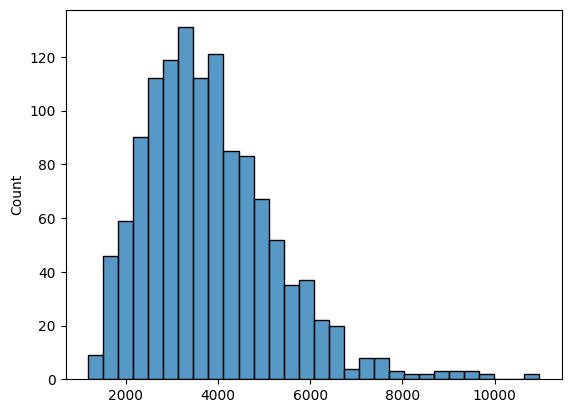

In [21]:
# total number of read per cell
sns.histplot(read_counts.sum(axis=1),bins=30)

<Axes: ylabel='Count'>

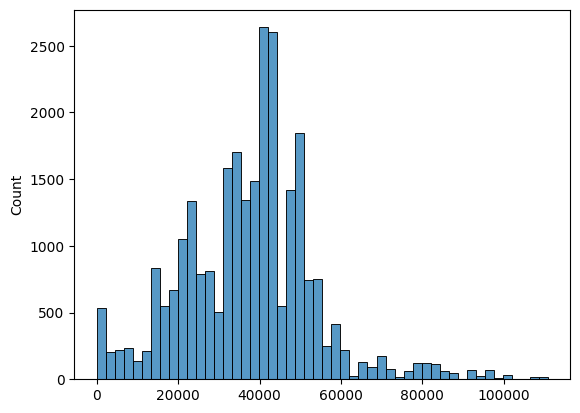

In [248]:
# total coverage per variant 
sns.histplot(covs.sum(axis=0),bins=50)

<Axes: ylabel='Count'>

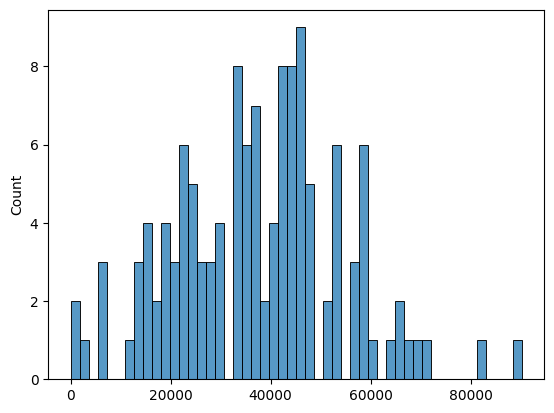

In [6]:
# total coverage per amplicon 
sns.histplot(read_counts.sum(axis=0),bins=50)

First strange thing, some variants have higher coverage than amplicon

### Read count check

In [5]:
amplicons

,CHROM,end_pos,id,r1_counts,r2_counts,start_pos
0,b'1',115256723,b'AML_v2_NRAS_115256512',43222,43124,115256488
1,b'1',115258825,b'AML_v2_NRAS_115258635',36200,36072,115258610
2,b'2',25457372,b'AML_v2_DNMT3A_25457166',25986,25973,25457144
3,b'2',25458763,b'AML_v2_DNMT3A_25458540',48517,48463,25458519
4,b'2',25460046,b'AML_v2_DNMT3A_25459813',13589,13567,25459794
...,...,...,...,...,...,...
122,b'21',36206913,b'AML_v2_RUNX1_36206703',41584,41519,36206684
123,b'21',36231937,b'AML_v2_RUNX1_36231714',22554,22536,36231693
124,b'21',36253046,b'AML_v2_RUNX1_36252844',51341,51276,36252820
125,b'21',44514808,b'AML_v2_U2AF1_44514570',65367,65269,44514550


In [11]:
sum(read_counts.sum(axis=0).values - amplicons.r1_counts) # r1_counts = total read count per ammlicon across all cell

0

In [12]:
sum(read_counts.sum(axis=0).values - amplicons.r2_counts) # r2_counts not total read count per ammlicon across all cell

5192

### Normalization impact

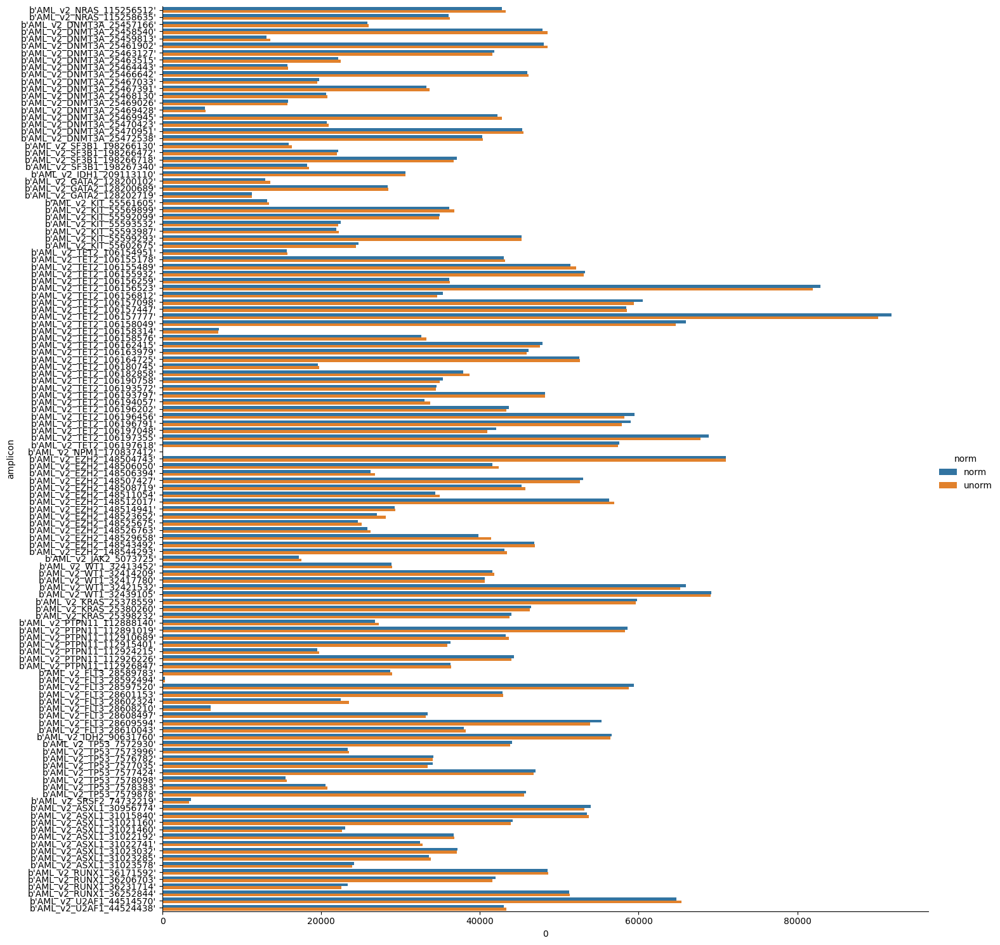

In [4]:
# sum Normalized read count, new read count (prop*sum tot read count cell)

mean_tot_nb_read_cell = read_counts.sum(axis=1).mean()
with_without_norm_read_rank = pd.DataFrame({'amplicon': amplicons.id, 'norm_rank': (read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0).sum(axis=0)*mean_tot_nb_read_cell).values
,'unorm_rank': read_counts.sum(axis=0).values})
with_without_norm_read_rank = with_without_norm_read_rank.set_index('amplicon').stack().reset_index(level=1,drop=True).to_frame()
with_without_norm_read_rank['norm'] = np.array([['norm','unorm'] for _ in range(127)]).flatten()
with_without_norm_read_rank['amplicon'] = with_without_norm_read_rank.index

sns.catplot(
    data=with_without_norm_read_rank, kind="bar",
    x=0, y="amplicon", hue="norm", alpha=1, height=15
)

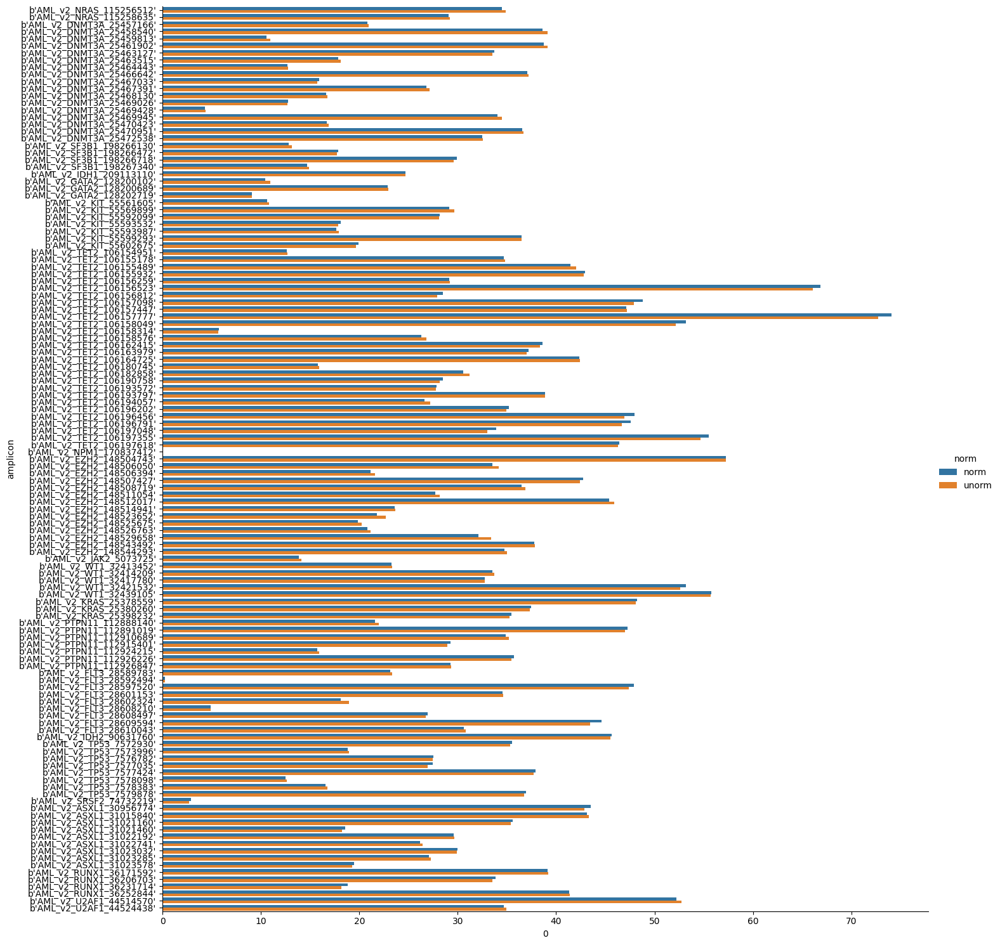

In [64]:
# mean Normalized read count, new read count (prop*mean tot read count cell)

mean_tot_nb_read_cell = read_counts.sum(axis=1).mean()
with_without_norm_read_rank = pd.DataFrame({'amplicon': amplicons.id, 'norm_rank': (read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0).mean(axis=0)*mean_tot_nb_read_cell).values
,'unorm_rank': read_counts.mean(axis=0).values})
with_without_norm_read_rank = with_without_norm_read_rank.set_index('amplicon').stack().reset_index(level=1,drop=True).to_frame()
with_without_norm_read_rank['norm'] = np.array([['norm','unorm'] for _ in range(127)]).flatten()
with_without_norm_read_rank['amplicon'] = with_without_norm_read_rank.index

sns.catplot(
    data=with_without_norm_read_rank, kind="bar",
    x=0, y="amplicon", hue="norm", alpha=1, height=15
)

### Amplicon size influence

<Axes: ylabel='Count'>

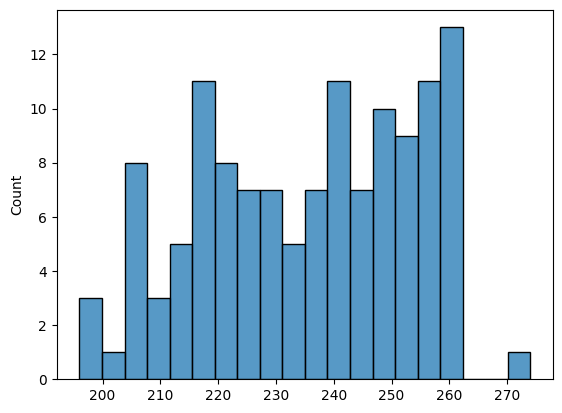

In [15]:
# variance of size of amplicon

sns.histplot(amplicons.end_pos - amplicons.start_pos, bins=20)

<Axes: xlabel='length', ylabel='CHROM'>

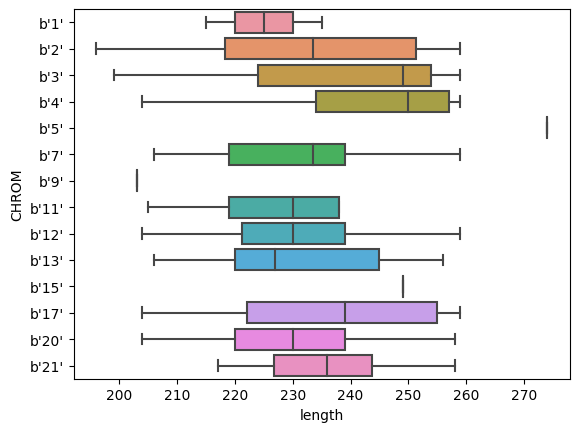

In [66]:
# amplicon size variance in chromosome
sanity_amplicon = amplicons.copy()
sanity_amplicon['length'] = sanity_amplicon.end_pos - sanity_amplicon.start_pos
sanity_amplicon[['CHROM','length']].groupby(['CHROM']).mean()
sns.boxplot(data=sanity_amplicon, x='length',y='CHROM')

<Axes: xlabel='length', ylabel='r1_counts'>

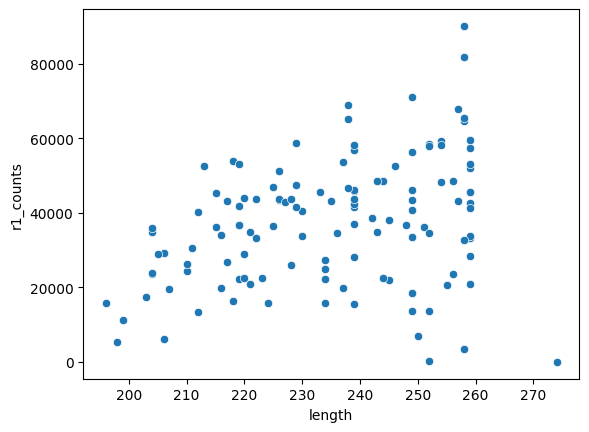

In [73]:
# link between size of amplicon and total read count
sns.scatterplot(data=sanity_amplicon,x='length',y='r1_counts')

In [35]:
# number of amplicon per chomosome
sanity_amplicon.groupby(['CHROM']).count()

,end_pos,id,r1_counts,r2_counts,start_pos,length
CHROM,,,,,,
b'1',2,2,2,2,2,2
b'11',5,5,5,5,5,5
b'12',10,10,10,10,10,10
b'13',9,9,9,9,9,9
b'15',1,1,1,1,1,1
b'17',9,9,9,9,9,9
b'2',22,22,22,22,22,22
b'20',9,9,9,9,9,9
b'21',6,6,6,6,6,6


### Variants per amplicon

In [95]:
# total read count snv of amplicon, different pos snv 
sanity_snv = covs.T.copy()
sanity_snv['sum'] = sanity_snv.sum(axis=1).values
sanity_snv['amplicon'] = variants.amplicon.values
counts = sanity_snv[['sum','amplicon']].groupby(['amplicon']).count().values # nb of variant per amplicon
median_var = sanity_snv[['sum','amplicon']].groupby(['amplicon']).median()
sanity_snv = sanity_snv[['sum','amplicon']].groupby('amplicon').sum()
sanity_snv['count'] = counts

sanity_snv = sanity_snv.join(amplicons[['r1_counts','r2_counts','id']].set_index('id'), on='amplicon')
sanity_snv

,sum,count,r1_counts,r2_counts
amplicon,,,,
b'AML_v2_ASXL1_30956774',11193265,196,53141,53111
b'AML_v2_ASXL1_31015840',10736037,210,53753,53732
b'AML_v2_ASXL1_31021160',10078496,215,43869,43155
b'AML_v2_ASXL1_31021460',5008863,185,22622,23268
b'AML_v2_ASXL1_31022192',8233281,228,36757,36710
...,...,...,...,...
b'AML_v2_WT1_32413452',6440547,174,28945,28925
b'AML_v2_WT1_32414209',9164606,196,41840,41799
b'AML_v2_WT1_32417780',8834845,204,40601,40580


In [16]:
# useless
# total read count snv of amplicon, different pos snv 
sanity_snv = covs.T.copy()
sanity_snv['sum'] = sanity_snv.sum(axis=1).values
sanity_snv['amplicon'] = variants.amplicon.values
sanity_snv['POS'] = variants.POS.values
sanity_snv = sanity_snv.drop_duplicates('POS')
counts = sanity_snv[['sum','amplicon']].groupby(['amplicon']).count().values # nb of variant per amplicon with different position
median_var = sanity_snv[['sum','amplicon']].groupby(['amplicon']).median()
sanity_snv = sanity_snv[['sum','amplicon']].groupby('amplicon').sum()
sanity_snv['count'] = counts

sanity_snv = sanity_snv.join(amplicons[['r1_counts','r2_counts','id']].set_index('id'), on='amplicon')
sanity_snv

,sum,count,r1_counts,r2_counts
amplicon,,,,
b'AML_v2_ASXL1_30956774',10027490,173,53141,53111
b'AML_v2_ASXL1_31015840',9690454,189,53753,53732
b'AML_v2_ASXL1_31021160',8669995,185,43869,43155
b'AML_v2_ASXL1_31021460',4711682,174,22622,23268
b'AML_v2_ASXL1_31022192',7383531,204,36757,36710
...,...,...,...,...
b'AML_v2_WT1_32413452',5812236,156,28945,28925
b'AML_v2_WT1_32414209',8129307,172,41840,41799
b'AML_v2_WT1_32417780',8092142,185,40601,40580


<Axes: xlabel='count', ylabel='Count'>

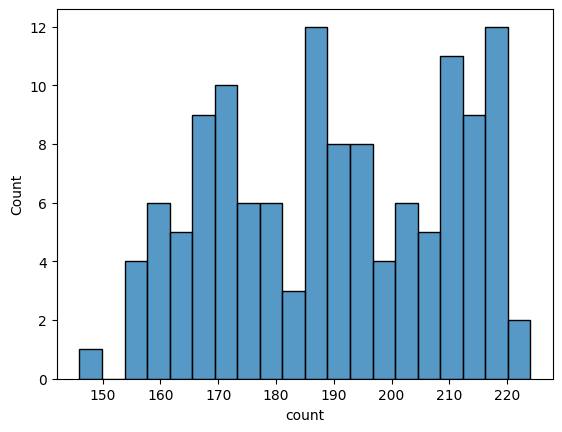

In [17]:
# nb of variant per amplicon
sns.histplot(sanity_snv['count'], bins=20)

<Axes: xlabel='length', ylabel='count'>

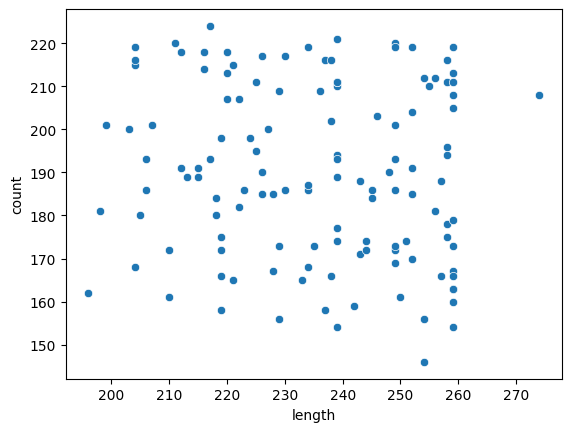

In [256]:
# link between size of amplicon and nb variant
sanity_snv['length'] = (amplicons.end_pos - amplicons.start_pos).values
sns.scatterplot(data=sanity_snv,x='length',y='count')

### Sanity check amplicon read count and variant coverage

Do we have the variant with the max nb of read count accross cells <= total read count of the amplicon it belongs to ? 


In [6]:
covs

,b'chr1:115256513:G/A',b'chr1:115256513:G/T',b'chr1:115256514:G/A',b'chr1:115256515:C/',b'chr1:115256516:A/G',b'chr1:115256516:A/T',b'chr1:115256517:C/',b'chr1:115256518:T/C',b'chr1:115256518:T/G',b'chr1:115256519:G/',...,b'chr21:44524600:T/C',b'chr21:44524601:A/',b'chr21:44524602:C/',b'chr21:44524603:T/',b'chr21:44524604:T/',b'chr21:44524605:T/C',b'chr21:44524606:T/C',b'chr21:44524607:A/',b'chr21:44524608:A/G',b'chr21:44524609:C/'
b'AACAACCTACAGAAGTGA-1',36,36,36,36,36,36,36,36,36,36,...,30,30,30,30,30,30,30,30,28,30
b'AACAACCTATCTATGACA-1',9,9,11,11,11,11,11,11,11,11,...,26,26,26,26,26,26,26,26,26,26
b'AACAACTGGCAACGCACA-1',43,43,43,43,43,43,43,43,43,43,...,26,26,26,26,26,26,26,26,26,26
b'AACACACTCTTACAGTGT-1',51,51,51,51,51,51,51,51,51,51,...,46,46,46,46,46,46,46,46,46,46
b'AACAGCAGTCGTCTGCTG-1',31,31,31,31,31,31,31,31,31,31,...,40,40,40,40,40,40,40,40,40,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',9,9,9,9,9,9,9,9,9,9,...,16,16,16,16,16,16,16,16,16,16
b'TTGGAGAACTGAACTTGC-1',51,51,51,51,51,51,51,51,51,51,...,53,53,53,53,53,53,53,53,53,53
b'TTGGTAACTTCTGCGCTG-1',46,46,46,46,46,46,46,46,46,46,...,45,45,45,45,45,45,45,45,45,45
b'TTGTCAACCGCAGCAGTG-1',50,50,50,50,50,50,50,50,50,50,...,48,48,48,48,48,48,48,48,48,48


In [4]:
snv_read_count = covs.copy()

for col in snv_read_count.columns:
    amplicon = variants.amplicon[variants.id == col].values[0]
    snv_read_count[col] = read_counts[amplicon]

# snv_read_count replace values by read count of associated amplicon for each variant

In [5]:
np.unique(snv_read_count.iloc[0].values).shape # unique values (read count variant) need to be < 127

(57,)

In [6]:
np.unique(read_counts.iloc[0].values).shape # unique values (read count amplicon) (equal !)

(57,)

In [7]:
reda_count_snv_amplicon = covs/snv_read_count # expected all values below 1

In [8]:
reda_count_snv_amplicon

,b'chr1:115256513:G/A',b'chr1:115256513:G/T',b'chr1:115256514:G/A',b'chr1:115256515:C/',b'chr1:115256516:A/G',b'chr1:115256516:A/T',b'chr1:115256517:C/',b'chr1:115256518:T/C',b'chr1:115256518:T/G',b'chr1:115256519:G/',...,b'chr21:44524600:T/C',b'chr21:44524601:A/',b'chr21:44524602:C/',b'chr21:44524603:T/',b'chr21:44524604:T/',b'chr21:44524605:T/C',b'chr21:44524606:T/C',b'chr21:44524607:A/',b'chr21:44524608:A/G',b'chr21:44524609:C/'
b'AACAACCTACAGAAGTGA-1',0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.933333,1.000000
b'AACAACCTATCTATGACA-1',0.818182,0.818182,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'AACAACTGGCAACGCACA-1',0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'AACACACTCTTACAGTGT-1',0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'AACAGCAGTCGTCTGCTG-1',1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'TTGGAGAACTGAACTTGC-1',0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,...,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087
b'TTGGTAACTTCTGCGCTG-1',1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'TTGTCAACCGCAGCAGTG-1',0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [9]:
unique, counts = np.unique(reda_count_snv_amplicon.round(decimals=1).to_numpy(), return_counts=True)

In [10]:
unique

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2,
       1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5,
       2.6, 2.7, 2.8, 3. , 3.5, 4. , 5. , 6. , inf, nan])

In [11]:
counts

array([  185191,    17170,    16761,    50049,   133920,   312373,
         555776,   844814,  1281701,  2072759, 23506637,   391658,
          88493,    38668,    31703,    46557,    44850,    56564,
         109815,   347034,  2370064,    35619,     9852,     2452,
            705,     2105,      175,      419,      143,     2675,
              5,      913,      321,       17,    11907,   798535],
      dtype=int64)

<Axes: ylabel='Count'>

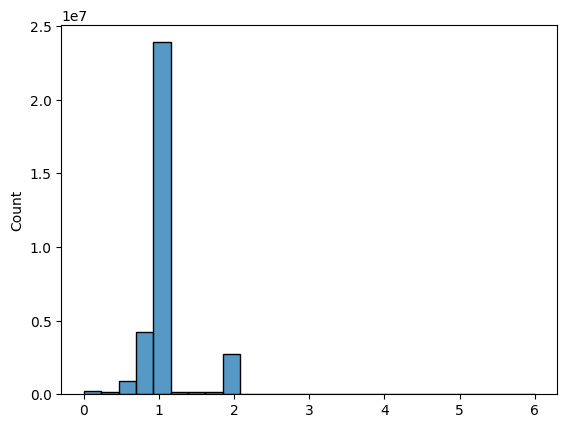

In [12]:
sns.histplot(x=reda_count_snv_amplicon.round(decimals=1).to_numpy().flatten())

In [17]:
unique, counts = np.unique(reda_count_snv_amplicon.replace(np.inf, 0).round(decimals=1).to_numpy(), return_counts=True) # remove inf values

In [18]:
unique, counts

(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2,
        1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5,
        2.6, 2.7, 2.8, 3. , 3.5, 4. , 5. , 6. , nan]),
 array([  197098,    17170,    16761,    50049,   133920,   312373,
          555776,   844814,  1281701,  2072759, 23506637,   391658,
           88493,    38668,    31703,    46557,    44850,    56564,
          109815,   347034,  2370064,    35619,     9852,     2452,
             705,     2105,      175,      419,      143,     2675,
               5,      913,      321,       17,   798535], dtype=int64))

In [20]:
unique, counts = np.unique(reda_count_snv_amplicon.replace(np.inf, 0).gt(1).to_numpy(), return_counts=True) # greater than 1 values 

In [21]:
unique, counts

(array([False,  True]), array([29213122,  4155278], dtype=int64))

what is in read count

In [77]:
max_amplicon = covs.T.copy()
max_amplicon['amplicon'] = variants.amplicon.values
max_amplicon = max_amplicon.groupby('amplicon').max()
max_amplicon = max_amplicon.T
max_amplicon[read_counts.columns] # max variant read count for each amplicon and cell (actual read count ?)

amplicon,b'AML_v2_NRAS_115256512',b'AML_v2_NRAS_115258635',b'AML_v2_DNMT3A_25457166',b'AML_v2_DNMT3A_25458540',b'AML_v2_DNMT3A_25459813',b'AML_v2_DNMT3A_25461902',b'AML_v2_DNMT3A_25463127',b'AML_v2_DNMT3A_25463515',b'AML_v2_DNMT3A_25464443',b'AML_v2_DNMT3A_25466642',...,b'AML_v2_ASXL1_31022741',b'AML_v2_ASXL1_31023032',b'AML_v2_ASXL1_31023285',b'AML_v2_ASXL1_31023578',b'AML_v2_RUNX1_36171592',b'AML_v2_RUNX1_36206703',b'AML_v2_RUNX1_36231714',b'AML_v2_RUNX1_36252844',b'AML_v2_U2AF1_44514570',b'AML_v2_U2AF1_44524438'
b'AACAACCTACAGAAGTGA-1',74,60,46,80,20,51,80,31,48,68,...,38,76,66,40,102,68,65,90,50,60
b'AACAACCTATCTATGACA-1',22,38,50,44,5,26,32,30,54,90,...,25,50,47,50,54,70,66,63,47,52
b'AACAACTGGCAACGCACA-1',86,52,20,46,50,54,58,12,34,62,...,22,71,63,20,96,40,18,72,35,52
b'AACACACTCTTACAGTGT-1',104,62,44,88,8,32,48,24,31,86,...,19,37,72,46,107,94,38,92,53,92
b'AACAGCAGTCGTCTGCTG-1',61,64,84,107,9,52,102,48,42,103,...,28,70,70,42,72,80,72,103,53,80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',17,8,38,38,18,27,57,29,24,47,...,24,34,21,27,50,32,8,26,21,32
b'TTGGAGAACTGAACTTGC-1',108,2,100,94,38,50,107,76,28,103,...,52,103,91,84,105,101,60,110,53,105
b'TTGGTAACTTCTGCGCTG-1',92,92,40,103,62,51,80,40,40,104,...,30,57,76,46,102,98,56,108,54,90
b'TTGTCAACCGCAGCAGTG-1',102,83,40,104,11,62,93,38,42,101,...,29,60,81,29,103,96,46,86,51,96


In [32]:
read_counts

,b'AML_v2_NRAS_115256512',b'AML_v2_NRAS_115258635',b'AML_v2_DNMT3A_25457166',b'AML_v2_DNMT3A_25458540',b'AML_v2_DNMT3A_25459813',b'AML_v2_DNMT3A_25461902',b'AML_v2_DNMT3A_25463127',b'AML_v2_DNMT3A_25463515',b'AML_v2_DNMT3A_25464443',b'AML_v2_DNMT3A_25466642',...,b'AML_v2_ASXL1_31022741',b'AML_v2_ASXL1_31023032',b'AML_v2_ASXL1_31023285',b'AML_v2_ASXL1_31023578',b'AML_v2_RUNX1_36171592',b'AML_v2_RUNX1_36206703',b'AML_v2_RUNX1_36231714',b'AML_v2_RUNX1_36252844',b'AML_v2_U2AF1_44514570',b'AML_v2_U2AF1_44524438'
b'AACAACCTACAGAAGTGA-1',37,30,23,40,20,58,40,16,24,34,...,37,38,33,20,51,34,33,45,53,30
b'AACAACCTATCTATGACA-1',11,19,25,22,5,26,16,15,27,45,...,25,25,24,25,27,35,33,34,47,26
b'AACAACTGGCAACGCACA-1',44,26,10,23,25,52,29,6,17,32,...,19,36,29,10,48,20,9,36,35,26
b'AACACACTCTTACAGTGT-1',59,31,22,44,7,32,24,12,16,43,...,19,18,36,23,75,47,19,46,63,46
b'AACAGCAGTCGTCTGCTG-1',31,32,42,74,9,77,55,24,21,58,...,28,35,35,21,36,40,36,62,61,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',9,4,19,19,9,27,29,14,12,24,...,23,16,11,13,25,16,4,13,21,16
b'TTGGAGAACTGAACTTGC-1',109,1,50,102,19,66,54,38,14,79,...,71,58,45,42,65,51,30,129,133,92
b'TTGGTAACTTCTGCGCTG-1',46,47,20,58,31,60,40,20,20,57,...,30,24,38,23,76,50,28,56,68,45
b'TTGTCAACCGCAGCAGTG-1',69,42,20,52,11,70,47,19,21,58,...,28,30,40,14,79,48,23,44,50,48


seems that read count / 2 but not always 

In [215]:
max_amplicon = covs.T.copy()
max_amplicon['amplicon'] = variants.amplicon.values
max_amplicon = max_amplicon.groupby('amplicon').max()
max_amplicon = max_amplicon.T

# after filtering variants and cells 
sanity_snv = covs.T.copy()
sanity_snv['sum'] = sanity_snv.sum(axis=1).values
sanity_snv['amplicon'] = variants.amplicon.values
sanity_snv = sanity_snv[['sum','amplicon']].groupby('amplicon').max() # variant with max read per amplicon not sum
sanity_snv = sanity_snv.join(amplicons[['r1_counts','r2_counts','id']].set_index('id'), on='amplicon')
sanity_snv['max'] = max_amplicon.sum()
sanity_snv['sum_r1_r2'] = sanity_snv['r1_counts'] + sanity_snv['r2_counts']
sanity_snv

,sum,r1_counts,r2_counts,max,sum_r1_r2
amplicon,,,,,
b'AML_v2_ASXL1_30956774',96748,53141,53111,97053,106252
b'AML_v2_ASXL1_31015840',94131,53753,53732,94397,107485
b'AML_v2_ASXL1_31021160',82671,43869,43155,83015,87024
b'AML_v2_ASXL1_31021460',45419,22622,23268,45528,45890
b'AML_v2_ASXL1_31022192',70378,36757,36710,70526,73467
...,...,...,...,...,...
b'AML_v2_WT1_32413452',57089,28945,28925,57287,57870
b'AML_v2_WT1_32414209',79400,41840,41799,79580,83639
b'AML_v2_WT1_32417780',77764,40601,40580,77966,81181


In [64]:
min_amplicon = covs.T.copy()
min_amplicon['amplicon'] = variants.amplicon.values
min_amplicon = min_amplicon.groupby('amplicon').min()
min_amplicon = min_amplicon.T
min_amplicon[read_counts.columns] # min variant read count for each amplicon and cell (actual read count ?)

amplicon,b'AML_v2_NRAS_115256512',b'AML_v2_NRAS_115258635',b'AML_v2_DNMT3A_25457166',b'AML_v2_DNMT3A_25458540',b'AML_v2_DNMT3A_25459813',b'AML_v2_DNMT3A_25461902',b'AML_v2_DNMT3A_25463127',b'AML_v2_DNMT3A_25463515',b'AML_v2_DNMT3A_25464443',b'AML_v2_DNMT3A_25466642',...,b'AML_v2_ASXL1_31022741',b'AML_v2_ASXL1_31023032',b'AML_v2_ASXL1_31023285',b'AML_v2_ASXL1_31023578',b'AML_v2_RUNX1_36171592',b'AML_v2_RUNX1_36206703',b'AML_v2_RUNX1_36231714',b'AML_v2_RUNX1_36252844',b'AML_v2_U2AF1_44514570',b'AML_v2_U2AF1_44524438'
b'AACAACCTACAGAAGTGA-1',34,29,23,40,1,0,40,15,24,34,...,1,38,33,20,51,34,28,45,0,28
b'AACAACCTATCTATGACA-1',9,19,25,22,0,0,16,15,27,45,...,0,25,23,25,27,35,33,33,0,26
b'AACAACTGGCAACGCACA-1',42,26,9,23,25,2,29,6,17,30,...,3,35,29,10,48,20,9,36,0,26
b'AACACACTCTTACAGTGT-1',41,27,22,43,7,0,23,12,15,43,...,0,15,36,21,53,46,19,46,0,46
b'AACAGCAGTCGTCTGCTG-1',29,32,41,49,2,0,50,24,21,51,...,0,35,35,21,33,40,36,51,0,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',9,4,19,16,9,1,28,14,12,20,...,1,15,10,11,25,16,4,13,0,15
b'TTGGAGAACTGAACTTGC-1',51,1,50,47,19,0,53,38,14,51,...,0,51,45,42,52,50,27,54,0,52
b'TTGGTAACTTCTGCGCTG-1',42,46,20,48,30,0,35,20,20,52,...,0,24,38,23,51,49,28,52,0,45
b'TTGTCAACCGCAGCAGTG-1',48,41,20,44,11,0,44,19,21,48,...,1,30,33,14,51,48,23,43,1,48


In [65]:
read_counts

,b'AML_v2_NRAS_115256512',b'AML_v2_NRAS_115258635',b'AML_v2_DNMT3A_25457166',b'AML_v2_DNMT3A_25458540',b'AML_v2_DNMT3A_25459813',b'AML_v2_DNMT3A_25461902',b'AML_v2_DNMT3A_25463127',b'AML_v2_DNMT3A_25463515',b'AML_v2_DNMT3A_25464443',b'AML_v2_DNMT3A_25466642',...,b'AML_v2_ASXL1_31022741',b'AML_v2_ASXL1_31023032',b'AML_v2_ASXL1_31023285',b'AML_v2_ASXL1_31023578',b'AML_v2_RUNX1_36171592',b'AML_v2_RUNX1_36206703',b'AML_v2_RUNX1_36231714',b'AML_v2_RUNX1_36252844',b'AML_v2_U2AF1_44514570',b'AML_v2_U2AF1_44524438'
b'AACAACCTACAGAAGTGA-1',37,30,23,40,20,58,40,16,24,34,...,37,38,33,20,51,34,33,45,53,30
b'AACAACCTATCTATGACA-1',11,19,25,22,5,26,16,15,27,45,...,25,25,24,25,27,35,33,34,47,26
b'AACAACTGGCAACGCACA-1',44,26,10,23,25,52,29,6,17,32,...,19,36,29,10,48,20,9,36,35,26
b'AACACACTCTTACAGTGT-1',59,31,22,44,7,32,24,12,16,43,...,19,18,36,23,75,47,19,46,63,46
b'AACAGCAGTCGTCTGCTG-1',31,32,42,74,9,77,55,24,21,58,...,28,35,35,21,36,40,36,62,61,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',9,4,19,19,9,27,29,14,12,24,...,23,16,11,13,25,16,4,13,21,16
b'TTGGAGAACTGAACTTGC-1',109,1,50,102,19,66,54,38,14,79,...,71,58,45,42,65,51,30,129,133,92
b'TTGGTAACTTCTGCGCTG-1',46,47,20,58,31,60,40,20,20,57,...,30,24,38,23,76,50,28,56,68,45
b'TTGTCAACCGCAGCAGTG-1',69,42,20,52,11,70,47,19,21,58,...,28,30,40,14,79,48,23,44,50,48


In [69]:
mean_amplicon = covs.T.copy()
mean_amplicon['amplicon'] = variants.amplicon.values
mean_amplicon = mean_amplicon.groupby('amplicon').mean()
mean_amplicon = mean_amplicon.T
mean_amplicon[read_counts.columns] # mean variant read count for each amplicon and cell (actual read count ?)

amplicon,b'AML_v2_NRAS_115256512',b'AML_v2_NRAS_115258635',b'AML_v2_DNMT3A_25457166',b'AML_v2_DNMT3A_25458540',b'AML_v2_DNMT3A_25459813',b'AML_v2_DNMT3A_25461902',b'AML_v2_DNMT3A_25463127',b'AML_v2_DNMT3A_25463515',b'AML_v2_DNMT3A_25464443',b'AML_v2_DNMT3A_25466642',...,b'AML_v2_ASXL1_31022741',b'AML_v2_ASXL1_31023032',b'AML_v2_ASXL1_31023285',b'AML_v2_ASXL1_31023578',b'AML_v2_RUNX1_36171592',b'AML_v2_RUNX1_36206703',b'AML_v2_RUNX1_36231714',b'AML_v2_RUNX1_36252844',b'AML_v2_U2AF1_44514570',b'AML_v2_U2AF1_44524438'
b'AACAACCTACAGAAGTGA-1',39.346847,36.280423,25.653266,41.203390,19.918367,49.646825,42.306667,18.112821,32.526316,34.288793,...,36.021368,40.154930,36.592417,25.344262,53.039823,37.762791,33.943925,50.959391,48.034335,35.447917
b'AACAACCTATCTATGACA-1',11.855856,22.920635,27.869347,22.656780,4.979592,25.488095,16.920000,17.220513,36.748538,45.405172,...,24.256410,26.408451,25.981043,31.622951,28.057522,38.897674,34.084112,36.934010,45.605150,30.729167
b'AACAACTGGCAACGCACA-1',46.657658,31.650794,11.442211,23.978814,25.102041,51.408730,30.915556,6.958974,23.140351,31.767241,...,16.551282,37.713615,35.962085,12.841530,50.353982,22.353488,9.383178,41.071066,33.776824,30.927083
b'AACACACTCTTACAGTGT-1',56.031532,36.582011,24.577889,45.283898,7.004082,31.440476,25.302222,13.841026,21.011696,43.556034,...,17.324786,20.215962,40.118483,29.136612,55.982301,52.381395,19.705607,52.269036,50.154506,54.619792
b'AACAGCAGTCGTCTGCTG-1',33.018018,38.560847,46.949749,55.398305,8.955102,50.277778,54.208889,27.584615,28.456140,52.077586,...,27.166667,36.953052,38.611374,26.568306,37.393805,44.367442,37.172897,58.035533,50.819742,47.260417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',9.761261,4.867725,21.336683,19.834746,9.036735,26.702381,30.288889,16.948718,16.473684,23.607759,...,20.824786,18.807512,11.563981,17.442623,26.230088,17.916279,4.168224,14.837563,20.557940,18.489583
b'TTGGAGAACTGAACTTGC-1',58.409910,1.216931,56.266332,54.932203,19.077551,49.408730,57.293333,44.010256,19.198830,52.504310,...,50.525641,54.765258,51.052133,53.748634,54.929204,56.427907,31.257009,63.162437,51.888412,62.828125
b'TTGGTAACTTCTGCGCTG-1',49.747748,56.190476,22.608040,53.851695,31.142857,50.238095,42.804444,23.276923,27.619883,53.116379,...,24.235043,31.610329,42.682464,29.573770,54.216814,55.102326,29.308411,61.360406,51.296137,53.854167
b'TTGTCAACCGCAGCAGTG-1',54.630631,50.656085,22.467337,53.754237,11.000000,56.111111,49.804444,21.917949,28.725146,50.931034,...,26.106838,31.779343,45.208531,18.448087,54.115044,53.502326,23.873832,48.873096,48.806867,56.979167


In [67]:
read_counts

,b'AML_v2_NRAS_115256512',b'AML_v2_NRAS_115258635',b'AML_v2_DNMT3A_25457166',b'AML_v2_DNMT3A_25458540',b'AML_v2_DNMT3A_25459813',b'AML_v2_DNMT3A_25461902',b'AML_v2_DNMT3A_25463127',b'AML_v2_DNMT3A_25463515',b'AML_v2_DNMT3A_25464443',b'AML_v2_DNMT3A_25466642',...,b'AML_v2_ASXL1_31022741',b'AML_v2_ASXL1_31023032',b'AML_v2_ASXL1_31023285',b'AML_v2_ASXL1_31023578',b'AML_v2_RUNX1_36171592',b'AML_v2_RUNX1_36206703',b'AML_v2_RUNX1_36231714',b'AML_v2_RUNX1_36252844',b'AML_v2_U2AF1_44514570',b'AML_v2_U2AF1_44524438'
b'AACAACCTACAGAAGTGA-1',37,30,23,40,20,58,40,16,24,34,...,37,38,33,20,51,34,33,45,53,30
b'AACAACCTATCTATGACA-1',11,19,25,22,5,26,16,15,27,45,...,25,25,24,25,27,35,33,34,47,26
b'AACAACTGGCAACGCACA-1',44,26,10,23,25,52,29,6,17,32,...,19,36,29,10,48,20,9,36,35,26
b'AACACACTCTTACAGTGT-1',59,31,22,44,7,32,24,12,16,43,...,19,18,36,23,75,47,19,46,63,46
b'AACAGCAGTCGTCTGCTG-1',31,32,42,74,9,77,55,24,21,58,...,28,35,35,21,36,40,36,62,61,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',9,4,19,19,9,27,29,14,12,24,...,23,16,11,13,25,16,4,13,21,16
b'TTGGAGAACTGAACTTGC-1',109,1,50,102,19,66,54,38,14,79,...,71,58,45,42,65,51,30,129,133,92
b'TTGGTAACTTCTGCGCTG-1',46,47,20,58,31,60,40,20,20,57,...,30,24,38,23,76,50,28,56,68,45
b'TTGTCAACCGCAGCAGTG-1',69,42,20,52,11,70,47,19,21,58,...,28,30,40,14,79,48,23,44,50,48


In [74]:
abs(mean_amplicon[read_counts.columns].round(decimals=0) - read_counts).sum().sum()

693990.0

In [75]:
abs(min_amplicon[read_counts.columns] - read_counts).sum().sum()

1645791

In [78]:
abs(max_amplicon[read_counts.columns] - read_counts).sum().sum()

3116088

In [94]:
quantile_amplicon = covs.T.copy()
quantile_amplicon['amplicon'] = variants.amplicon.values
quantile_amplicon = quantile_amplicon.groupby('amplicon').quantile(q=0.6)
quantile_amplicon = quantile_amplicon.T
quantile_amplicon[read_counts.columns] # mean variant read count for each amplicon and cell (actual read count ?)

print("total error :", abs(quantile_amplicon[read_counts.columns].round(decimals=0) - read_counts).sum().sum())
print("mean error per value :", abs(quantile_amplicon[read_counts.columns].round(decimals=0) - read_counts).sum().sum()//quantile_amplicon.size)

total error : 386933.0
mean error per value : 2.0


In [96]:
abs(quantile_amplicon[read_counts.columns].round(decimals=0) - read_counts)

amplicon,b'AML_v2_NRAS_115256512',b'AML_v2_NRAS_115258635',b'AML_v2_DNMT3A_25457166',b'AML_v2_DNMT3A_25458540',b'AML_v2_DNMT3A_25459813',b'AML_v2_DNMT3A_25461902',b'AML_v2_DNMT3A_25463127',b'AML_v2_DNMT3A_25463515',b'AML_v2_DNMT3A_25464443',b'AML_v2_DNMT3A_25466642',...,b'AML_v2_ASXL1_31022741',b'AML_v2_ASXL1_31023032',b'AML_v2_ASXL1_31023285',b'AML_v2_ASXL1_31023578',b'AML_v2_RUNX1_36171592',b'AML_v2_RUNX1_36206703',b'AML_v2_RUNX1_36231714',b'AML_v2_RUNX1_36252844',b'AML_v2_U2AF1_44514570',b'AML_v2_U2AF1_44524438'
b'AACAACCTACAGAAGTGA-1',0.0,1.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
b'AACAACCTATCTATGACA-1',0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
b'AACAACTGGCAACGCACA-1',1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,4.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
b'AACACACTCTTACAGTGT-1',6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,0.0,0.0,22.0,0.0,0.0,0.0,10.0,0.0
b'AACAGCAGTCGTCTGCTG-1',0.0,0.0,0.0,18.0,0.0,25.0,3.0,0.0,0.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,9.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,3.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
b'TTGGAGAACTGAACTTGC-1',52.0,0.0,0.0,45.0,0.0,16.0,0.0,0.0,0.0,27.0,...,19.0,6.0,1.0,0.0,13.0,0.0,0.0,73.0,80.0,39.0
b'TTGGTAACTTCTGCGCTG-1',0.0,1.0,0.0,6.0,0.0,9.0,0.0,0.0,0.0,5.0,...,9.0,9.0,0.0,0.0,24.0,1.0,0.0,0.0,17.0,0.0
b'TTGTCAACCGCAGCAGTG-1',17.0,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,7.0,...,2.0,0.0,1.0,1.0,27.0,0.0,0.0,1.0,0.0,0.0


In [126]:
print(variants[['POS','amplicon']].drop_duplicates().shape) # 24110 positions, unique position id (drop only if same amplicon same position)
print(variants.drop_duplicates('POS').shape) # drop only if same pos 

(24110, 2)
(24110, 10)


There are 24110 different variant positions, we need to check is variant in same position have different coverage values 

In [218]:
# total read count snv of amplicon, different pos snv 
sanity_snv = covs.T.copy()
sanity_snv['sum'] = sanity_snv.sum(axis=1).values
sanity_snv['amplicon'] = variants.amplicon.values
sanity_snv['POS'] = variants.POS.values
#sanity_snv = sanity_snv.drop_duplicates('POS')

"""counts = sanity_snv[['sum','amplicon']].groupby(['amplicon']).count().values
median_var = sanity_snv[['sum','amplicon']].groupby(['amplicon']).median()
sanity_snv = sanity_snv[['sum','amplicon']].groupby('amplicon').sum()
sanity_snv['count'] = counts

sanity_snv = sanity_snv.join(amplicons[['r1_counts','r2_counts','id']].set_index('id'), on='amplicon')
sanity_snv"""

print("Size of different rows so unique variants value combinations:",sanity_snv.drop_duplicates().shape) # so same positions implies same coverages 

Size of different rows so unique variants value combinations: (24110, 1243)


<Axes: xlabel='POS', ylabel="b'AACAACCTATCTATGACA-1'">

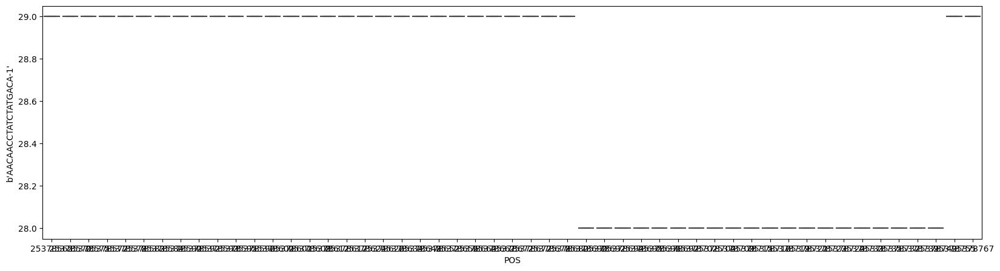

In [190]:
rd_var_same_pos = sanity_snv.copy()
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.duplicated(keep=False)]
amplicon_with_max_var_same_pos = rd_var_same_pos.groupby('amplicon').count().sort_values('sum',ascending=False).index[0]
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.amplicon == amplicon_with_max_var_same_pos].drop(['sum','amplicon'],axis=1)
rd_var_same_pos['POS'] = rd_var_same_pos['POS'].apply(str)

cell = b'AACAACCTATCTATGACA-1'# b'AACAACCTACAGAAGTGA-1' 
plt.figure(figsize=(20,5))
sns.boxplot(data = rd_var_same_pos[[cell,'POS']], x='POS', y=cell)

In [195]:
rd_var_same_pos.groupby('POS').count().head()

,b'AACAACCTACAGAAGTGA-1',b'AACAACCTATCTATGACA-1',b'AACAACTGGCAACGCACA-1',b'AACACACTCTTACAGTGT-1',b'AACAGCAGTCGTCTGCTG-1',b'AACAGCAGTGATGCTCCT-1',b'AACCGCTGAAACAACCTA-1',b'AACCGCTGAACCACGCTA-1',b'AACGCATTGCGTTAATGG-1',b'AACGCCTACACCATACTT-1',...,b'TTGCAGTCATGCTATGAA-1',b'TTGCCAGATATGGACGTT-1',b'TTGCCAGATTCCTTCGTA-1',b'TTGCCGTAGAGATGAGAT-1',b'TTGCCGTAGGAGGTGAGC-1',b'TTGGACTTCCGCTTATGA-1',b'TTGGAGAACTGAACTTGC-1',b'TTGGTAACTTCTGCGCTG-1',b'TTGTCAACCGCAGCAGTG-1',b'TTGTTAGAGAATCTCCTA-1'
POS,,,,,,,,,,,,,,,,,,,,,
25378565,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
25378570,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
25378575,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
25378577,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
25378578,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2


We were expected for one region covered by the panel that all positions have the same coverage( perfect mappability) but some variabilities for the coverage of variant in the same position

<Axes: xlabel='POS', ylabel="b'AACAACCTACAGAAGTGA-1'">

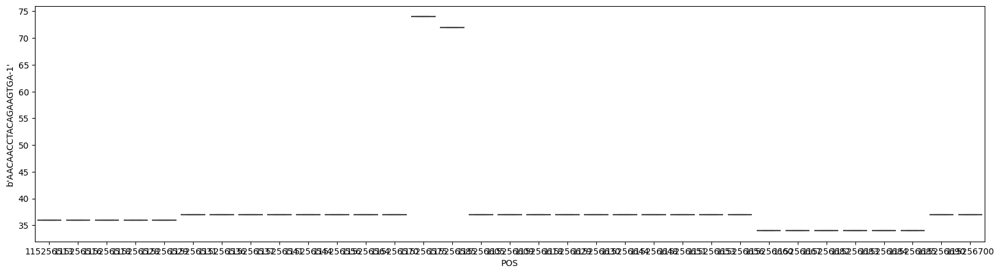

In [235]:
rd_var_same_pos = sanity_snv.copy()
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.duplicated(keep=False)]
amplicon_check = b'AML_v2_NRAS_115256512'
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.amplicon == amplicon_check].drop(['sum','amplicon'],axis=1)
rd_var_same_pos['POS'] = rd_var_same_pos['POS'].apply(str)

cell = b'AACAACCTACAGAAGTGA-1'# b'AACAACCTATCTATGACA-1'# b'AACAACCTACAGAAGTGA-1' 
plt.figure(figsize=(20,5))
sns.boxplot(data = rd_var_same_pos[[cell,'POS']].sort_values('POS'), x='POS', y=cell)

<Axes: xlabel='POS', ylabel="b'AACAACCTACAGAAGTGA-1'">

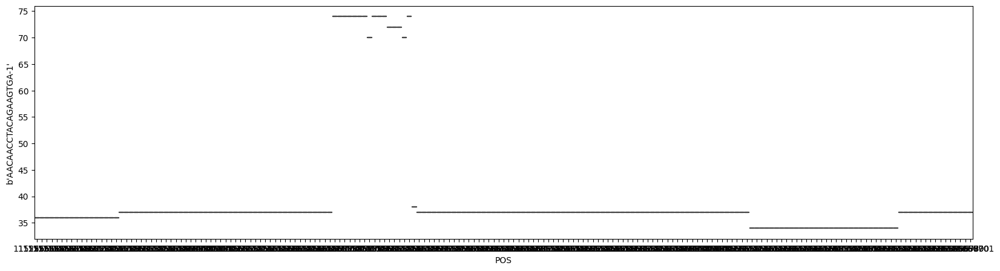

In [229]:
rd_var_same_pos = sanity_snv.copy()
#rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.duplicated(keep=False)]
amplicon_check = b'AML_v2_NRAS_115256512'
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.amplicon == amplicon_check].drop(['sum','amplicon'],axis=1)
rd_var_same_pos['POS'] = rd_var_same_pos['POS'].apply(str)

cell = b'AACAACCTACAGAAGTGA-1'# b'AACAACCTATCTATGACA-1'# b'AACAACCTACAGAAGTGA-1' 
plt.figure(figsize=(20,5))
sns.boxplot(data = rd_var_same_pos[[cell,'POS']].sort_values('POS'), x='POS', y=cell)

<Axes: xlabel='sum', ylabel='Count'>

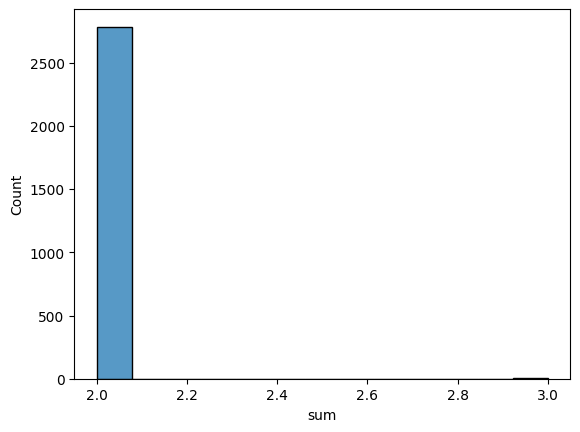

In [236]:
rd_var_same_pos = sanity_snv.copy()
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.duplicated(keep=False)]
"""amplicon_with_max_var_same_pos = rd_var_same_pos.groupby('amplicon').count().sort_values('sum',ascending=False).index[0]
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.amplicon == amplicon_with_max_var_same_pos].drop(['sum','amplicon'],axis=1)
rd_var_same_pos['POS'] = rd_var_same_pos['POS'].apply(str)"""
rd_var_same_pos

# nb of different variant at same position
sns.histplot(rd_var_same_pos.groupby(['POS']).count()['sum'])

In [214]:
(rd_var_same_pos.drop(columns='amplicon').groupby('POS').max() - rd_var_same_pos.drop(columns='amplicon').groupby('POS').min()).sum().sum() # all variants in same position has same coverages (max = min)

0

In [134]:
sanity_snv.drop_duplicates().groupby('amplicon').sum()

,b'AACAACCTACAGAAGTGA-1',b'AACAACCTATCTATGACA-1',b'AACAACTGGCAACGCACA-1',b'AACACACTCTTACAGTGT-1',b'AACAGCAGTCGTCTGCTG-1',b'AACAGCAGTGATGCTCCT-1',b'AACCGCTGAAACAACCTA-1',b'AACCGCTGAACCACGCTA-1',b'AACGCATTGCGTTAATGG-1',b'AACGCCTACACCATACTT-1',...,b'TTGCCAGATTCCTTCGTA-1',b'TTGCCGTAGAGATGAGAT-1',b'TTGCCGTAGGAGGTGAGC-1',b'TTGGACTTCCGCTTATGA-1',b'TTGGAGAACTGAACTTGC-1',b'TTGGTAACTTCTGCGCTG-1',b'TTGTCAACCGCAGCAGTG-1',b'TTGTTAGAGAATCTCCTA-1',sum,POS
amplicon,,,,,,,,,,,,,,,,,,,,,
b'AML_v2_ASXL1_30956774',7797,9224,8697,10489,10580,11099,7414,9417,6353,10692,...,8274,8236,11333,7038,11386,11197,10664,8199,10027490,5355536953
b'AML_v2_ASXL1_31015840',8496,7503,9639,10811,10338,10374,7751,10194,7841,10467,...,10457,7146,10740,7376,10384,10430,8961,10678,9690454,5862011715
b'AML_v2_ASXL1_31021160',8115,6441,8369,8343,10473,7353,7306,10401,6122,10813,...,8568,6142,6219,5143,10759,10541,8861,10677,8669995,5738931805
b'AML_v2_ASXL1_31021460',3485,1435,4562,5557,6573,2993,4942,4530,1846,7009,...,3934,1155,869,4112,9052,7068,4040,5047,4711682,5397749265
b'AML_v2_ASXL1_31022192',6008,2484,5435,5611,7865,10350,4784,6031,6812,6441,...,10530,2497,5616,3968,10720,10470,7451,0,7383531,6328548078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'AML_v2_WT1_32413452',7352,4589,3007,3453,5458,8884,4650,9539,4243,7309,...,6112,3248,4460,2449,10659,4303,7295,9824,5812236,5056510758
b'AML_v2_WT1_32414209',5684,10276,6781,10712,6495,9949,5709,10163,7985,9793,...,10989,4283,4277,4308,11032,8035,10513,10351,8129307,5575258944
b'AML_v2_WT1_32417780',6384,7227,5436,7450,8656,10499,6824,8477,8445,10349,...,10501,6383,2898,3952,11177,9617,7449,10323,8092142,5997306505


<Axes: xlabel='amplicon', ylabel="b'AACAACCTACAGAAGTGA-1'">

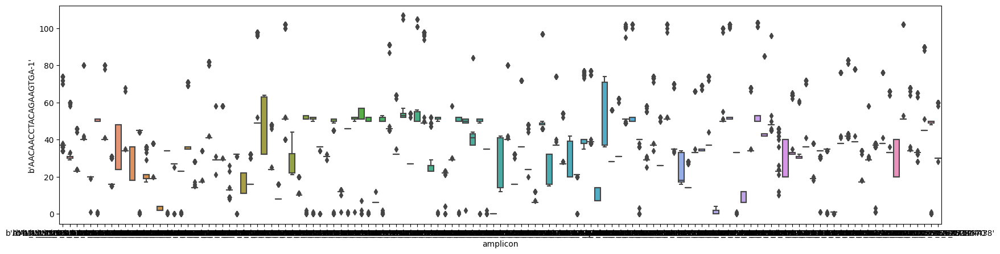

In [151]:
cell = b'AACAACCTACAGAAGTGA-1'
data = sanity_snv.drop_duplicates()[[cell,'amplicon']]  #.groupby('amplicon').min() #- sanity_snv.drop_duplicates().groupby('amplicon').min()
plt.figure(figsize=(20,5))
sns.boxplot(data = data, x="amplicon", y = cell	) # no normalization

In [114]:
variants.groupby(['amplicon','POS']).count()

ALT  CHROM  QUAL  REF  ado_gt_cells   
amplicon                 POS                                             
b'AML_v2_ASXL1_30956774' 30956775    1      1     1    1             1  \
                         30956776    1      1     1    1             1   
                         30956777    1      1     1    1             1   
                         30956778    2      2     2    2             2   
                         30956779    1      1     1    1             1   
...                                ...    ...   ...  ...           ...   
b'AML_v2_WT1_32439105'   32439294    1      1     1    1             1   
                         32439295    1      1     1    1             1   
                         32439296    1      1     1    1             1   
                         32439297    1      1     1    1             1   
                         32439298    2      2     2    2             2   

                                   ado_rate  filtered  id  
amplicon                 POS                               
b'AML_v2_ASXL1_30956774' 30956775         1         1   1  
                         30956776         1         1   1  
                         30956777         1         1   1  
                         30956778         2         2   2  
                         30956779         1         1   1  
...                                     ...       ...  ..  
b'AML_v2_WT1_32439105'   32439294         1         1   1  
                         32439295         1         1   1  
                         32439296         1         1   1  
                         32439297         1         1   1  
                         32439298         2         2   2  

[24110 rows x 8 columns]

In [4]:
sanity_snv = covs.T.copy()
sanity_snv['sum'] = sanity_snv.sum(axis=1).values
sanity_snv['amplicon'] = variants.amplicon.values
sanity_snv['POS'] = variants.POS.values
sanity_snv.groupby('amplicon').nunique()

,b'AACAACCTACAGAAGTGA-1',b'AACAACCTATCTATGACA-1',b'AACAACTGGCAACGCACA-1',b'AACACACTCTTACAGTGT-1',b'AACAGCAGTCGTCTGCTG-1',b'AACAGCAGTGATGCTCCT-1',b'AACCGCTGAAACAACCTA-1',b'AACCGCTGAACCACGCTA-1',b'AACGCATTGCGTTAATGG-1',b'AACGCCTACACCATACTT-1',...,b'TTGCCAGATTCCTTCGTA-1',b'TTGCCGTAGAGATGAGAT-1',b'TTGCCGTAGGAGGTGAGC-1',b'TTGGACTTCCGCTTATGA-1',b'TTGGAGAACTGAACTTGC-1',b'TTGGTAACTTCTGCGCTG-1',b'TTGTCAACCGCAGCAGTG-1',b'TTGTTAGAGAATCTCCTA-1',sum,POS
amplicon,,,,,,,,,,,,,,,,,,,,,
b'AML_v2_ASXL1_30956774',4,5,4,6,6,5,4,7,4,7,...,4,6,5,4,4,7,7,4,107,173
b'AML_v2_ASXL1_31015840',5,5,5,7,6,6,4,5,6,7,...,5,5,9,5,4,5,6,6,124,189
b'AML_v2_ASXL1_31021160',3,4,7,5,5,5,4,7,4,6,...,5,4,4,7,5,6,5,7,114,185
b'AML_v2_ASXL1_31021460',4,2,7,4,4,5,3,5,3,4,...,4,5,4,8,8,3,3,6,84,174
b'AML_v2_ASXL1_31022192',4,2,3,6,4,2,2,4,4,3,...,6,3,2,5,6,7,5,1,141,204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'AML_v2_WT1_32413452',5,6,6,3,4,5,4,4,6,6,...,4,6,3,3,6,3,9,8,78,156
b'AML_v2_WT1_32414209',2,4,7,7,5,5,5,6,6,4,...,9,3,4,5,9,6,7,4,113,172
b'AML_v2_WT1_32417780',3,4,6,3,5,6,4,3,4,4,...,8,3,2,2,8,5,5,7,97,185


<Axes: xlabel='amplicon'>

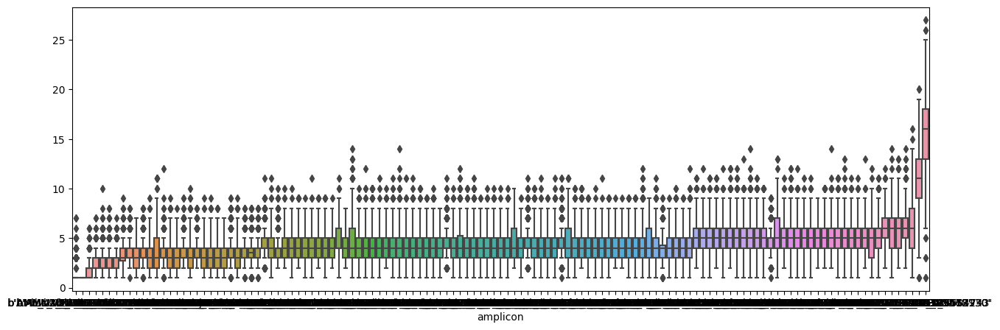

In [13]:
diff_rc_amplicon = sanity_snv.groupby('amplicon').nunique().drop(['sum','POS'], axis=1).T
plt.figure(figsize=(15,5))
sns.boxplot(data = diff_rc_amplicon[diff_rc_amplicon.median().sort_values().index]) 

## CNA amplicon

## read count and mean cov/ amplicon comparison

#### read count norm + cluster

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


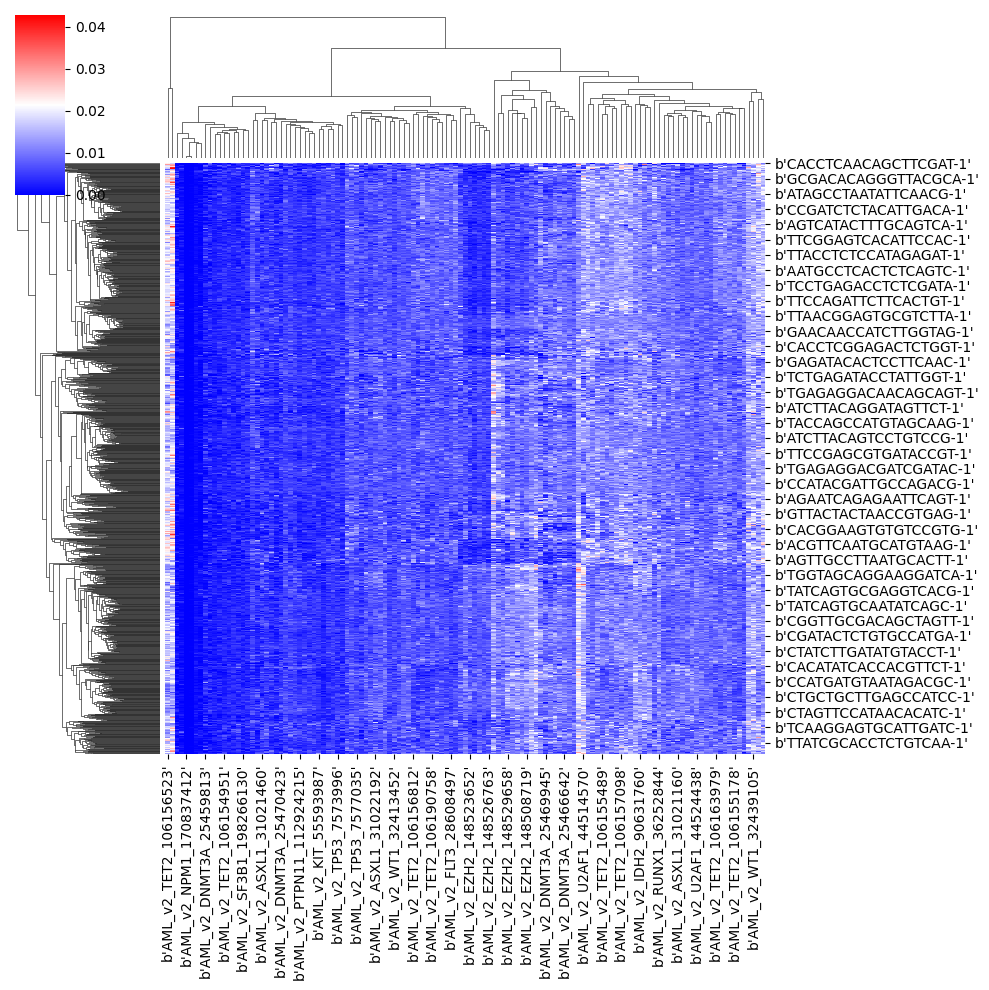

In [4]:
#mean_tot_nb_read_cell = read_counts.sum(axis=1).mean()
read_cluster = sns.clustermap((read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0)), col_cluster=True, cmap="bwr",method='weighted', metric = 'euclidean' ) # cluster after normalization*
read_cluster

#### mean coverage / amplicon

In [5]:
variants[['id','amplicon']].drop_duplicates().set_index('id').amplicon

id
b'chr1:115256513:G/A'    b'AML_v2_NRAS_115256512'
b'chr1:115256513:G/T'    b'AML_v2_NRAS_115256512'
b'chr1:115256514:G/A'    b'AML_v2_NRAS_115256512'
b'chr1:115256515:C/'     b'AML_v2_NRAS_115256512'
b'chr1:115256516:A/G'    b'AML_v2_NRAS_115256512'
                                   ...           
b'chr21:44524605:T/C'    b'AML_v2_U2AF1_44524438'
b'chr21:44524606:T/C'    b'AML_v2_U2AF1_44524438'
b'chr21:44524607:A/'     b'AML_v2_U2AF1_44524438'
b'chr21:44524608:A/G'    b'AML_v2_U2AF1_44524438'
b'chr21:44524609:C/'     b'AML_v2_U2AF1_44524438'
Name: amplicon, Length: 26910, dtype: object

In [6]:
covs_df= covs.unstack().reset_index().rename(columns = {'level_0':'variant','level_1':'cell',0:"counts"})
covs_df['amplicon'] = covs_df.variant.map(variants[['id','amplicon']].drop_duplicates().set_index('id').amplicon)
covs_df = covs_df.groupby(['cell','amplicon']).counts.median().reset_index()

#### mean coverage / amplicon + norm + cmuster

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


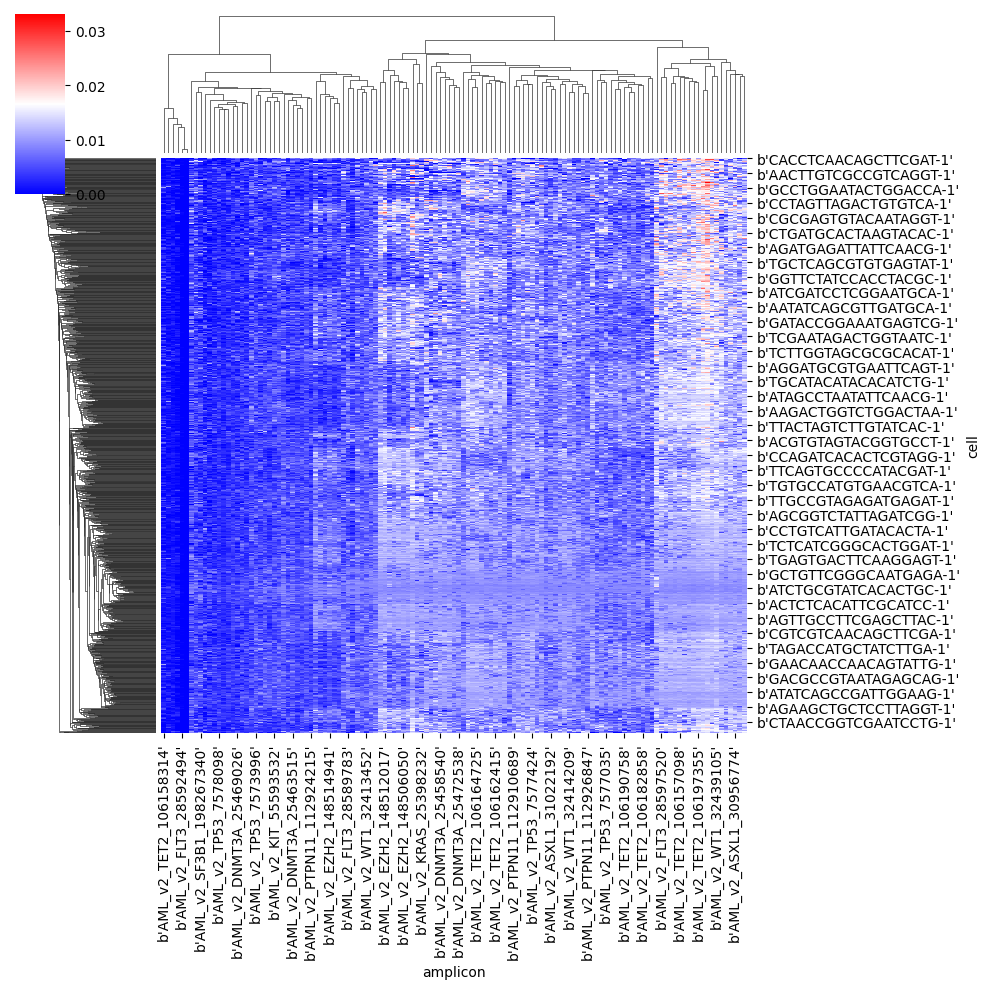

In [7]:
covs_table = covs_df.pivot_table(index='cell',columns = 'amplicon',values = 'counts',aggfunc = 'first')
sns.clustermap(covs_table.apply(lambda x : x/covs_table.sum(axis=1), axis=0),cmap="bwr")

#### read count + norm + cluster  heatmap

<Axes: >

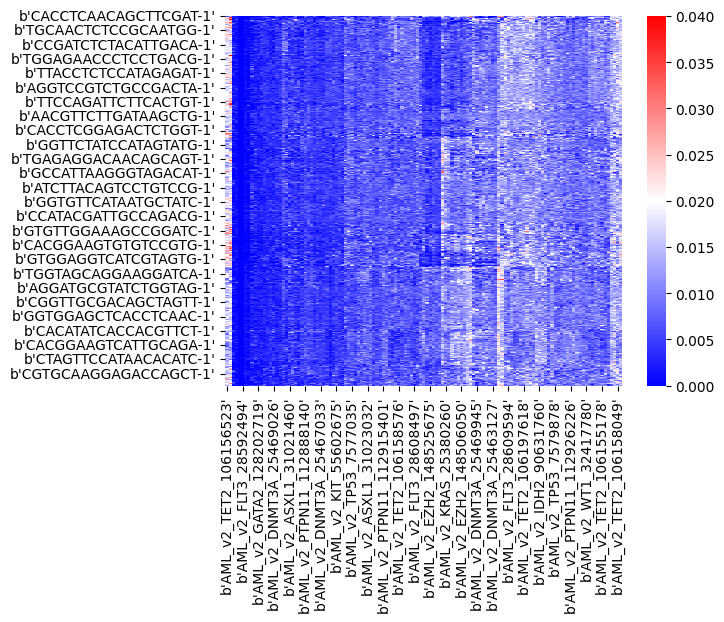

In [8]:
read_counts_reorder = read_counts.copy()
read_counts_reorder = read_counts_reorder[read_counts_reorder.columns.values[read_cluster.dendrogram_col.reordered_ind]]
read_counts_reorder = read_counts_reorder.reindex(read_counts_reorder.index.values[read_cluster.dendrogram_row.reordered_ind])
sns.heatmap(read_counts_reorder.apply(lambda x : x/read_counts_reorder.sum(axis=1), axis=0),cmap="bwr", vmax= 0.04)

#### mean cov / amplicon + norm + reorder by cluster read count norm + heatmap

<Axes: xlabel='amplicon', ylabel='cell'>

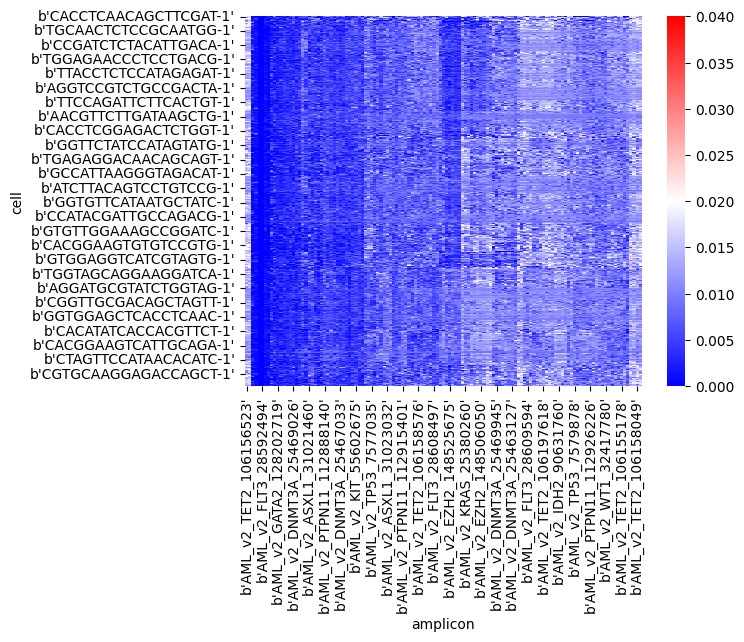

In [9]:
covs_table_reorder = covs_table.copy()
covs_table_reorder = covs_table_reorder[read_counts.columns.values[read_cluster.dendrogram_col.reordered_ind]]
covs_table_reorder = covs_table_reorder.reindex(read_counts.index.values[read_cluster.dendrogram_row.reordered_ind])
sns.heatmap(covs_table_reorder.apply(lambda x : x/covs_table_reorder.sum(axis=1), axis=0),cmap="bwr", vmax=0.04)

# Other clustermap

c:\Users\sophi\anaconda3\envs\tapestri\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
c:\Users\sophi\anaconda3\envs\tapestri\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


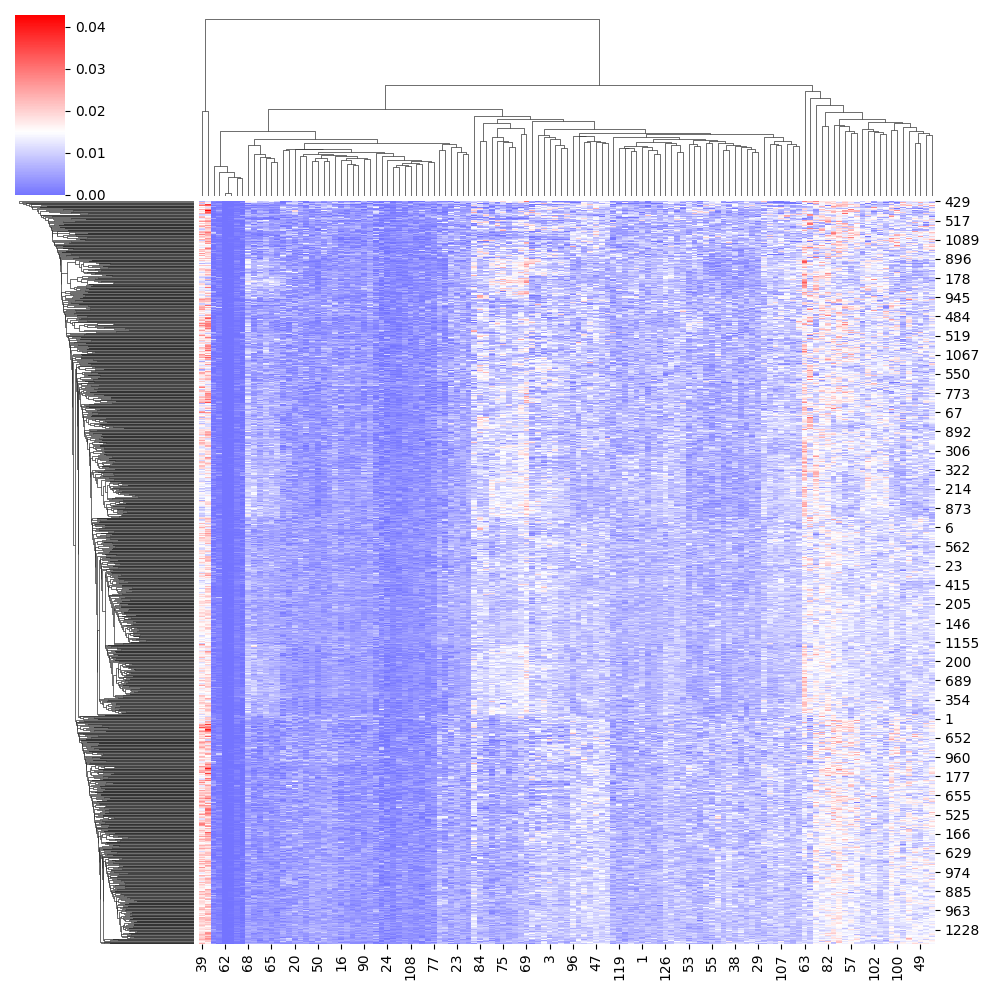

In [10]:
sns.clustermap((read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0)).to_numpy(), col_cluster=True, cmap="bwr", center = 0.015) # cluster after normalization

In [9]:
read_counts.unstack().reset_index()

,level_0,level_1,0
0,b'AML_v2_NRAS_115256512',b'AACAACCTACAGAAGTGA-1',37
1,b'AML_v2_NRAS_115256512',b'AACAACCTATCTATGACA-1',11
2,b'AML_v2_NRAS_115256512',b'AACAACTGGCAACGCACA-1',44
3,b'AML_v2_NRAS_115256512',b'AACACACTCTTACAGTGT-1',59
4,b'AML_v2_NRAS_115256512',b'AACAGCAGTCGTCTGCTG-1',31
...,...,...,...
157475,b'AML_v2_U2AF1_44524438',b'TTGGACTTCCGCTTATGA-1',16
157476,b'AML_v2_U2AF1_44524438',b'TTGGAGAACTGAACTTGC-1',92
157477,b'AML_v2_U2AF1_44524438',b'TTGGTAACTTCTGCGCTG-1',45
157478,b'AML_v2_U2AF1_44524438',b'TTGTCAACCGCAGCAGTG-1',48


c:\Users\sophi\anaconda3\envs\tapestri\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


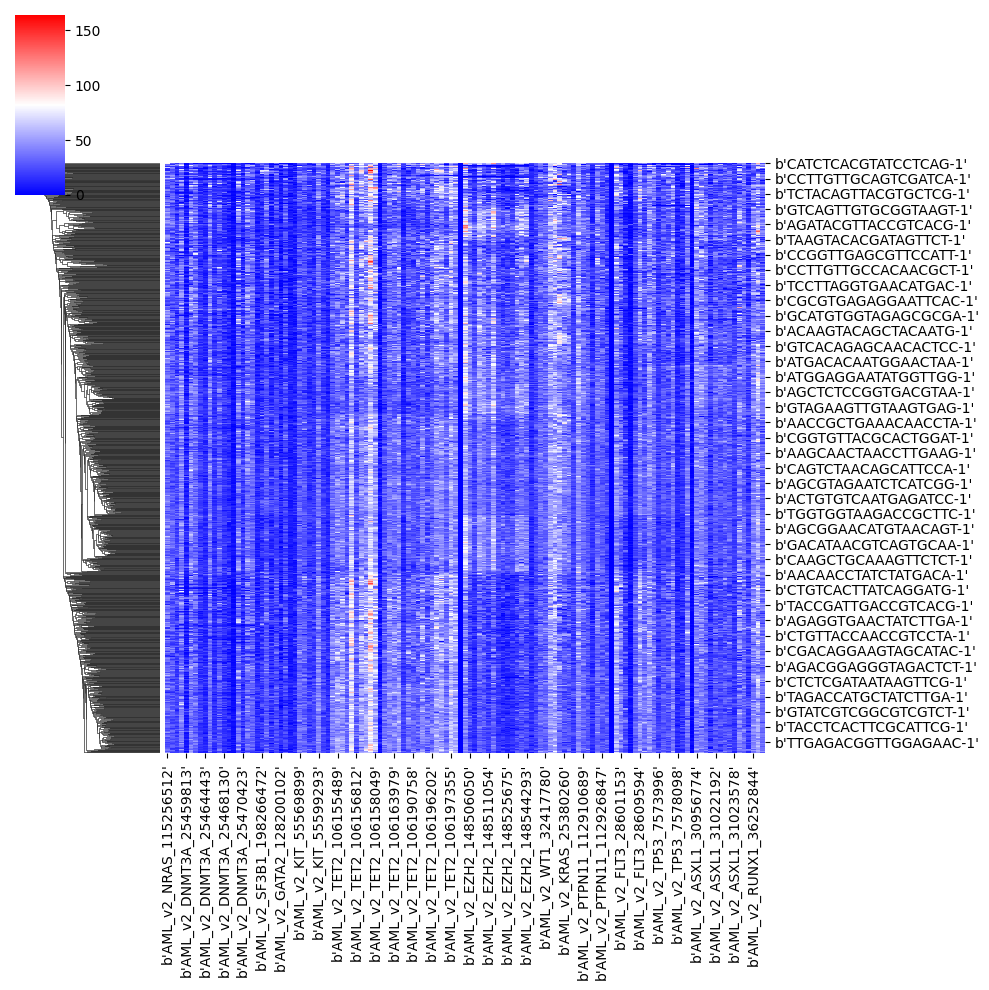

In [79]:
mean_tot_nb_read_cell = read_counts.sum(axis=1).mean()
sns.clustermap(read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0)*mean_tot_nb_read_cell, col_cluster=False, cmap="bwr") # cluster after normalization and new magnitude

c:\Users\sophi\anaconda3\envs\tapestri\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


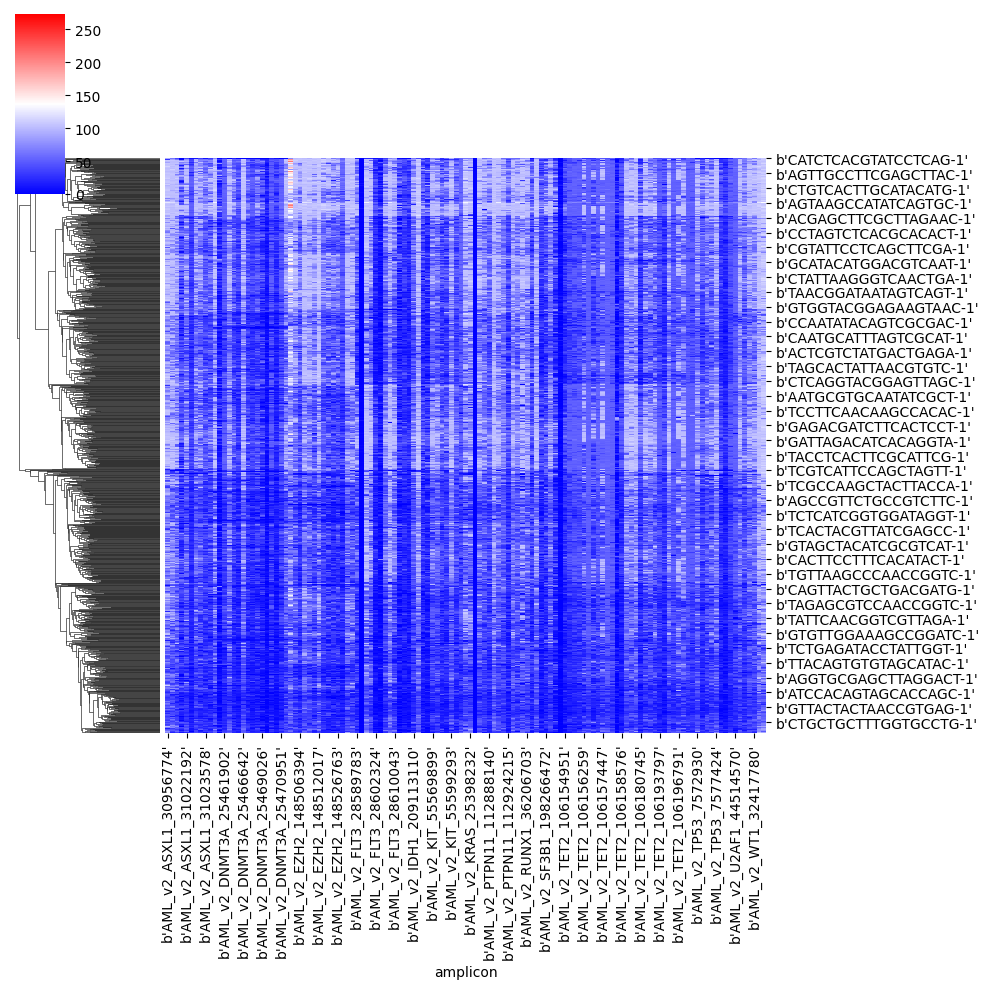

In [36]:
sns.clustermap(max_amplicon, col_cluster=False, cmap="bwr") # cluster when read count = max read count of variant for amplicon and cell

c:\Users\sophi\anaconda3\envs\tapestri\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


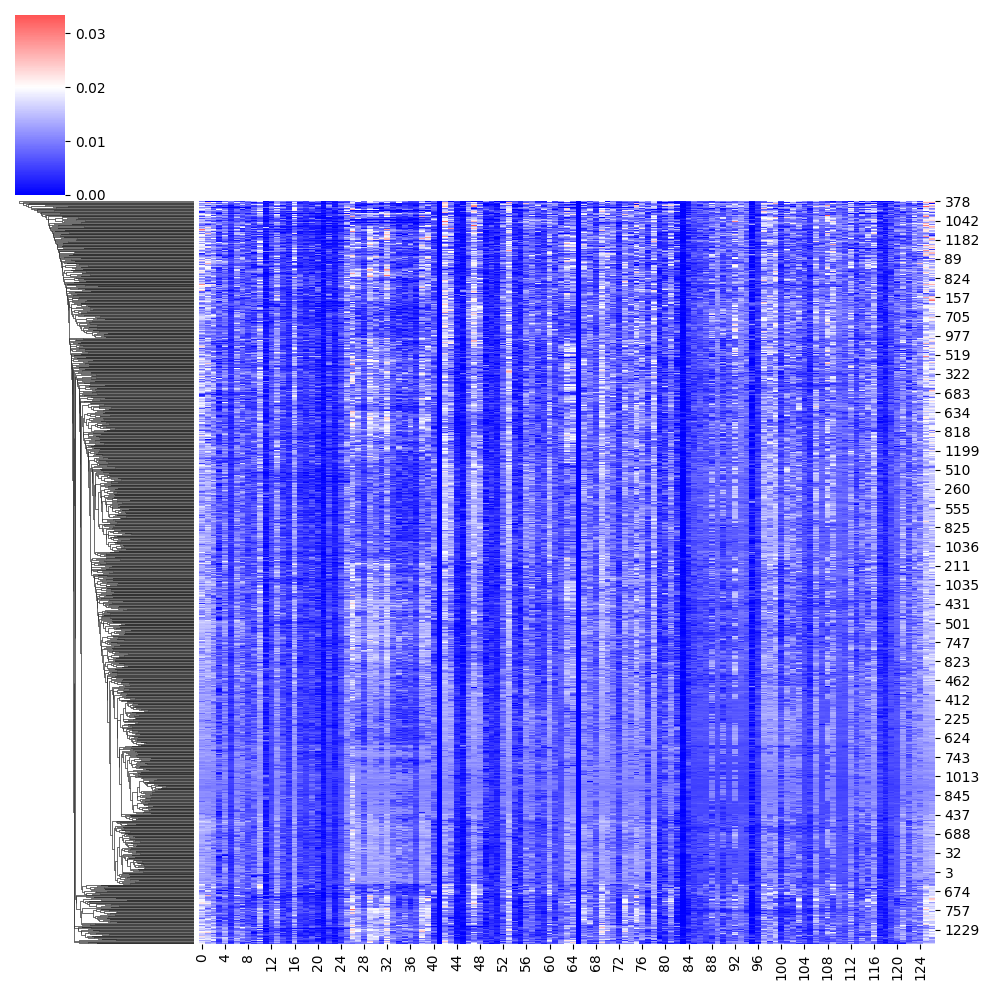

In [37]:
sns.clustermap((max_amplicon.apply(lambda x : x/max_amplicon.sum(axis=1), axis=0)).to_numpy(), col_cluster=False, cmap="bwr",center = 0.02) # same but after normalization

looks closer to thnormalized read count table

c:\Users\sophi\anaconda3\envs\tapestri\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


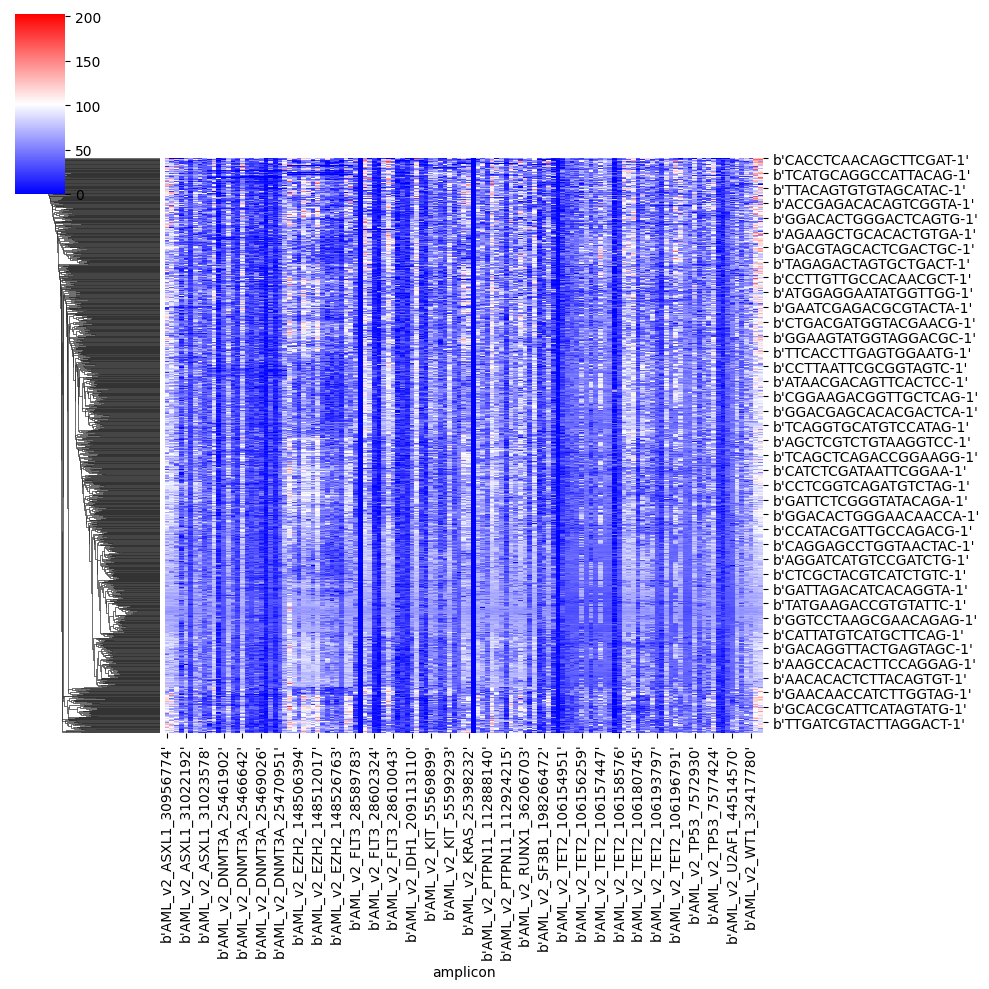

In [81]:
mean_tot_nb_read_cell = max_amplicon.sum(axis=1).mean()
sns.clustermap(max_amplicon.apply(lambda x : x/max_amplicon.sum(axis=1), axis=0)*mean_tot_nb_read_cell, col_cluster=False, cmap="bwr") # same after change in magnitude

### Amplicon distribution : search for outliers

<Axes: >

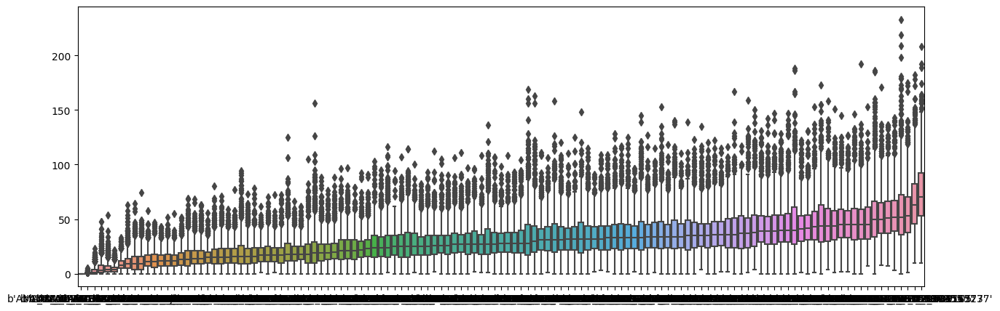

In [55]:
plt.figure(figsize=(15,5))
sns.boxplot(data = read_counts[read_counts.median().sort_values().index]) # no normalization

In [33]:
normalized_read_counts = read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0)

<Axes: >

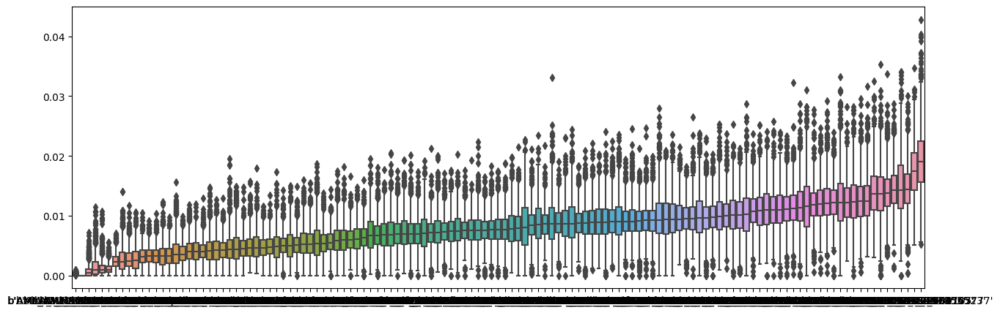

In [60]:
plt.figure(figsize=(15,5))
sns.boxplot(data = normalized_read_counts[normalized_read_counts.median().sort_values().index]) # normalized

<Axes: >

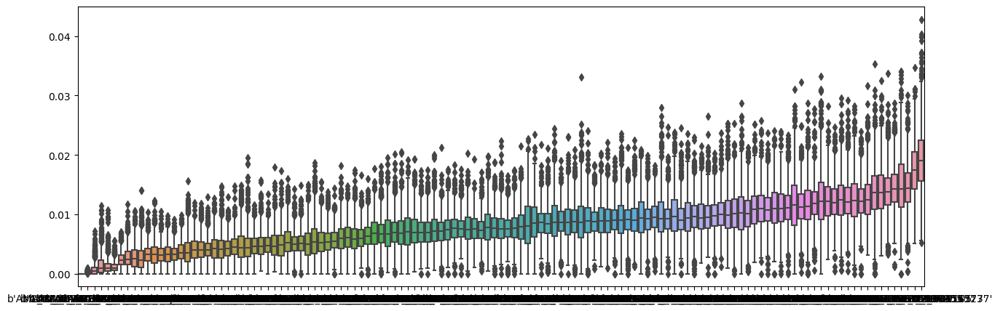

In [61]:
plt.figure(figsize=(15,5))
sns.boxplot(data = normalized_read_counts[read_counts.median().sort_values().index]) # normalized but ordered before normalization

In [58]:
read_counts.sum().sort_values() # one amplicon as 0 read

b'AML_v2_NPM1_170837412'         0
b'AML_v2_FLT3_28592494'        309
b'AML_v2_SRSF2_74732219'      3348
b'AML_v2_DNMT3A_25469428'     5437
b'AML_v2_FLT3_28608210'       6102
                             ...  
b'AML_v2_TET2_106197355'     67824
b'AML_v2_WT1_32439105'       69072
b'AML_v2_EZH2_148504743'     71033
b'AML_v2_TET2_106156523'     81980
b'AML_v2_TET2_106157777'     90216
Length: 127, dtype: int64

In [151]:
df = amplicons[['id','CHROM']].set_index('id').reindex(normalized_read_counts.median().sort_values().index)
a, unique = pd.factorize(df.stack())
palette = sns.color_palette(None, len(unique)).as_hex()
chrom_amplicon = pd.DataFrame(a.reshape(df.shape),
                         index=df.index, columns=df.columns).CHROM.values

In [150]:
palette = sns.husl_palette(14)

In [153]:
chrom_amplicon

array([ 0,  1,  2,  3,  0,  4,  5,  4,  3,  5,  2,  4,  3,  4,  4,  4,  6,
        7,  3,  4,  2,  4,  4,  4,  0,  3,  3,  8,  4,  2,  9,  9, 10,  3,
       10, 10, 10,  4,  7,  5,  0, 11, 10,  4,  3,  9,  3,  4,  9,  3,  2,
        0, 10,  2,  3,  3,  3,  3,  7,  3,  4,  7, 12,  9,  9,  3,  0, 10,
        4, 10, 11,  4, 11,  3, 10,  8,  4, 12,  3,  0,  3,  7,  7,  7,  8,
        9,  2,  7, 10,  4,  3,  3,  2, 10,  4,  2,  3,  3,  4,  4,  8,  8,
        3, 10,  3,  3,  9,  9,  0, 10, 13,  3,  3,  7,  7,  3,  0,  3,  3,
        3,  8, 11,  3, 10, 11,  3,  3], dtype=int64)

In [155]:
df.to_numpy()

array([[b'13'],
       [b'5'],
       [b'17'],
       [b'4'],
       [b'13'],
       [b'2'],
       [b'3'],
       [b'2'],
       [b'4'],
       [b'3'],
       [b'17'],
       [b'2'],
       [b'4'],
       [b'2'],
       [b'2'],
       [b'2'],
       [b'9'],
       [b'12'],
       [b'4'],
       [b'2'],
       [b'17'],
       [b'2'],
       [b'2'],
       [b'2'],
       [b'13'],
       [b'4'],
       [b'4'],
       [b'21'],
       [b'2'],
       [b'17'],
       [b'20'],
       [b'20'],
       [b'7'],
       [b'4'],
       [b'7'],
       [b'7'],
       [b'7'],
       [b'2'],
       [b'12'],
       [b'3'],
       [b'13'],
       [b'11'],
       [b'7'],
       [b'2'],
       [b'4'],
       [b'20'],
       [b'4'],
       [b'2'],
       [b'20'],
       [b'4'],
       [b'17'],
       [b'13'],
       [b'7'],
       [b'17'],
       [b'4'],
       [b'4'],
       [b'4'],
       [b'4'],
       [b'12'],
       [b'4'],
       [b'2'],
       [b'12'],
       [b'1'],
       [b'20'],
       [b'20'],
  

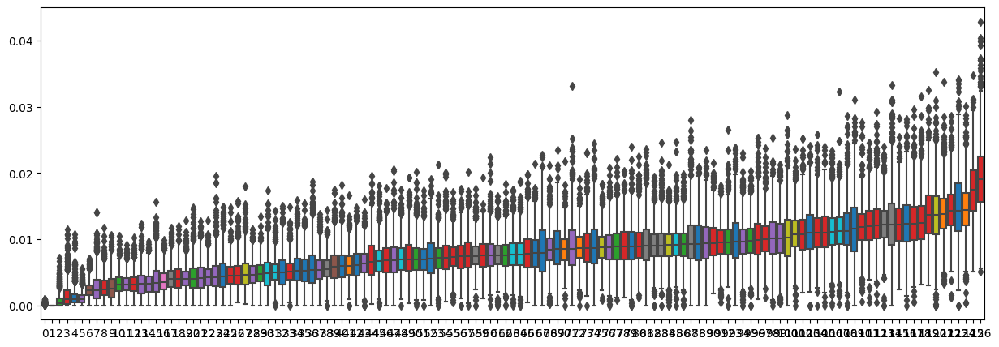

In [152]:

plt.figure(figsize=(15,5))
ax = sns.boxplot( list(normalized_read_counts[normalized_read_counts.median().sort_values().index].T.to_numpy()))
for i,box in enumerate(ax.patches):
    color = palette[chrom_amplicon[i]]
    box.set_facecolor(color)

### Cell search for outliers

In [77]:
read_counts.sum(axis=1).sort_values()

b'TATCAGTGCGAGGTCACG-1'     1180
b'CTCTGCAAGGTCTCCAGG-1'     1372
b'TAGTCAGACGGAATTGGA-1'     1398
b'CTCTGCAAGCCGATCTCT-1'     1404
b'GAGTATCGCGCAACTCGC-1'     1417
                           ...  
b'CCAACGGAATCAGAGCGT-1'     9592
b'CAGCAGTACTGATCTCGG-1'     9759
b'GAGTCACCAGGATTACGC-1'     9896
b'ACCTGTACCCCTATTGGT-1'    10642
b'CGTGCAAGGGACGTCAAT-1'    10967
Length: 1240, dtype: int64

<Axes: >

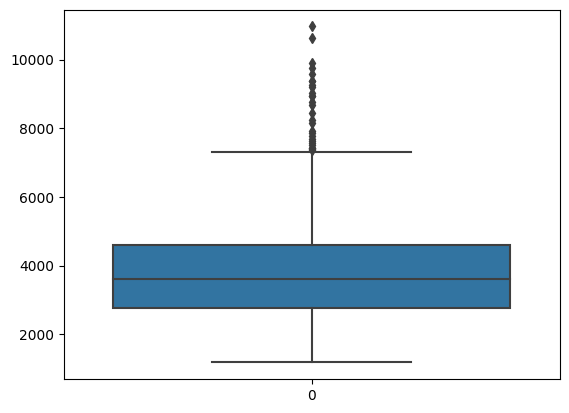

In [23]:
sns.boxplot(read_counts.sum(axis=1))

In [41]:
read_counts.loc[[read_counts.sum(axis=1).sort_values().index[0]]].values # cell with the smallest coverage 

array([[ 9, 11, 14, 11, 10, 19, 11, 10,  5,  6,  7,  6,  3,  5,  4, 12,
         6,  7,  6,  6,  8,  9,  4,  4,  0,  8,  6,  7,  6,  8,  3, 10,
         8,  7,  4,  7, 16, 13,  3, 11,  2, 12, 17, 22, 16,  5,  5,  9,
        11,  8,  2, 10,  8,  5,  6,  9, 15, 15, 11, 11, 16, 13,  0, 20,
        14, 13, 14, 16,  9, 23,  7,  9, 12, 11, 12, 20, 15,  4, 11, 11,
        19, 19, 14,  9, 18, 11, 13,  6, 10, 10, 13,  9,  5,  9,  0, 14,
         3,  1,  1,  7, 16,  7, 17,  3,  1,  3,  2,  8,  3,  6,  8,  0,
         4, 20, 11,  8, 16,  7,  9,  6,  6, 11,  8,  5, 17, 16, 12]],
      dtype=int64)

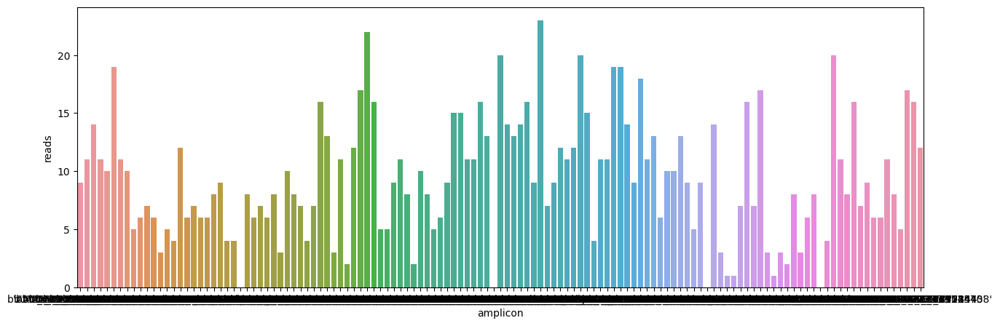

In [58]:
plt.figure(figsize=(15,5))
ax = sns.barplot(data = read_counts.loc[[read_counts.sum(axis=1).sort_values().index[0]]].T.reset_index().rename(columns={"index": "amplicon", b'TATCAGTGCGAGGTCACG-1': "reads"}), x="amplicon",y="reads" )

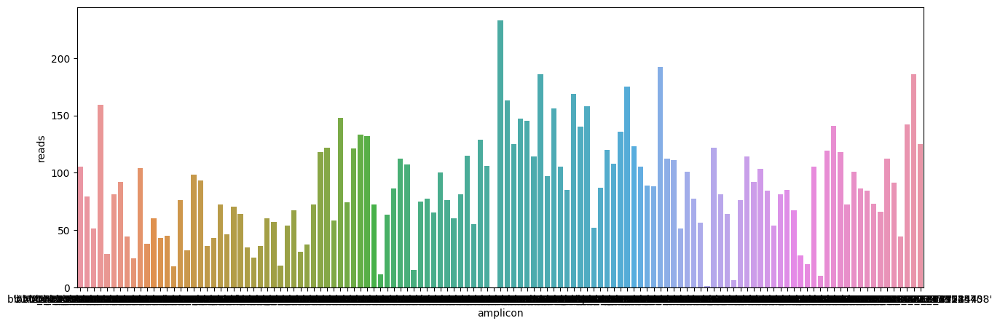

In [62]:
# cell with the highest coverage
plt.figure(figsize=(15,5))
ax = sns.barplot(data = read_counts.loc[[read_counts.sum(axis=1).sort_values().index[-1]]].T.reset_index().rename(columns={"index": "amplicon", b'CGTGCAAGGGACGTCAAT-1': "reads"}), x="amplicon",y="reads" )

# VAF computation

In [240]:
vafs

,b'chr1:115256513:G/A',b'chr1:115256513:G/T',b'chr1:115256514:G/A',b'chr1:115256515:C/',b'chr1:115256516:A/G',b'chr1:115256516:A/T',b'chr1:115256517:C/',b'chr1:115256518:T/C',b'chr1:115256518:T/G',b'chr1:115256519:G/',...,b'chr21:44524600:T/C',b'chr21:44524601:A/',b'chr21:44524602:C/',b'chr21:44524603:T/',b'chr21:44524604:T/',b'chr21:44524605:T/C',b'chr21:44524606:T/C',b'chr21:44524607:A/',b'chr21:44524608:A/G',b'chr21:44524609:C/'
b'AACAACCTACAGAAGTGA-1',0.111111,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.142857,0.0
b'AACAACCTATCTATGACA-1',0.222222,0.000000,0.000000,0.0,0.090909,0.090909,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'AACAACTGGCAACGCACA-1',0.023256,0.023256,0.000000,0.0,0.023256,0.023256,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'AACACACTCTTACAGTGT-1',0.019608,0.019608,0.000000,0.0,0.000000,0.000000,0.0,0.019608,0.019608,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'AACAGCAGTCGTCTGCTG-1',0.000000,0.000000,0.000000,0.0,0.032258,0.032258,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.025000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.111111,0.111111,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0625,0.0,0.000000,0.0
b'TTGGAGAACTGAACTTGC-1',0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.019608,0.019608,0.0,...,0.0,0.0,0.0,0.0,0.0,0.018868,0.0000,0.0,0.037736,0.0
b'TTGGTAACTTCTGCGCTG-1',0.021739,0.021739,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.000000,0.0
b'TTGTCAACCGCAGCAGTG-1',0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.020833,0.0


In [283]:
cov_pos = covs.T.copy()
cov_pos['POS'] = variants.POS.values
cov_pos = cov_pos.reset_index().groupby('POS').sum().drop("index",axis=1)

In [297]:
vafs_by_hand = covs.copy()

for col in vafs_by_hand.columns: # col = variant
    position = variants.POS[variants.id == col].values[0]
    vafs_by_hand[col] = vafs_by_hand[col] /cov_pos.loc[[position]].values[0]

# cov_pos replace values by read count of associated amplicon for each variant

In [298]:
vafs_by_hand

,b'chr1:115256513:G/A',b'chr1:115256513:G/T',b'chr1:115256514:G/A',b'chr1:115256515:C/',b'chr1:115256516:A/G',b'chr1:115256516:A/T',b'chr1:115256517:C/',b'chr1:115256518:T/C',b'chr1:115256518:T/G',b'chr1:115256519:G/',...,b'chr21:44524600:T/C',b'chr21:44524601:A/',b'chr21:44524602:C/',b'chr21:44524603:T/',b'chr21:44524604:T/',b'chr21:44524605:T/C',b'chr21:44524606:T/C',b'chr21:44524607:A/',b'chr21:44524608:A/G',b'chr21:44524609:C/'
b'AACAACCTACAGAAGTGA-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
b'AACAACCTATCTATGACA-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
b'AACAACTGGCAACGCACA-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
b'AACACACTCTTACAGTGT-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
b'AACAGCAGTCGTCTGCTG-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
b'TTGGAGAACTGAACTTGC-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
b'TTGGTAACTTCTGCGCTG-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
b'TTGTCAACCGCAGCAGTG-1',0.5,0.5,1.0,1.0,0.5,0.5,1.0,0.5,0.5,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [300]:
unique, counts = np.unique(vafs_by_hand.round(decimals=1).to_numpy(), return_counts=True) # greater than 1 values 

In [301]:
unique,counts

(array([0.3, 0.5, 1. , nan]),
 array([   28980,  6862310, 25525388,   951722], dtype=int64))

perfect mappability

In [4]:
snv_read_count = vafs.copy()

for col in snv_read_count.columns:
    amplicon = variants.amplicon[variants.id == col].values[0]
    snv_read_count[col] = read_counts[amplicon]

# snv_read_count replace vafs by read count of associated amplicon for each variant

In [5]:
vaf_perf_map = covs/snv_read_count

In [6]:
vaf_perf_map

,b'chr1:115256513:G/A',b'chr1:115256513:G/T',b'chr1:115256514:G/A',b'chr1:115256515:C/',b'chr1:115256516:A/G',b'chr1:115256516:A/T',b'chr1:115256517:C/',b'chr1:115256518:T/C',b'chr1:115256518:T/G',b'chr1:115256519:G/',...,b'chr21:44524600:T/C',b'chr21:44524601:A/',b'chr21:44524602:C/',b'chr21:44524603:T/',b'chr21:44524604:T/',b'chr21:44524605:T/C',b'chr21:44524606:T/C',b'chr21:44524607:A/',b'chr21:44524608:A/G',b'chr21:44524609:C/'
b'AACAACCTACAGAAGTGA-1',0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,0.972973,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.933333,1.000000
b'AACAACCTATCTATGACA-1',0.818182,0.818182,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'AACAACTGGCAACGCACA-1',0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,0.977273,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'AACACACTCTTACAGTGT-1',0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,0.864407,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'AACAGCAGTCGTCTGCTG-1',1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'TTGGAGAACTGAACTTGC-1',0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,0.467890,...,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087,0.576087
b'TTGGTAACTTCTGCGCTG-1',1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
b'TTGTCAACCGCAGCAGTG-1',0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,0.724638,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# VAF distribution

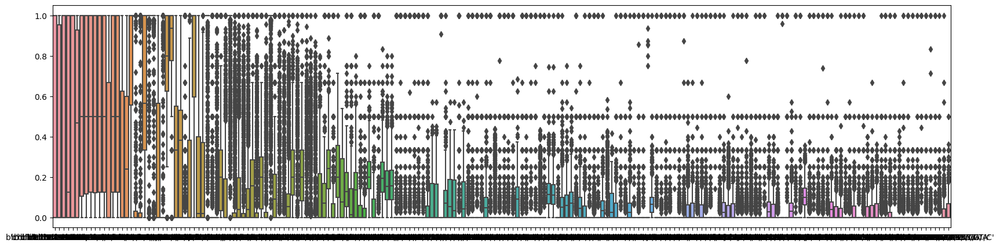

In [13]:
plt.figure(figsize=(20,5))
ax = sns.boxplot( vafs[vafs.std().sort_values(ascending=False).iloc[:200].index])

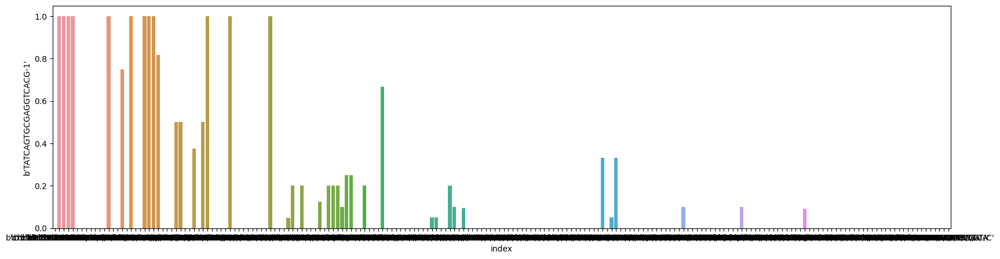

In [19]:
cell = b'TATCAGTGCGAGGTCACG-1'
plt.figure(figsize=(20,5))
ax = sns.barplot(data = vafs[vafs.std().sort_values(ascending=False).iloc[:200].index].loc[[cell]].T.reset_index(), x="index",y=cell )

# Understanding filtering

In [29]:
cell_filters

,barcode,filtered,sample_name
0,b'AACAACCTACAGAAGTGA-1',0,b'4-cell-lines-AML-CNV'
1,b'AACAACCTATCTATGACA-1',0,b'4-cell-lines-AML-CNV'
2,b'AACAACTGGCAACGCACA-1',0,b'4-cell-lines-AML-CNV'
3,b'AACACACTCTTACAGTGT-1',0,b'4-cell-lines-AML-CNV'
4,b'AACAGCAGTCGTCTGCTG-1',0,b'4-cell-lines-AML-CNV'
...,...,...,...
1235,b'TTGGACTTCCGCTTATGA-1',0,b'4-cell-lines-AML-CNV'
1236,b'TTGGAGAACTGAACTTGC-1',0,b'4-cell-lines-AML-CNV'
1237,b'TTGGTAACTTCTGCGCTG-1',0,b'4-cell-lines-AML-CNV'
1238,b'TTGTCAACCGCAGCAGTG-1',0,b'4-cell-lines-AML-CNV'


### Cell filtering

In [26]:
cell_filters.filtered.value_counts()

filtered
0    1201
1      39
Name: count, dtype: int64

<Axes: ylabel='Count'>

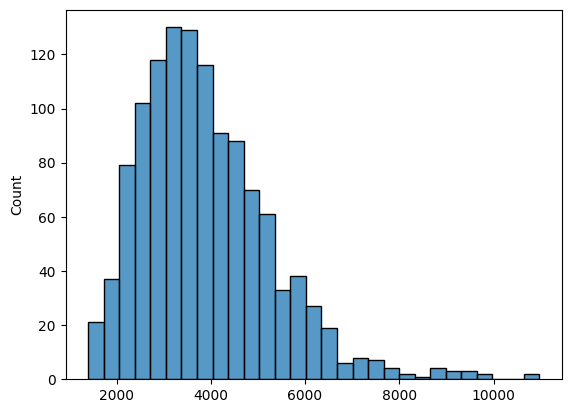

In [43]:
sns.histplot(read_counts.loc[cell_filters[cell_filters.filtered == 0].barcode.values].sum(axis=1))

<Axes: ylabel='Count'>

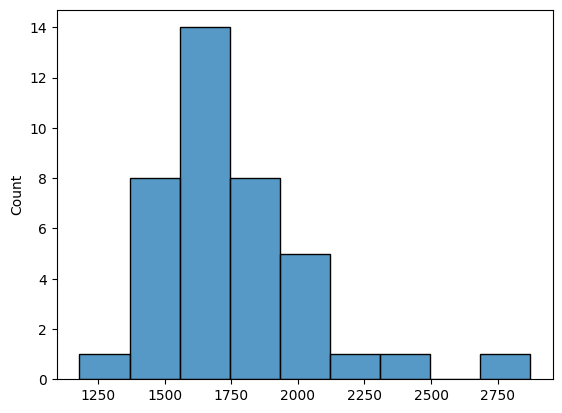

In [44]:
sns.histplot(read_counts.loc[cell_filters[cell_filters.filtered == 1].barcode.values].sum(axis=1))

<Axes: >

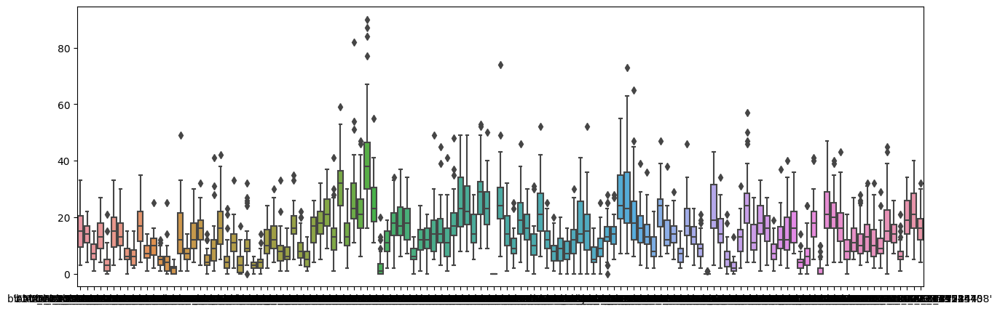

In [46]:
plt.figure(figsize=(15,5))
sns.boxplot(data = read_counts.loc[cell_filters[cell_filters.filtered == 1].barcode.values])

<Axes: >

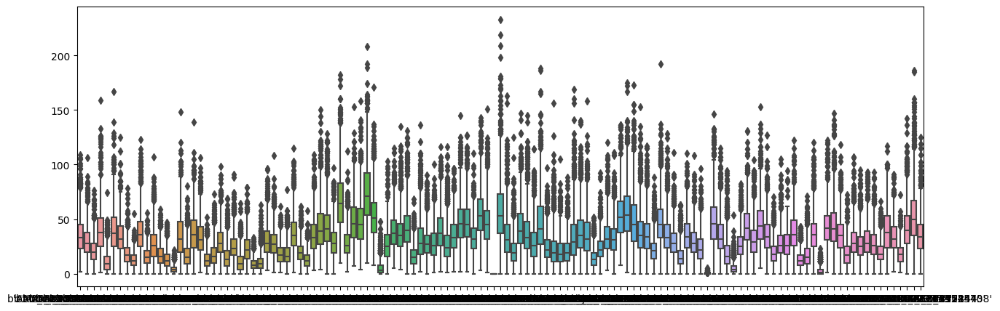

In [47]:
plt.figure(figsize=(15,5))
sns.boxplot(data = read_counts.loc[cell_filters[cell_filters.filtered == 0].barcode.values]) 

The read count is way smaller for cells with 1 value filter

### Variants filtering

In [48]:
variants.filtered.value_counts()

filtered
1    26866
0       44
Name: count, dtype: int64

<Axes: >

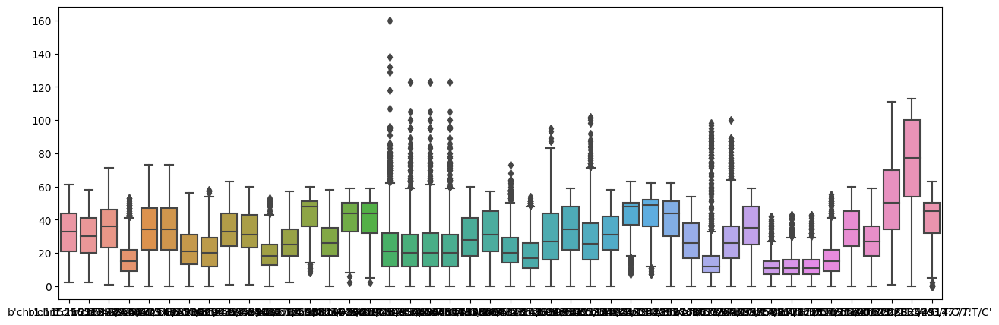

In [56]:
plt.figure(figsize=(15,5))
sns.boxplot(data = covs[variants[variants.filtered == 0].id.values]) 

<Axes: >

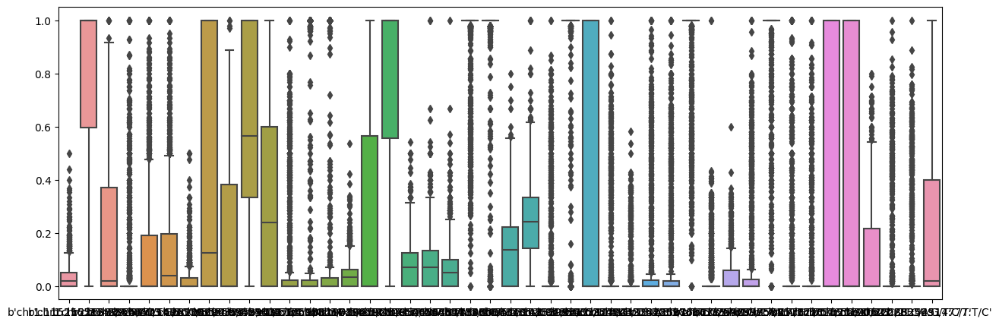

In [57]:
plt.figure(figsize=(15,5))
sns.boxplot(data = vafs[variants[variants.filtered == 0].id.values]) 

<Axes: ylabel='Count'>

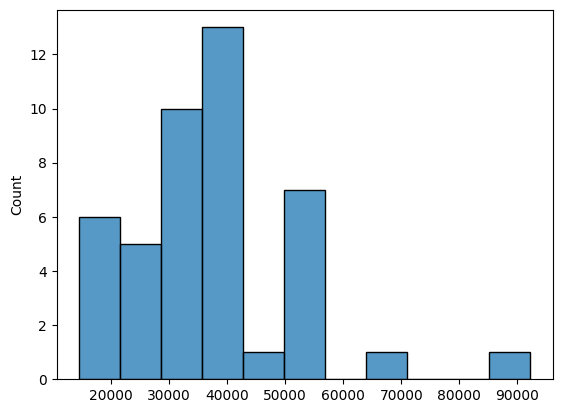

In [66]:
sns.histplot(covs[variants[variants.filtered == 0].id.values].sum())

<Axes: ylabel='Count'>

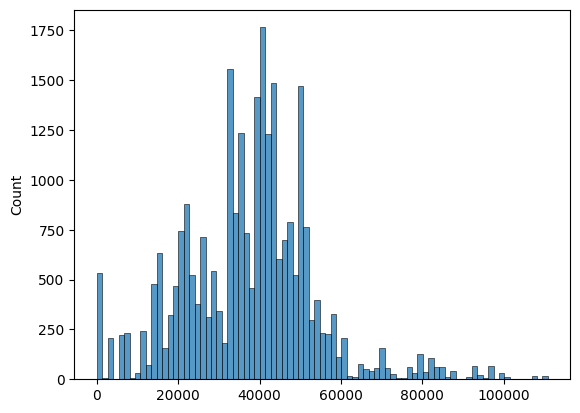

In [67]:
sns.histplot(covs[variants[variants.filtered == 1].id.values].sum())

<Axes: ylabel='Count'>

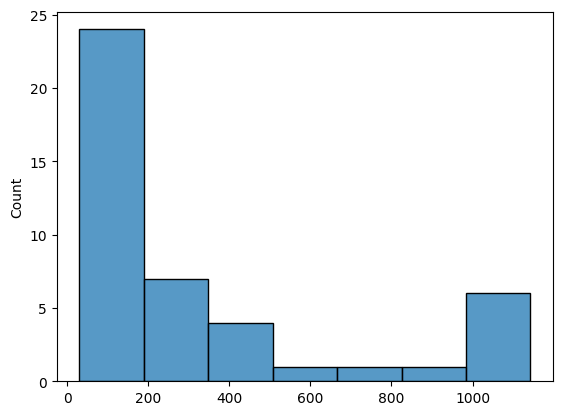

In [70]:
sns.histplot(vafs[variants[variants.filtered == 0].id.values].sum()) # basically the number of variants and number of cells with the variant 

[(0.0, 1500.0)]

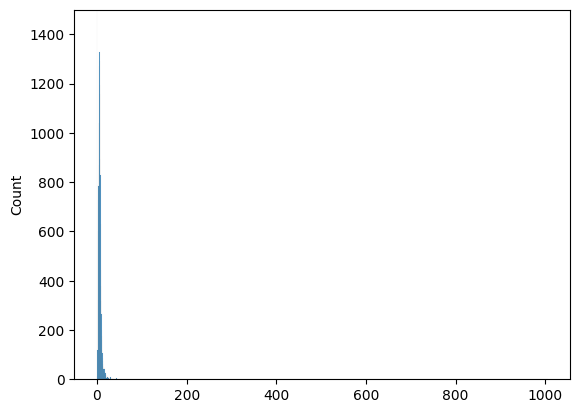

In [74]:
sns.histplot(vafs[variants[variants.filtered == 1].id.values].sum()).set(ylim=(0,1500)) # basically the number of variants and number of cells with the variant 

[(0.0, 1500.0), (0.0, 100.0)]

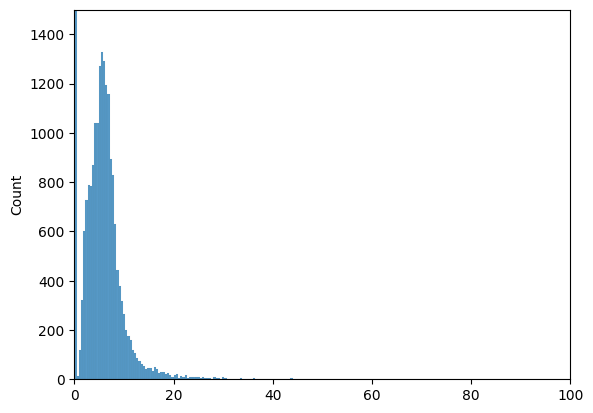

In [75]:
sns.histplot(vafs[variants[variants.filtered == 1].id.values].sum()).set(ylim=(0,1500),xlim=(0,100))

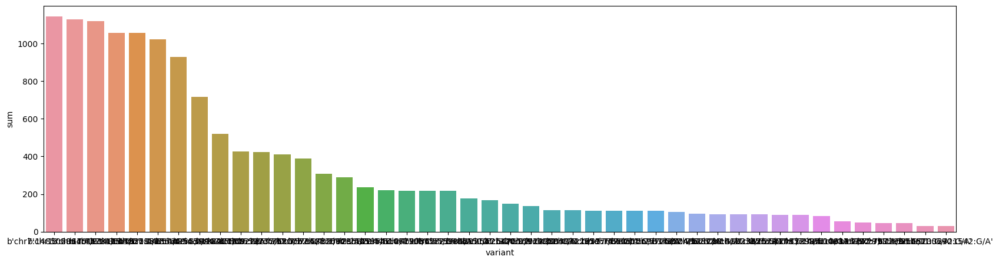

In [13]:
data = vafs[variants[variants.filtered == 0].id.values].sum().to_frame().reset_index().rename(columns = {"index":"variant",0:"sum"}).sort_values(by="sum",ascending=False).iloc[:100]
plt.figure(figsize=(20,5))
ax = sns.barplot(data = data, x="variant",y="sum")

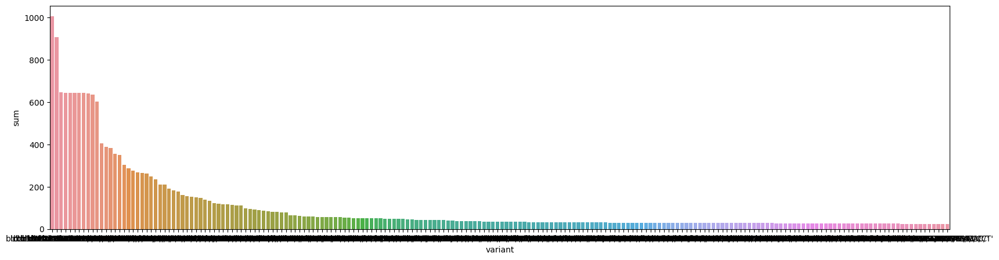

In [15]:
data = vafs[variants[variants.filtered == 1].id.values].sum().to_frame().reset_index().rename(columns = {"index":"variant",0:"sum"}).sort_values(by="sum",ascending=False).iloc[:200]
plt.figure(figsize=(20,5))
ax = sns.barplot(data = data, x="variant",y="sum")

Seems that variants with 1 as filter value are present in less cell

### Values filtering

In [99]:
print("number of 1 :",filtermask.sum().sum())
print("number of 0:", filtermask.size - filtermask.sum().sum())

number of 1 : 87765
number of 0: 33280635


According to previous filtering analysis we should keep cells with 0 and variants with 0 so 1201 cells and 44 variants so 52844 values

In [26]:
print("cells 0 and variants 0 filter:",filtermask.loc[cell_filters[cell_filters.filtered == 0].barcode.values][variants[variants.filtered == 0].id.values].sum().sum())
print("cells 0 and variants 1 filter:",filtermask.loc[cell_filters[cell_filters.filtered == 0].barcode.values][variants[variants.filtered == 1].id.values].sum().sum())
print("cells 1 and variants 0 filter:",filtermask.loc[cell_filters[cell_filters.filtered == 1].barcode.values][variants[variants.filtered == 0].id.values].sum().sum())
print("cells 1 and variants 1 filter:",filtermask.loc[cell_filters[cell_filters.filtered == 1].barcode.values][variants[variants.filtered == 1].id.values].sum().sum())


cells 0 and varianst 0 filter: 9984
cells 0 and varianst 1 filter: 72874
cells 1 and varianst 0 filter: 807
cells 1 and varianst 1 filter: 4100


Genotype filtering can explain the difference

Mission Bio advanced filtering

- Remove genotype in cell with quality < X
- Remove genotype in cell with read depth < X
- Remove genotype in cell with alternate allele freq < X
- Remove variants genotyped in < X% of cell (low-quality variants filter)
- Remove cells with < X% of genotypes present (low-quality cells filter)
- Remove variants mutated in < X% of cells (low-frequency variants filter)

## Before filtering

<Axes: xlabel='POS', ylabel="b'AACAACCTACAGAAGTGA-1'">

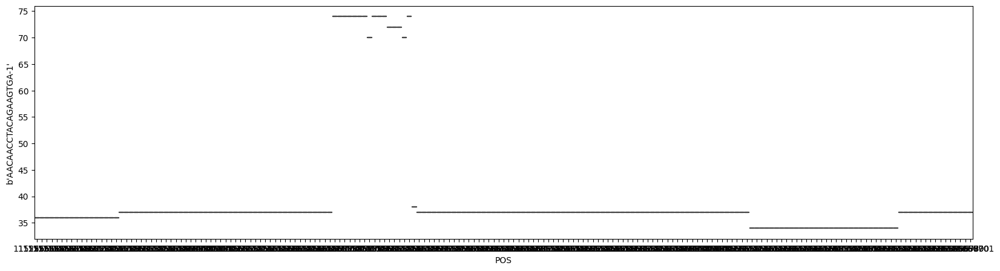

In [14]:
sanity_snv = covs.T.copy()
sanity_snv['sum'] = sanity_snv.sum(axis=1).values
sanity_snv['amplicon'] = variants.amplicon.values
sanity_snv['POS'] = variants.POS.values
rd_var_same_pos = sanity_snv.copy()
#rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.duplicated(keep=False)]
amplicon_check = b'AML_v2_NRAS_115256512'
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.amplicon == amplicon_check].drop(['sum','amplicon'],axis=1)
rd_var_same_pos['POS'] = rd_var_same_pos['POS'].apply(str)

cell = b'AACAACCTACAGAAGTGA-1'# b'AACAACCTATCTATGACA-1'# b'AACAACCTACAGAAGTGA-1' 
plt.figure(figsize=(20,5))
sns.boxplot(data = rd_var_same_pos[[cell,'POS']].sort_values('POS'), x='POS', y=cell)

<Axes: xlabel='amplicon', ylabel="b'AACAACCTACAGAAGTGA-1'">

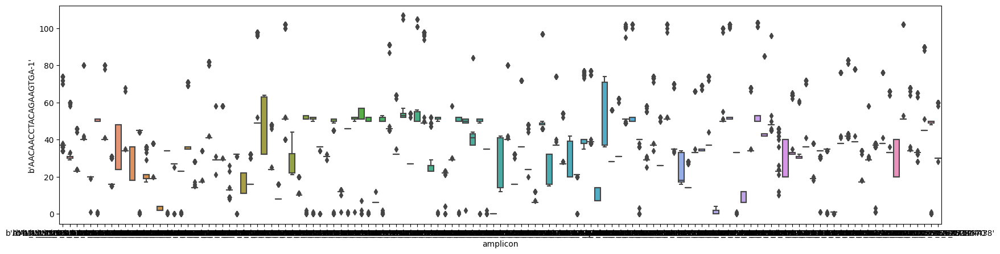

In [48]:
cell = b'AACAACCTACAGAAGTGA-1'
data = sanity_snv.drop_duplicates()[[cell,'amplicon']]  #.groupby('amplicon').min() #- sanity_snv.drop_duplicates().groupby('amplicon').min()
plt.figure(figsize=(20,5))
sns.boxplot(data = data, x="amplicon", y = cell	) # no normalization

<Axes: xlabel='amplicon'>

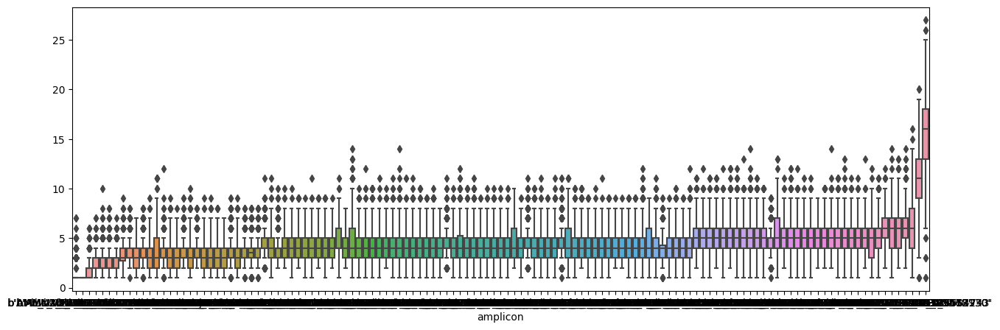

In [15]:
diff_rc_amplicon = sanity_snv.groupby('amplicon').nunique().drop(['sum','POS'], axis=1).T
plt.figure(figsize=(15,5))
sns.boxplot(data = diff_rc_amplicon[diff_rc_amplicon.median().sort_values().index]) 

## After filtering

In [16]:
filtermask_rev = filtermask.copy()
filtermask_rev[filtermask_rev ==0] =2 
filtermask_rev[filtermask_rev == 1] = 0
filtermask_rev = filtermask_rev/2

In [17]:
sanity_snv = covs.T.copy()*filtermask_rev.T
sanity_snv['sum'] = sanity_snv.sum(axis=1).values
sanity_snv['amplicon'] = variants.amplicon.values
sanity_snv['POS'] = variants.POS.values

<Axes: xlabel='POS', ylabel="b'AACAACCTACAGAAGTGA-1'">

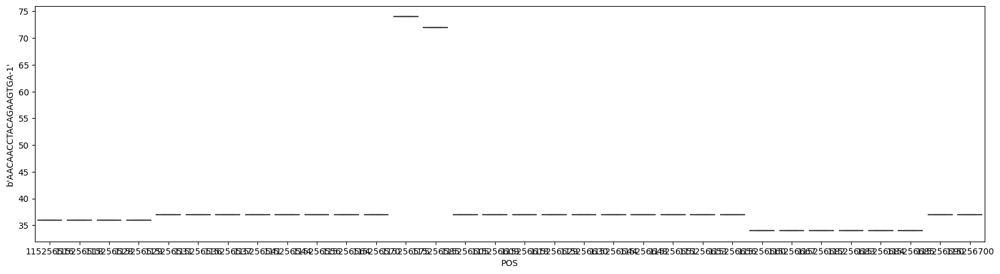

In [50]:
rd_var_same_pos = sanity_snv.copy()
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.duplicated(keep=False)]
amplicon_check = b'AML_v2_NRAS_115256512'
rd_var_same_pos = rd_var_same_pos[rd_var_same_pos.amplicon == amplicon_check].drop(['sum','amplicon'],axis=1)
rd_var_same_pos['POS'] = rd_var_same_pos['POS'].apply(str)

cell = b'AACAACCTACAGAAGTGA-1'# b'AACAACCTATCTATGACA-1'# b'AACAACCTACAGAAGTGA-1' 
plt.figure(figsize=(20,5))
sns.boxplot(data = rd_var_same_pos[[cell,'POS']].sort_values('POS'), x='POS', y=cell)

<Axes: xlabel='amplicon', ylabel="b'AACAACCTACAGAAGTGA-1'">

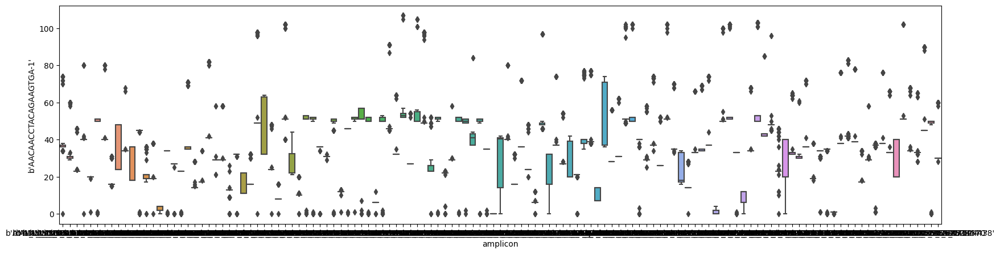

In [51]:
cell = b'AACAACCTACAGAAGTGA-1'
data = sanity_snv.drop_duplicates()[[cell,'amplicon']]  #.groupby('amplicon').min() #- sanity_snv.drop_duplicates().groupby('amplicon').min()
plt.figure(figsize=(20,5))
sns.boxplot(data = data, x="amplicon", y = cell	) # no normalization

In [57]:
cell_filters[cell_filters.barcode == b'AACAACCTACAGAAGTGA-1']

,barcode,filtered,sample_name
0,b'AACAACCTACAGAAGTGA-1',0,b'4-cell-lines-AML-CNV'


<Axes: xlabel='amplicon'>

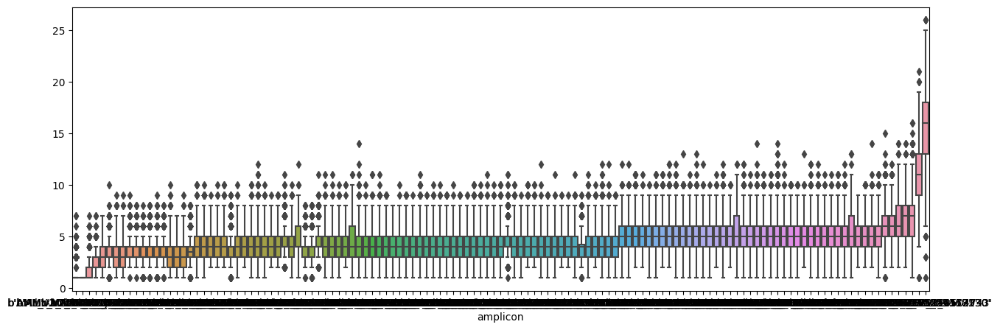

In [18]:
diff_rc_amplicon = sanity_snv.groupby('amplicon').nunique().drop(['sum','POS'], axis=1).T
plt.figure(figsize=(15,5))
sns.boxplot(data = diff_rc_amplicon[diff_rc_amplicon.median().sort_values().index]) 

# Presence / absence mutation matrix

#### Variants with filter + 1 if coverage

In [13]:
covs

,b'chr1:115256513:G/A',b'chr1:115256513:G/T',b'chr1:115256514:G/A',b'chr1:115256515:C/',b'chr1:115256516:A/G',b'chr1:115256516:A/T',b'chr1:115256517:C/',b'chr1:115256518:T/C',b'chr1:115256518:T/G',b'chr1:115256519:G/',...,b'chr21:44524600:T/C',b'chr21:44524601:A/',b'chr21:44524602:C/',b'chr21:44524603:T/',b'chr21:44524604:T/',b'chr21:44524605:T/C',b'chr21:44524606:T/C',b'chr21:44524607:A/',b'chr21:44524608:A/G',b'chr21:44524609:C/'
b'AACAACCTACAGAAGTGA-1',36,36,36,36,36,36,36,36,36,36,...,30,30,30,30,30,30,30,30,28,30
b'AACAACCTATCTATGACA-1',9,9,11,11,11,11,11,11,11,11,...,26,26,26,26,26,26,26,26,26,26
b'AACAACTGGCAACGCACA-1',43,43,43,43,43,43,43,43,43,43,...,26,26,26,26,26,26,26,26,26,26
b'AACACACTCTTACAGTGT-1',51,51,51,51,51,51,51,51,51,51,...,46,46,46,46,46,46,46,46,46,46
b'AACAGCAGTCGTCTGCTG-1',31,31,31,31,31,31,31,31,31,31,...,40,40,40,40,40,40,40,40,40,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',9,9,9,9,9,9,9,9,9,9,...,16,16,16,16,16,16,16,16,16,16
b'TTGGAGAACTGAACTTGC-1',51,51,51,51,51,51,51,51,51,51,...,53,53,53,53,53,53,53,53,53,53
b'TTGGTAACTTCTGCGCTG-1',46,46,46,46,46,46,46,46,46,46,...,45,45,45,45,45,45,45,45,45,45
b'TTGTCAACCGCAGCAGTG-1',50,50,50,50,50,50,50,50,50,50,...,48,48,48,48,48,48,48,48,48,48


In [17]:
covs_filter = vafs.copy()
covs_filter = covs_filter[variants.id[variants.filtered == 0].values]
covs_filter = covs_filter.loc[cell_filters.barcode[cell_filters.filtered == 0].values]
covs_filter

,b'chr1:115256513:G/A',b'chr1:115256669:G/A',b'chr2:25458546:C/T',b'chr2:25470573:G/A',b'chr2:25471169:GC/G',b'chr2:25471170:C/*',b'chr3:128200690:G/A',b'chr3:128200806:G/A',b'chr4:55599429:C/T',b'chr4:55599436:T/C',...,b'chr17:7577581:A/G',b'chr17:7578115:T/C',b'chr17:7578211:C/T',b'chr17:7578263:G/A',b'chr17:7578523:T/TG',b'chr17:7580052:C/T',b'chr20:31022288:C/A',b'chr20:31023356:G/T',b'chr21:36252917:C/T',b'chr21:44514777:T/C'
b'AACAACCTACAGAAGTGA-1',0.111111,0.970588,0.000000,0.000000,0.000000,0.000000,0.062500,0.03125,0.350000,0.650000,...,0.000000,1.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.541667
b'AACAACCTATCTATGACA-1',0.222222,1.000000,0.545455,0.352941,0.000000,0.000000,0.000000,0.00000,0.000000,0.500000,...,0.000000,1.00,0.0,0.857143,0.000000,0.000000,0.000000,0.617021,0.587302,0.000000
b'AACAACTGGCAACGCACA-1',0.023256,1.000000,0.000000,0.000000,0.348837,0.348837,0.028571,0.00000,0.414634,0.560976,...,0.000000,1.00,0.0,0.000000,0.000000,0.000000,0.000000,0.015873,0.000000,0.531250
b'AACACACTCTTACAGTGT-1',0.019608,0.658537,0.069767,0.000000,0.000000,0.029412,0.161290,1.00000,0.000000,0.594595,...,0.387097,0.75,0.2,0.000000,0.588235,0.428571,0.217391,0.000000,0.021739,0.018868
b'AACAGCAGTCGTCTGCTG-1',0.000000,1.000000,0.326531,0.235294,0.000000,0.000000,0.000000,0.00000,0.000000,0.384615,...,0.000000,1.00,0.0,0.476190,0.062500,0.000000,0.000000,0.538462,0.490196,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',0.000000,1.000000,0.625000,0.555556,0.000000,0.031250,0.000000,0.00000,0.000000,0.461538,...,0.000000,1.00,0.0,0.142857,0.000000,0.000000,0.000000,0.450000,0.307692,0.000000
b'TTGGAGAACTGAACTTGC-1',0.000000,0.384615,0.382979,0.000000,0.000000,0.073171,0.000000,1.00000,0.000000,1.000000,...,0.000000,1.00,0.0,0.000000,1.000000,1.000000,0.145833,0.000000,0.000000,0.000000
b'TTGGTAACTTCTGCGCTG-1',0.021739,0.690476,0.176471,0.000000,0.000000,0.037736,0.026316,1.00000,0.000000,0.973684,...,0.000000,1.00,0.0,0.000000,1.000000,1.000000,0.133333,0.000000,0.018519,0.000000
b'TTGTCAACCGCAGCAGTG-1',0.000000,0.437500,0.159091,0.000000,0.000000,0.039216,0.000000,0.96000,0.000000,1.000000,...,0.000000,1.00,0.0,0.000000,1.000000,1.000000,0.393939,0.000000,0.000000,0.000000


In [21]:
thresh = 0.05
mutation_matrix = covs_filter.applymap(lambda x : 1 if x > thresh else 0)

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


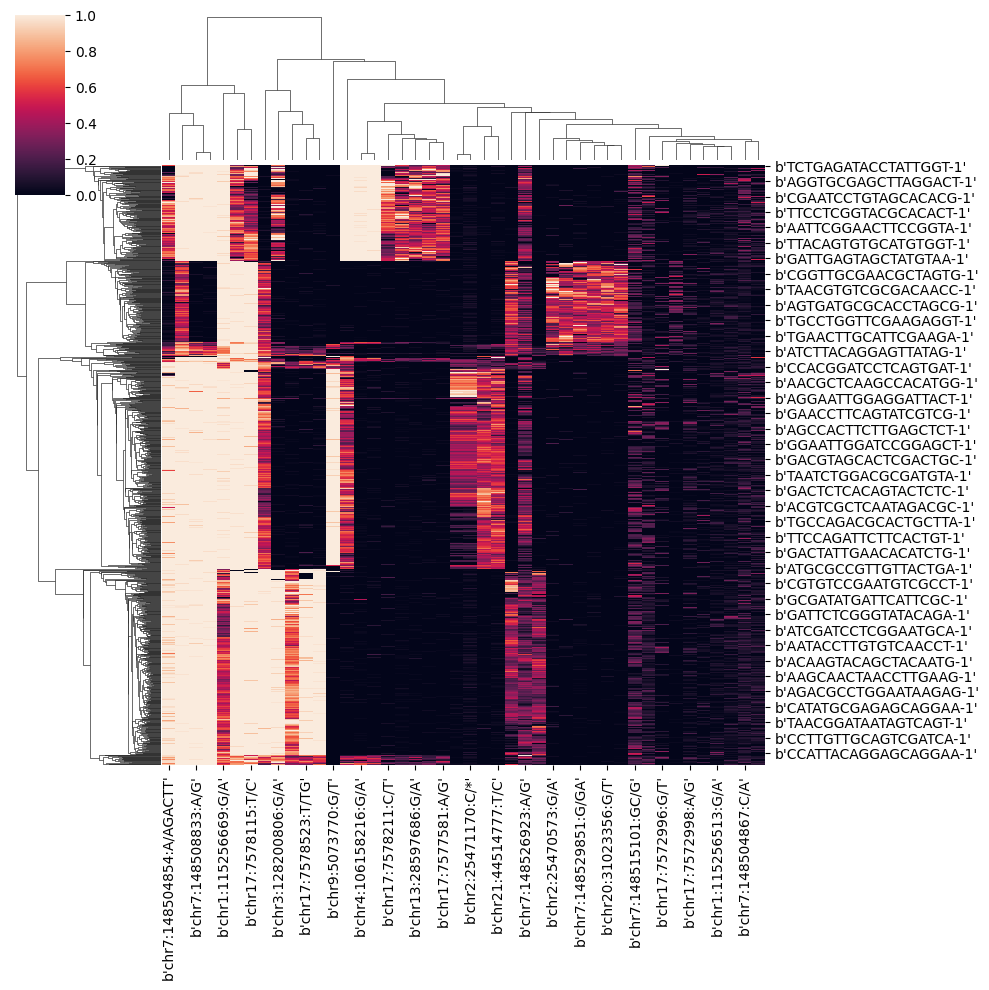

In [24]:
sns.clustermap(covs_filter, metric='euclidean')

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


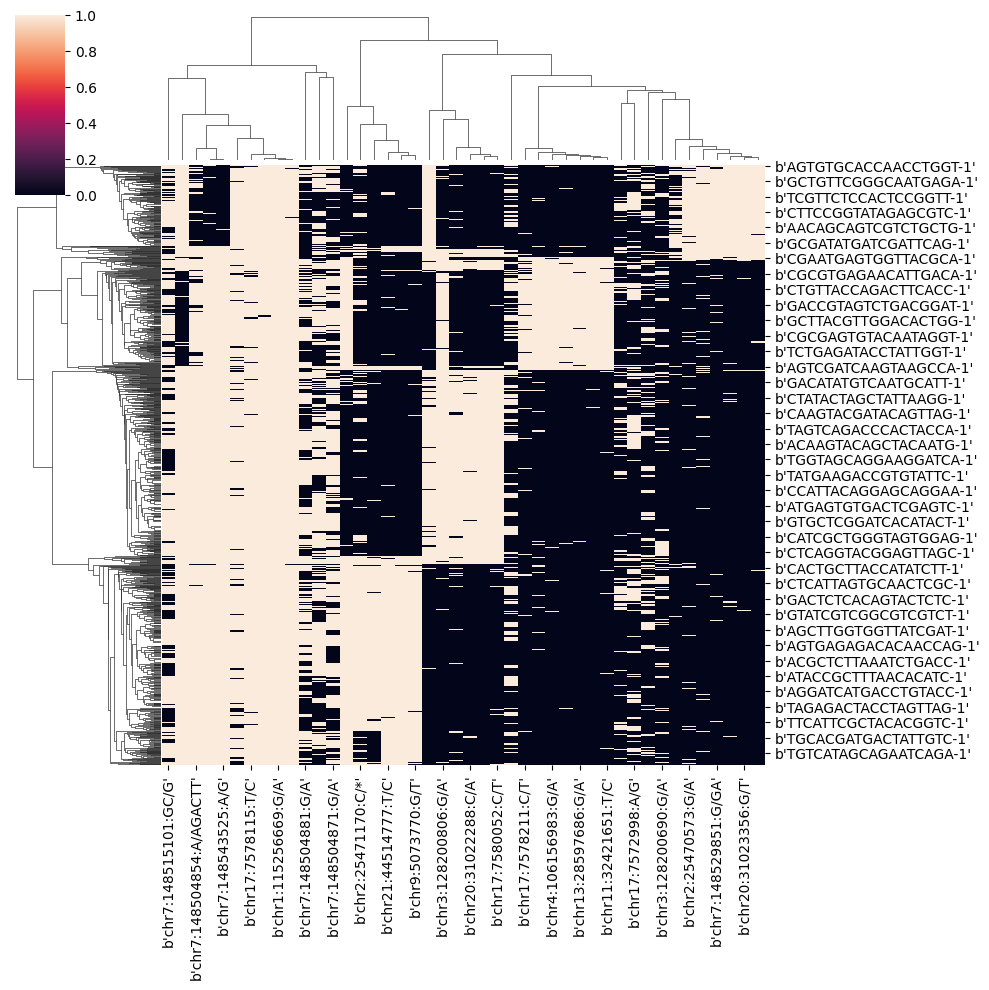

In [25]:
sns.clustermap(mutation_matrix, metric = 'hamming')

#### Variants filter + 1 if coverage > mean coverage cell

In [133]:
covs_filter_mean = covs_filter.join(covs_filter.mean(axis=1).rename('mean'))
mutation_matrix = covs_filter_mean.apply(lambda x : x/covs_filter_mean['mean']).drop(columns='mean') # mutation 1 only if cov > mean cov for the cell
mutation_matrix = mutation_matrix.applymap(lambda x : 1 if x > 1 else 0)

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


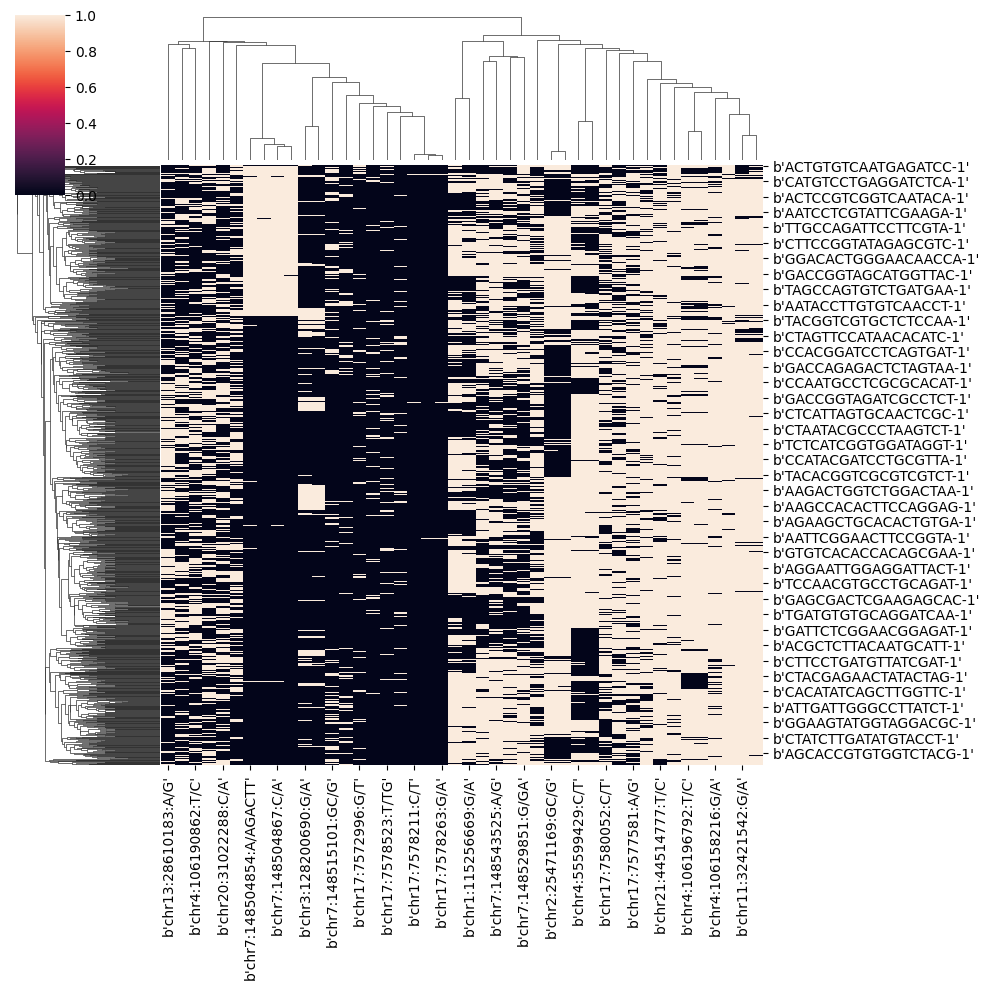

In [134]:
cluster_mutation = sns.clustermap(mutation_matrix) # scipy.cluster.hierarchy.linkage average 
cluster_mutation

<Axes: >

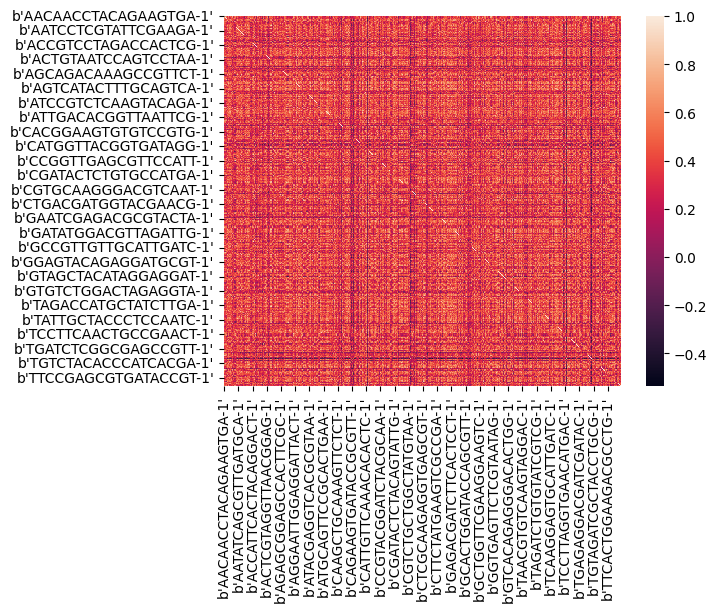

In [74]:
sns.heatmap(mutation_matrix.T.corr()) 

In [124]:
mutation_matrix.reset_index().reindex(mutation_matrix.reset_index().index.values[cluster_mutation.dendrogram_row.reordered_ind]).index

Index([ 142,  434,  795,  825,  163,  999,  291,  392,  841,  247,
       ...
        158,  452,   45, 1010,  399, 1013,   16,  533,  139,  619],
      dtype='int64', length=1201)

In [135]:
mutation_matrix_cluster_order = mutation_matrix.reindex(mutation_matrix.index.values[cluster_mutation.dendrogram_row.reordered_ind])

<Axes: >

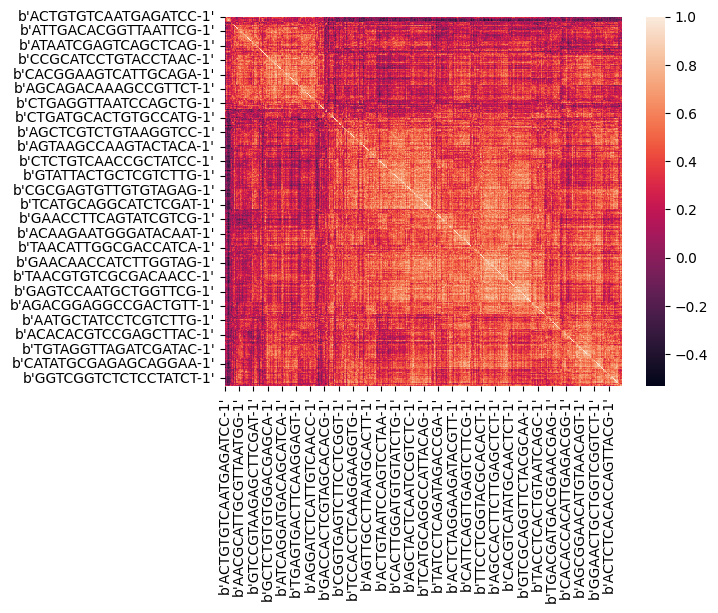

In [136]:
sns.heatmap(mutation_matrix_cluster_order.T.corr()) #  reorder with cluster (average method)

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


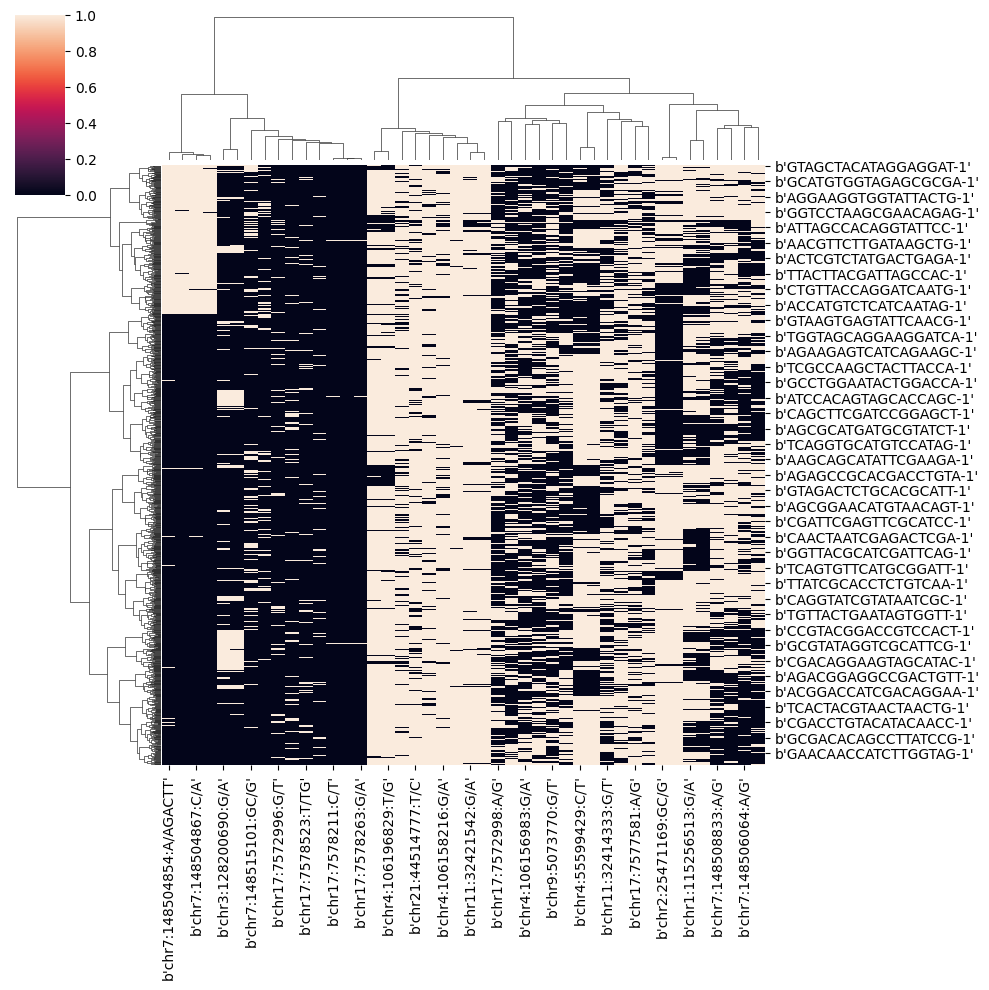

In [179]:
ward_cluster = sns.clustermap(mutation_matrix,method ='ward')

<Axes: >

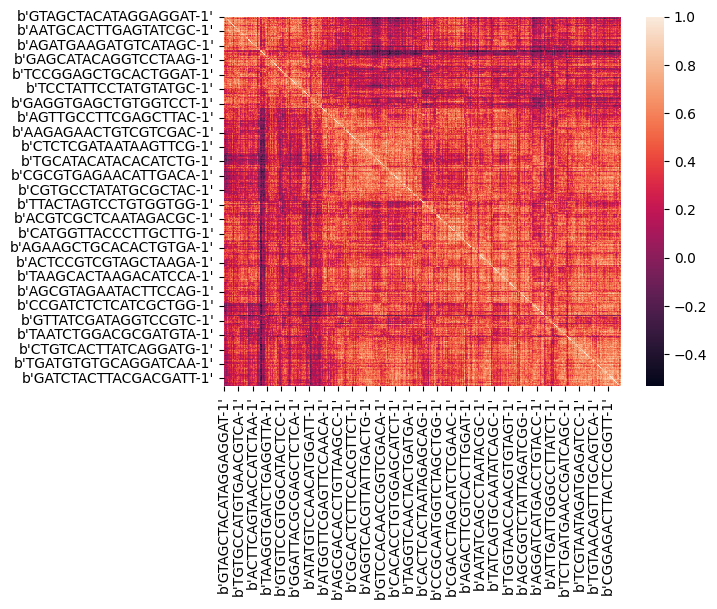

In [139]:
sns.heatmap(mutation_matrix.reindex(mutation_matrix.index.values[ward_cluster.dendrogram_row.reordered_ind]).T.corr()) #  reorder with cluster (ward method) 

#### Clustering methods comparaison

In [111]:
mutation_matrix_cluster_order

,b'chr1:115256513:G/A',b'chr1:115256669:G/A',b'chr2:25458546:C/T',b'chr2:25470573:G/A',b'chr2:25471169:GC/G',b'chr2:25471170:C/*',b'chr3:128200690:G/A',b'chr3:128200806:G/A',b'chr4:55599429:C/T',b'chr4:55599436:T/C',...,b'chr17:7577581:A/G',b'chr17:7578115:T/C',b'chr17:7578211:C/T',b'chr17:7578263:G/A',b'chr17:7578523:T/TG',b'chr17:7580052:C/T',b'chr20:31022288:C/A',b'chr20:31023356:G/T',b'chr21:36252917:C/T',b'chr21:44514777:T/C'
b'GTAGCTACATAGGAGGAT-1',1,1,1,0,1,1,1,1,0,0,...,0,0,0,0,0,0,0,1,1,0
b'ACTCCAACTAGTCGCCGA-1',1,1,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
b'ATCTCGAACTGGACGAGA-1',1,1,1,0,1,1,0,0,0,0,...,0,0,0,0,0,1,0,1,1,1
b'CAACCGGTCAGACATCCA-1',1,0,1,0,1,1,0,0,1,0,...,0,0,0,0,0,1,0,1,1,1
b'CATGGTCGAGACTTGATT-1',0,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TATGAGACCACTAAGTTC-1',1,1,0,0,1,1,0,0,1,1,...,1,0,0,0,0,1,1,1,1,1
b'GCCTTCCATGCCTGCATC-1',1,1,1,0,1,1,0,0,1,1,...,1,0,0,0,0,1,1,1,1,1
b'GTCCACAACAATACGTCT-1',1,1,1,0,1,1,0,0,1,1,...,1,0,0,0,0,0,1,1,1,1
b'ATGATAGCTATATCAGCC-1',1,0,1,0,1,1,0,0,1,1,...,1,0,0,0,0,1,1,1,1,1


In [143]:
mutation_matrix_cluster_order = mutation_matrix.reindex(mutation_matrix.index.values[ward_cluster.dendrogram_row.reordered_ind])

/tmp/ipykernel_287/1400860066.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


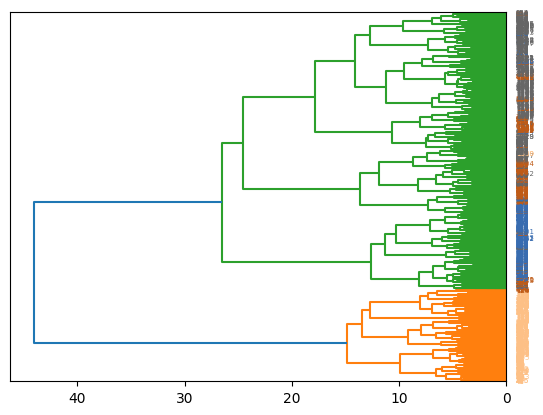

In [145]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_cluster_order.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 20, criterion='distance') #ward cluster (colors)
#cluster_labels = cluster_labels[ward_cluster.dendrogram_row.reordered_ind] #ward cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/1138975144.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


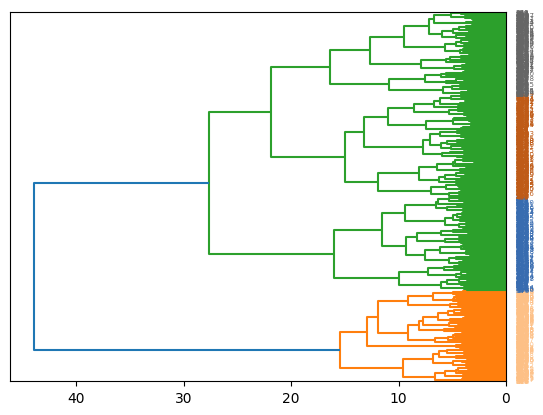

In [146]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 20, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[ward_cluster.dendrogram_row.reordered_ind] #ward cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/2552060312.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


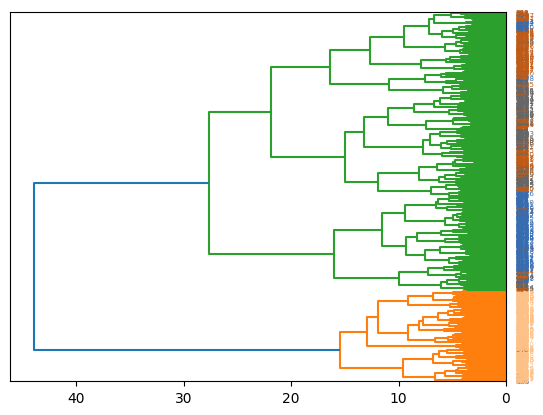

In [88]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 20, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

In [10]:
from sklearn.cluster import AgglomerativeClustering
clustering = AgglomerativeClustering(n_clusters=4).fit(mutation_matrix.to_numpy()) # ward
clustering.labels_

array([2, 1, 0, ..., 1, 3, 1])

In [11]:
unique, counts = np.unique(clustering.labels_ , return_counts = True)

In [12]:
unique,counts # cluster with roughly same size

(array([0, 1, 2, 3]), array([269, 297, 303, 332]))

#### Keep variant with big variance

#### 50 variants

In [197]:
mutation_matrix_hand_filter = covs.applymap(lambda x : 1 if x > 0 else 0)

In [198]:
mutation_matrix_hand_filter = mutation_matrix_hand_filter.loc[cell_filters.barcode[cell_filters.filtered == 0].values]
mutation_matrix_hand_filter = mutation_matrix_hand_filter[mutation_matrix_hand_filter.std().sort_values(ascending = False)[:50].index]
mutation_matrix_hand_filter

,b'chr20:31022823:T/',b'chr2:25461986:A/',b'chr4:106155265:T/',b'chr4:106155578:T/',b'chr3:128200777:C/',b'chr4:106158133:C/',b'chr4:106194139:T/',b'chr4:106156022:C/',b'chr17:74732293:A/',b'chr4:106155573:T/',...,b'chr4:106157860:A/',b'chr2:25470506:T/',b'chr7:148529733:T/',b'chr2:25471033:C/',b'chr4:106193880:A/',b'chr2:25467475:T/',b'chr2:25470512:G/',b'chr4:106156016:A/',b'chr2:25467480:G/',b'chr13:28602406:T/'
b'AACAACCTACAGAAGTGA-1',1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
b'AACAACCTATCTATGACA-1',0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b'AACAACTGGCAACGCACA-1',1,1,1,1,1,1,1,1,0,0,...,1,1,1,1,1,0,0,1,0,1
b'AACACACTCTTACAGTGT-1',0,1,1,1,0,1,0,0,1,1,...,0,1,1,1,1,0,1,0,0,0
b'AACAGCAGTCGTCTGCTG-1',0,1,0,1,1,0,0,0,1,0,...,1,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',1,1,1,0,0,1,0,0,0,0,...,1,1,1,1,1,0,0,1,0,0
b'TTGGAGAACTGAACTTGC-1',1,0,1,1,0,1,1,1,1,1,...,1,1,1,1,1,1,0,1,0,1
b'TTGGTAACTTCTGCGCTG-1',1,1,1,0,1,1,1,0,0,1,...,1,1,1,1,1,1,0,1,1,1
b'TTGTCAACCGCAGCAGTG-1',1,1,0,0,1,0,0,1,0,0,...,1,0,0,1,0,0,0,1,1,0


/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


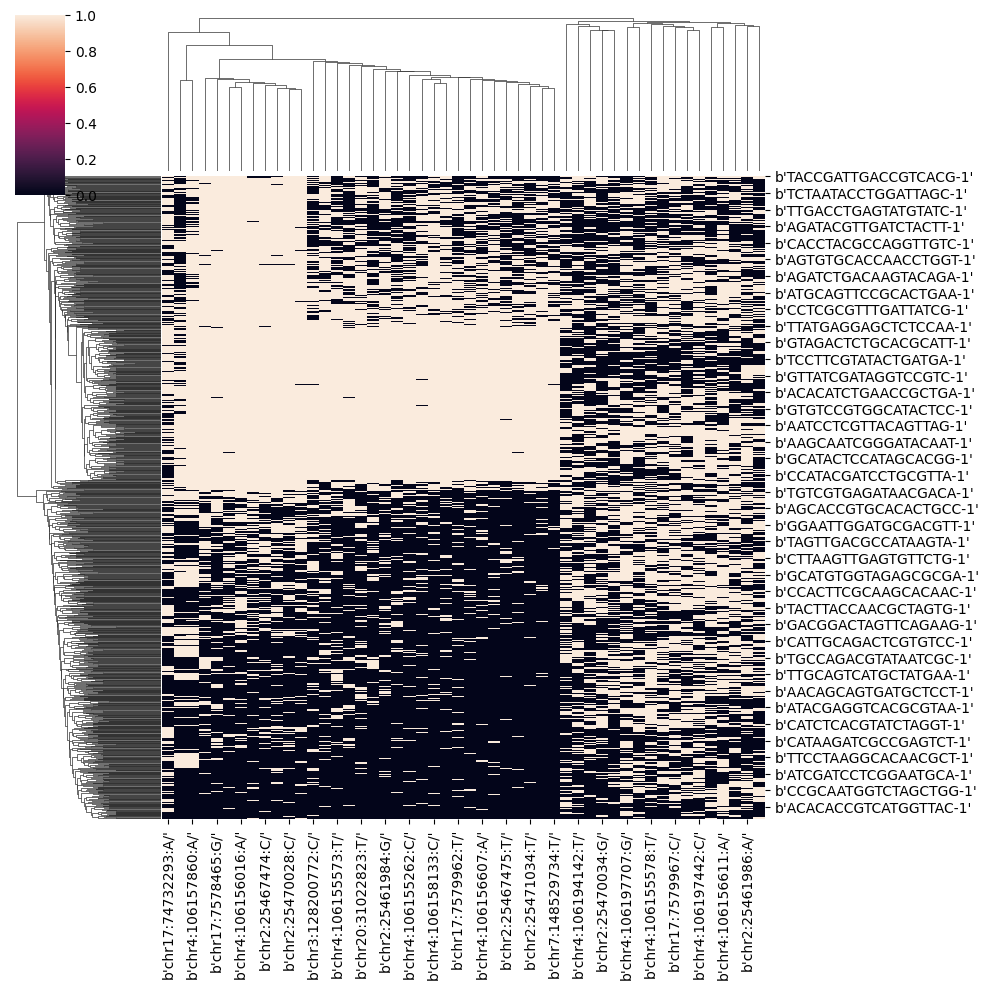

In [199]:
cluster_mutation_hand_filter = sns.clustermap(mutation_matrix_hand_filter) # scipy.cluster.hierarchy.linkage average 
cluster_mutation_hand_filter

<Axes: >

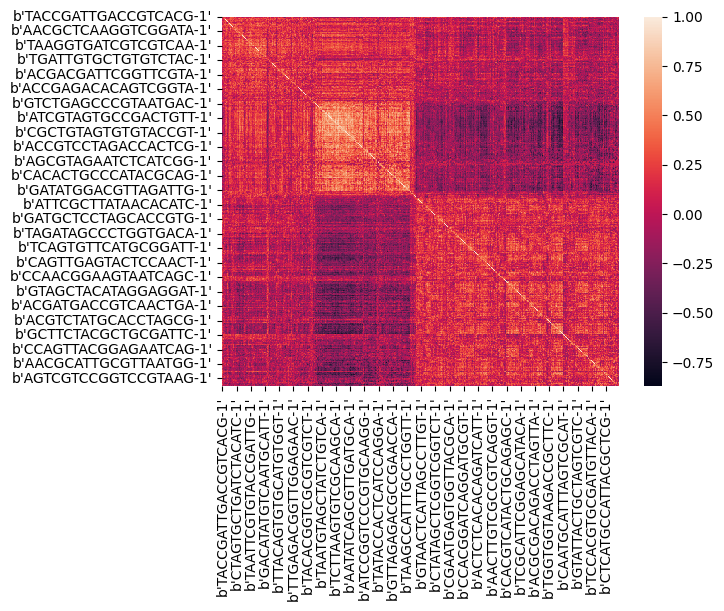

In [200]:
mutation_matrix_cluster_order_hand_filter = mutation_matrix_hand_filter.reindex(mutation_matrix_hand_filter.index.values[cluster_mutation_hand_filter.dendrogram_row.reordered_ind])
sns.heatmap(mutation_matrix_cluster_order_hand_filter.T.corr()) #  reorder with cluster (average method)

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


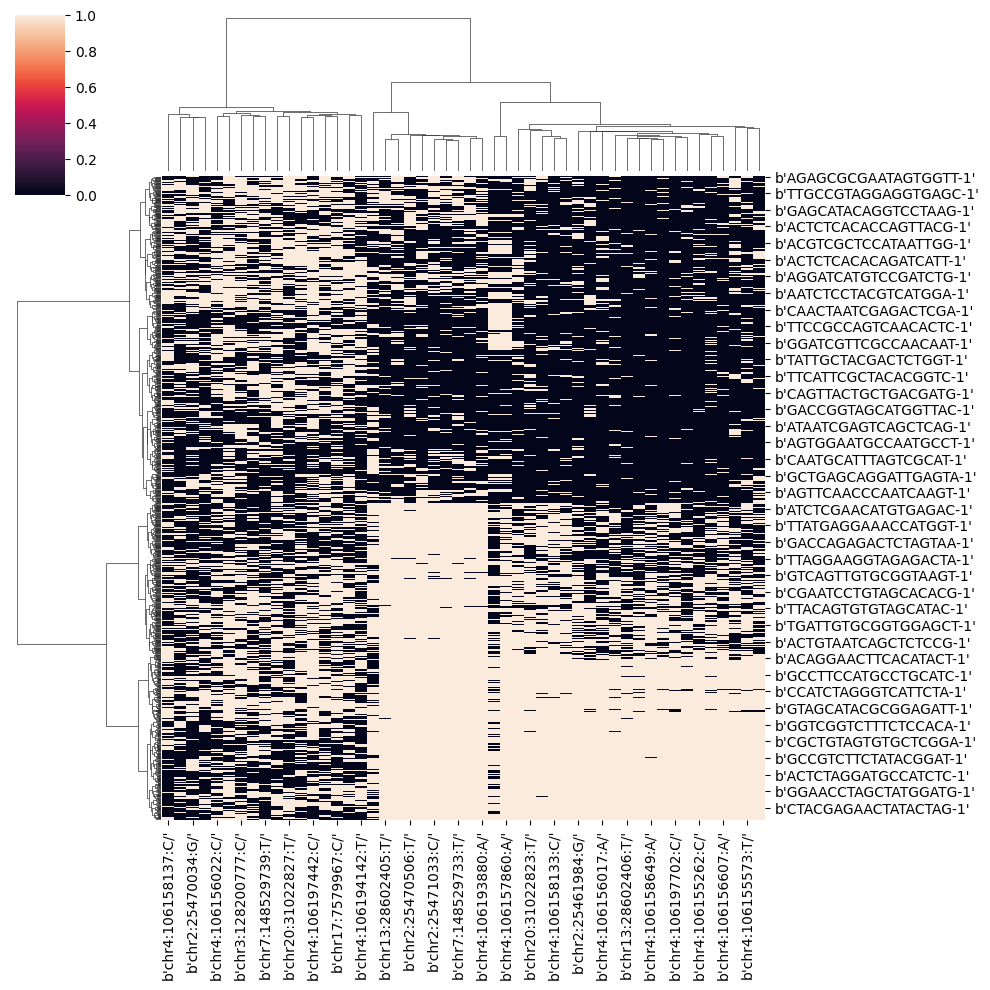

In [201]:
cluster_mutation_hand_filter_ward = sns.clustermap(mutation_matrix_hand_filter, method='ward') # scipy.cluster.hierarchy.linkage ward 
cluster_mutation_hand_filter_ward

<Axes: >

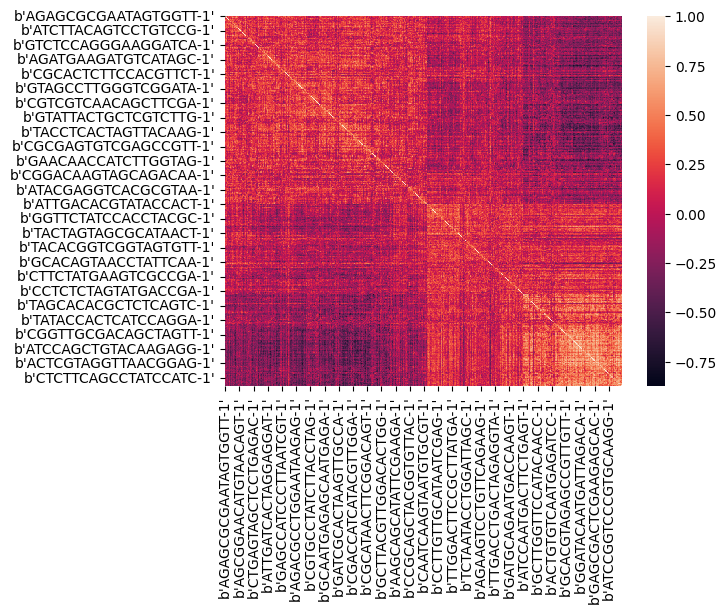

In [202]:
mutation_matrix_cluster_order_hand_filter_ward = mutation_matrix_hand_filter.reindex(mutation_matrix_hand_filter.index.values[cluster_mutation_hand_filter_ward.dendrogram_row.reordered_ind])
sns.heatmap(mutation_matrix_cluster_order_hand_filter_ward.T.corr()) #  reorder with cluster (ward method)

/tmp/ipykernel_287/664898608.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


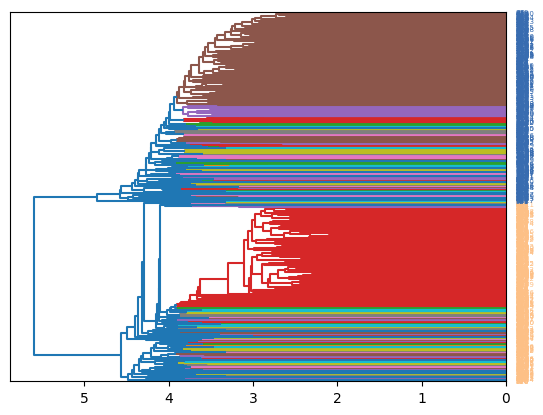

In [203]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='average', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 5.5, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/2763565284.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


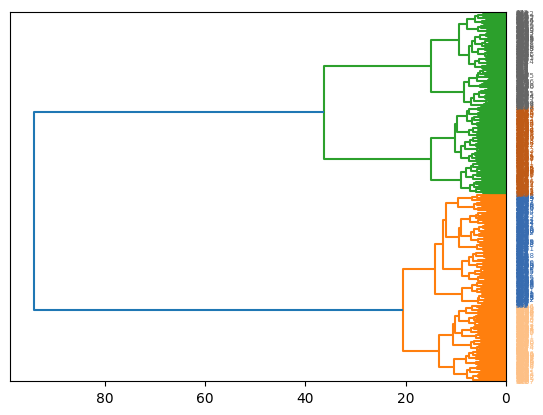

In [204]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 20, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter_ward.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/3109091843.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


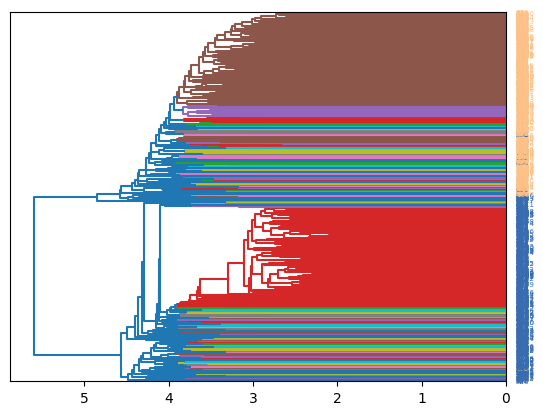

In [205]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='average', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 5.5, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter_ward.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/3970488267.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


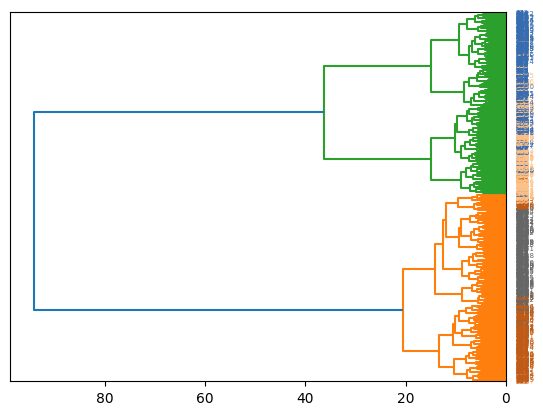

In [206]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 20, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

#### 100 variants

In [225]:
mutation_matrix_hand_filter = covs.applymap(lambda x : 1 if x > 0 else 0)

mutation_matrix_hand_filter = mutation_matrix_hand_filter.loc[cell_filters.barcode[cell_filters.filtered == 0].values]
mutation_matrix_hand_filter = mutation_matrix_hand_filter[mutation_matrix_hand_filter.std().sort_values(ascending = False)[:100].index]
mutation_matrix_hand_filter

,b'chr20:31022823:T/',b'chr2:25461986:A/',b'chr4:106155265:T/',b'chr4:106155578:T/',b'chr3:128200777:C/',b'chr4:106158133:C/',b'chr4:106194139:T/',b'chr4:106156022:C/',b'chr17:74732293:A/',b'chr4:106155573:T/',...,b'chr17:74732357:C/',b'chr17:74732356:A/',b'chr17:74732355:G/',b'chr17:74732354:G/A',b'chr17:74732353:G/',b'chr17:74732351:C/',b'chr17:74732372:A/G',b'chr17:74732411:T/',b'chr17:74732410:G/',b'chr17:74732399:C/'
b'AACAACCTACAGAAGTGA-1',1,1,1,1,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
b'AACAACCTATCTATGACA-1',0,0,1,1,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
b'AACAACTGGCAACGCACA-1',1,1,1,1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
b'AACACACTCTTACAGTGT-1',0,1,1,1,0,1,0,0,1,1,...,1,1,1,1,1,1,1,1,1,1
b'AACAGCAGTCGTCTGCTG-1',0,1,0,1,1,0,0,0,1,0,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b'TTGGACTTCCGCTTATGA-1',1,1,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b'TTGGAGAACTGAACTTGC-1',1,0,1,1,0,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
b'TTGGTAACTTCTGCGCTG-1',1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
b'TTGTCAACCGCAGCAGTG-1',1,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


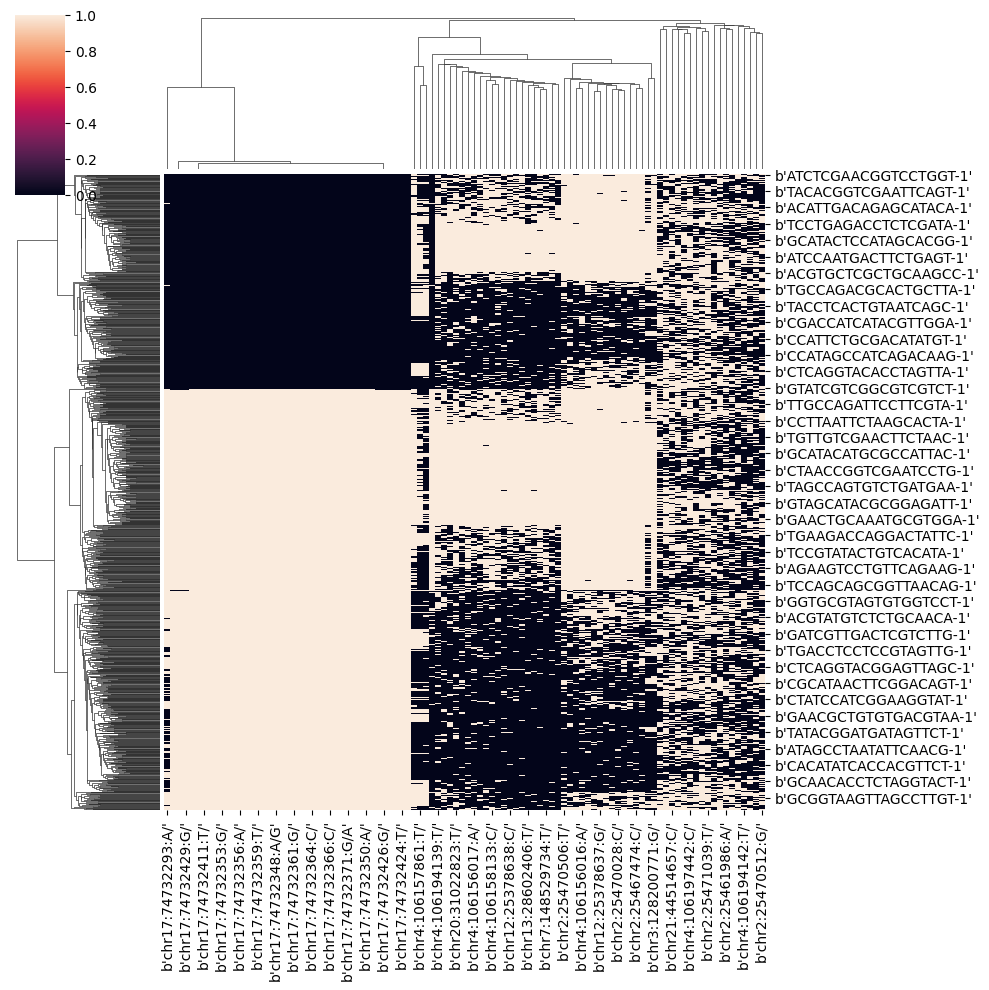

In [210]:
cluster_mutation_hand_filter = sns.clustermap(mutation_matrix_hand_filter) # scipy.cluster.hierarchy.linkage average 
cluster_mutation_hand_filter

<Axes: >

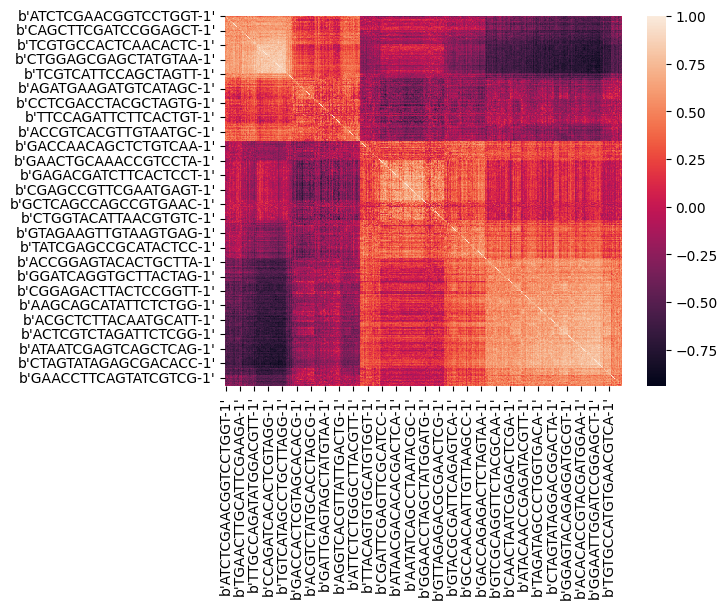

In [211]:
mutation_matrix_cluster_order_hand_filter = mutation_matrix_hand_filter.reindex(mutation_matrix_hand_filter.index.values[cluster_mutation_hand_filter.dendrogram_row.reordered_ind])
sns.heatmap(mutation_matrix_cluster_order_hand_filter.T.corr()) #  reorder with cluster (average method)

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


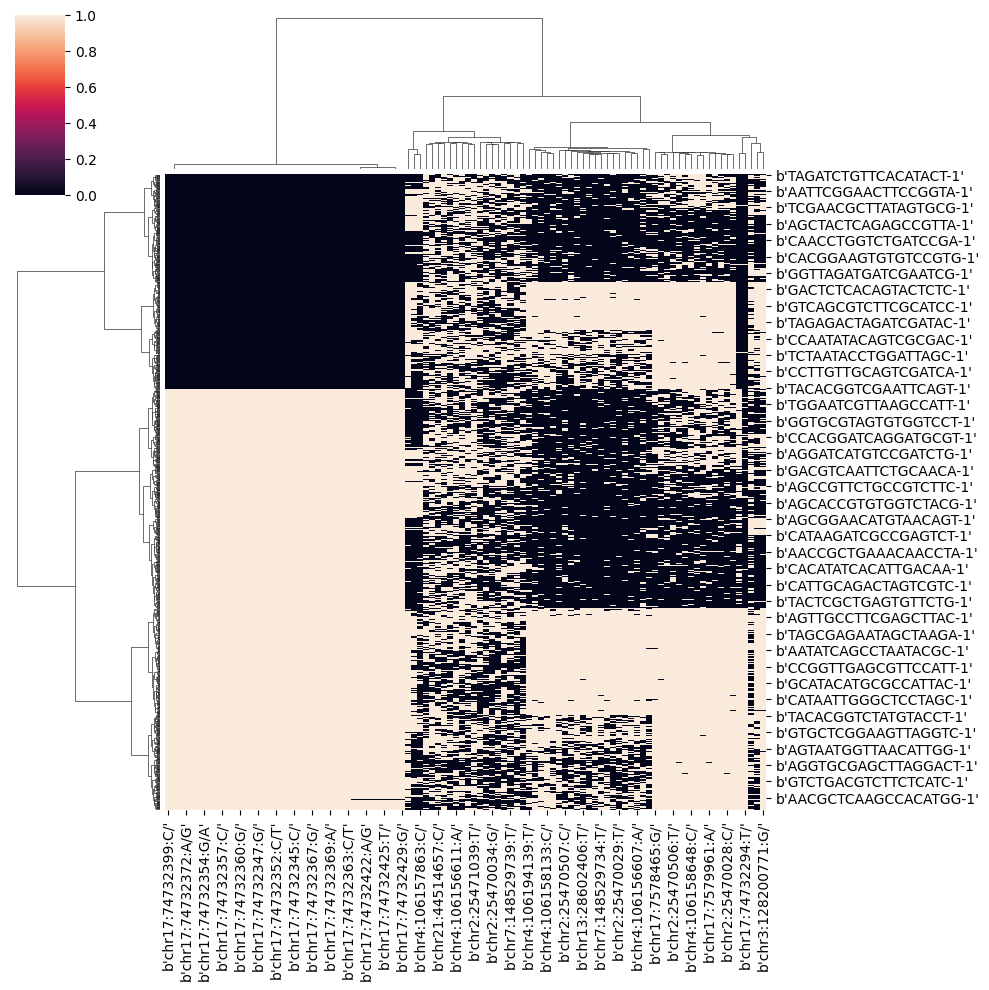

In [226]:
cluster_mutation_hand_filter_ward = sns.clustermap(mutation_matrix_hand_filter, method='ward') # scipy.cluster.hierarchy.linkage ward 
cluster_mutation_hand_filter_ward

<Axes: >

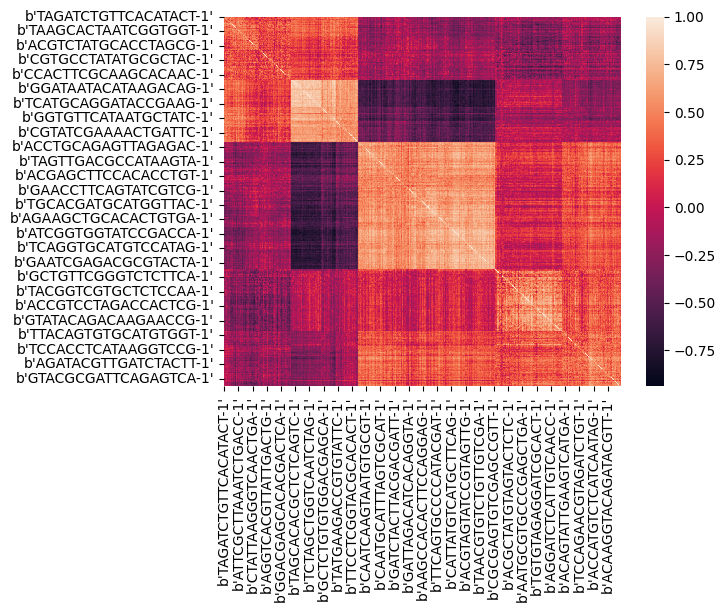

In [227]:
mutation_matrix_cluster_order_hand_filter_ward = mutation_matrix_hand_filter.reindex(mutation_matrix_hand_filter.index.values[cluster_mutation_hand_filter_ward.dendrogram_row.reordered_ind])
sns.heatmap(mutation_matrix_cluster_order_hand_filter_ward.T.corr()) #  reorder with cluster (ward method)

/tmp/ipykernel_287/664898608.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


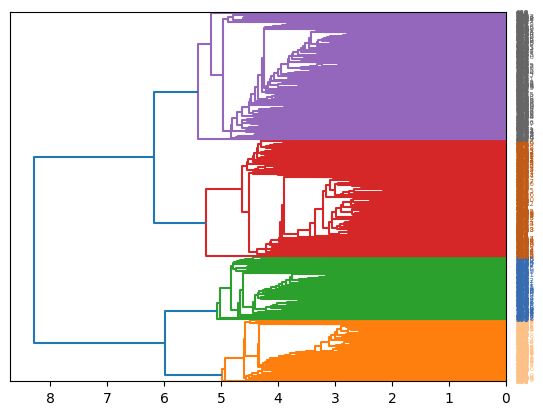

In [214]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='average', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 5.5, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/2763565284.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


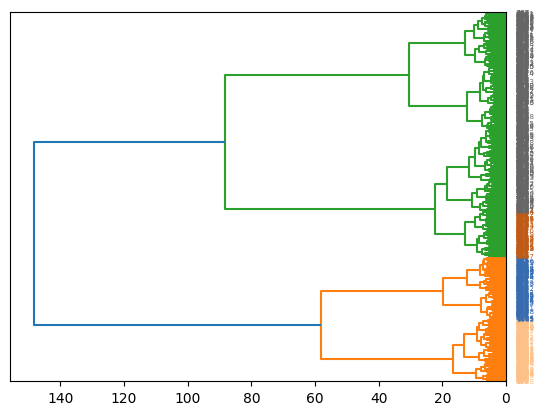

In [215]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 20, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter_ward.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/3109091843.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


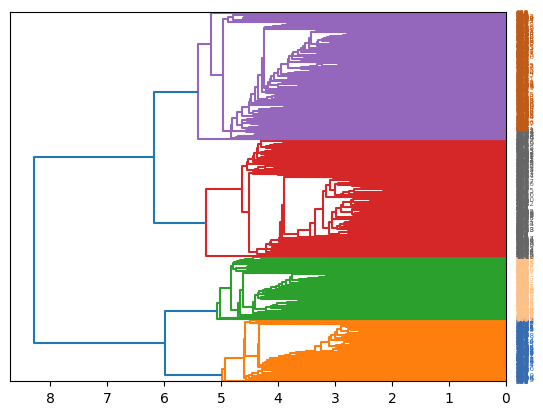

In [216]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='average', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 5.5, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter_ward.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/tmp/ipykernel_287/3970488267.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


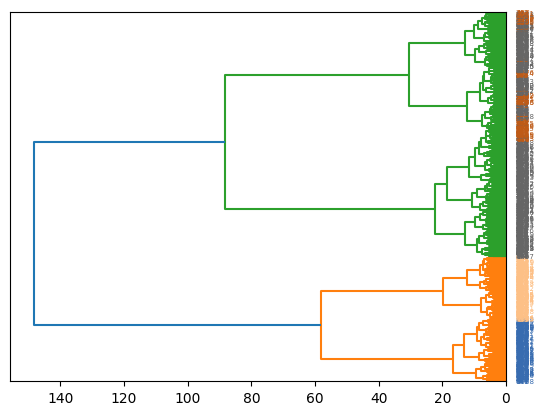

In [217]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 20, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[cluster_mutation_hand_filter.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

#### Filtering methods comparaison

/tmp/ipykernel_287/1674897713.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_palette = plt.cm.get_cmap("Accent", 5)


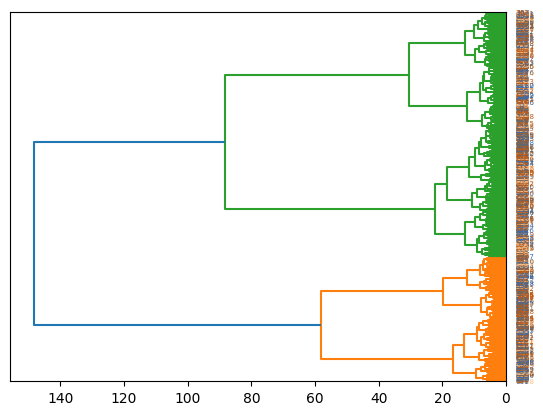

In [178]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linkage_data = linkage(mutation_matrix_hand_filter.to_numpy(), method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_rotation=0, orientation="left")

cluster_labels = fcluster(linkage_data,t = 40, criterion='distance') #ward cluster (colors)
cluster_labels = cluster_labels[ward_cluster.dendrogram_row.reordered_ind] #average cluster (reordering, position)

my_palette = plt.cm.get_cmap("Accent", 5)

# Apply the right color to each label
ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
num=-1
for lbl in xlbls:
    num+=1
    val=cluster_labels[num]
    lbl.set_color(my_palette(val))

# Show the graph
plt.show()

/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/sopchr/anaconda3/envs/seqdemo/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


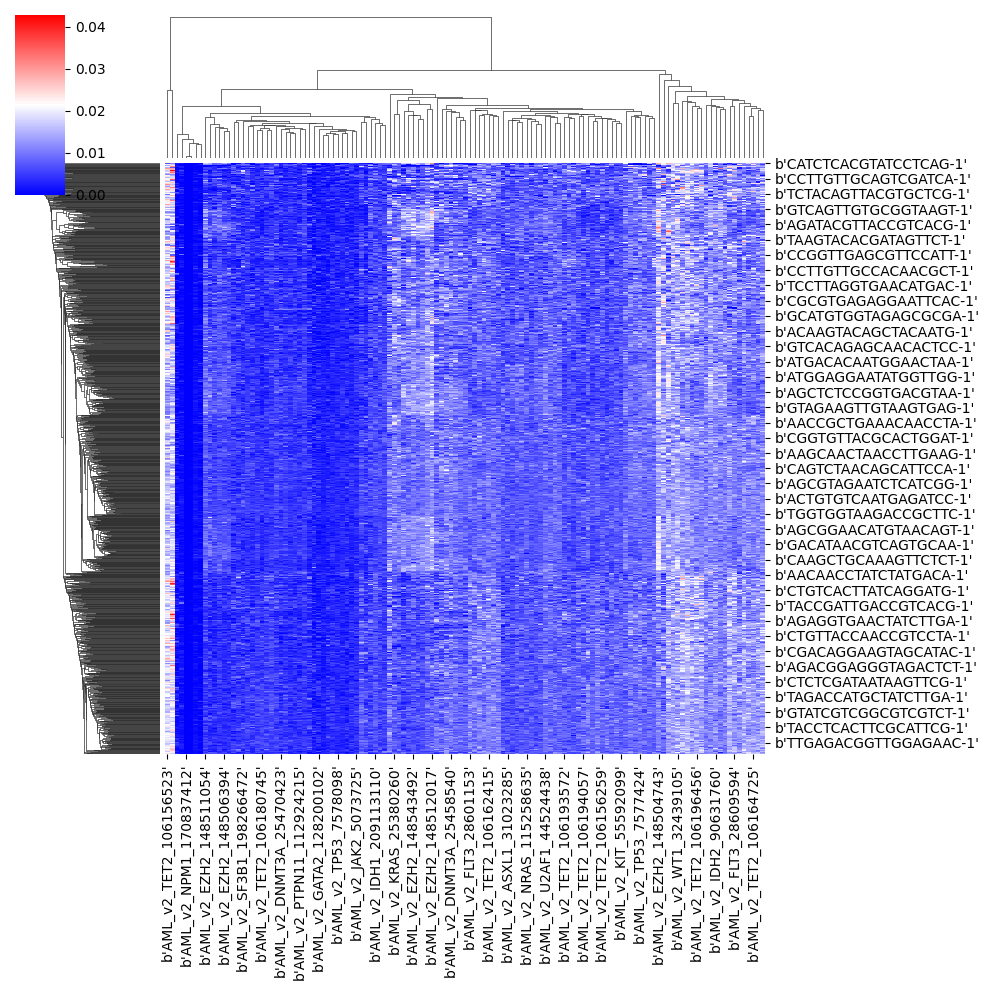

In [218]:
#mean_tot_nb_read_cell = read_counts.sum(axis=1).mean()
read_cluster = sns.clustermap((read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0)), col_cluster=True, cmap="bwr") # cluster after normalization*
read_cluster

In [275]:
var_cluster =  mutation_matrix_hand_filter[mutation_matrix_hand_filter.columns.values[cluster_mutation_hand_filter_ward.dendrogram_col.reordered_ind]].columns
var_amplicon_cluster_relation = pd.DataFrame({'cluster_variant': var_cluster}).set_index('cluster_variant')
var_amplicon_cluster_relation

""
cluster_variant
b'chr17:74732399:C/'
b'chr17:74732410:G/'
b'chr17:74732411:T/'
b'chr17:74732372:A/G'
b'chr17:74732351:C/'
...
b'chr17:74732293:A/'
b'chr17:74732294:T/'
b'chr3:128200777:C/'


In [276]:
var_amplicon_cluster_relation = var_amplicon_cluster_relation.join(variants[['id','amplicon']].set_index('id')) #.pivot_table()
var_amplicon_cluster_relation['link'] = [1 for _ in range(100)]

In [277]:
var_amplicon_cluster_relation = pd.pivot_table(var_amplicon_cluster_relation,values='link',index='cluster_variant', columns=['amplicon']).fillna(0)

<Axes: xlabel='cluster_variant', ylabel='amplicon'>

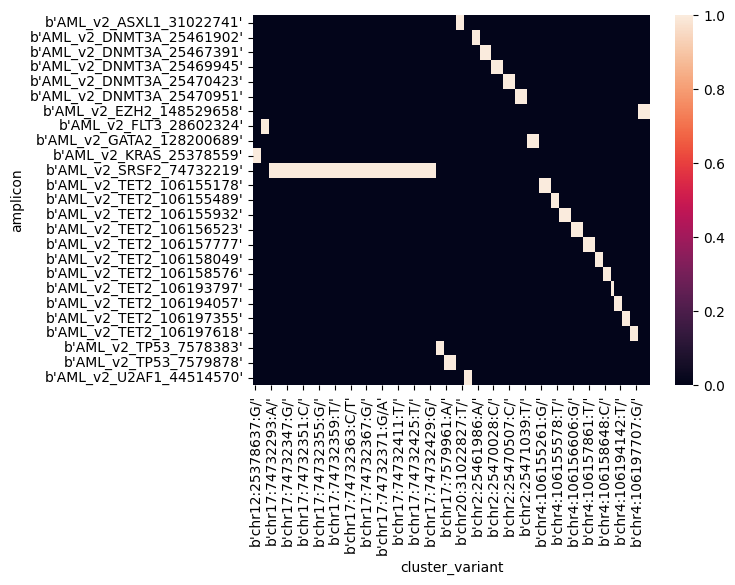

In [285]:
sns.heatmap(var_amplicon_cluster_relation.T)

<Axes: >

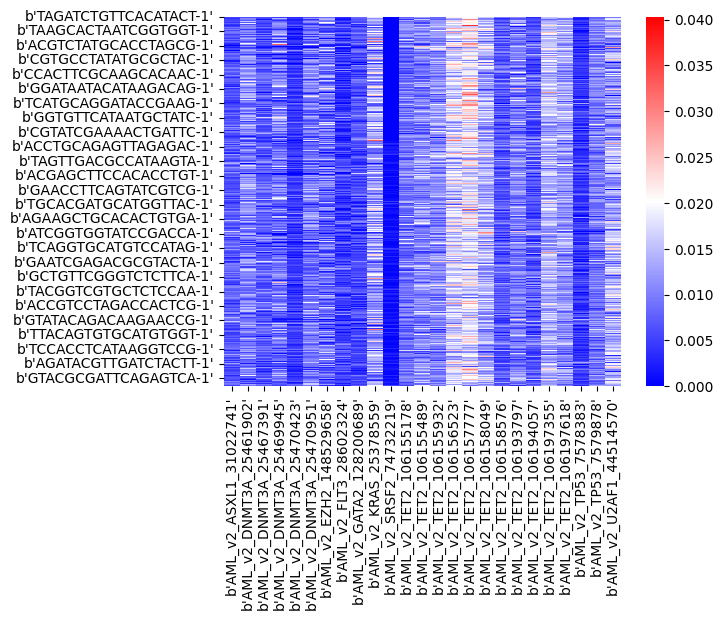

In [282]:
norm_read_count_var_cluster = read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0)
norm_read_count_var_cluster = norm_read_count_var_cluster.reindex(mutation_matrix_cluster_order_hand_filter_ward.index.values)
sns.heatmap(norm_read_count_var_cluster[var_amplicon_cluster_relation.columns],cmap="bwr")

<Axes: >

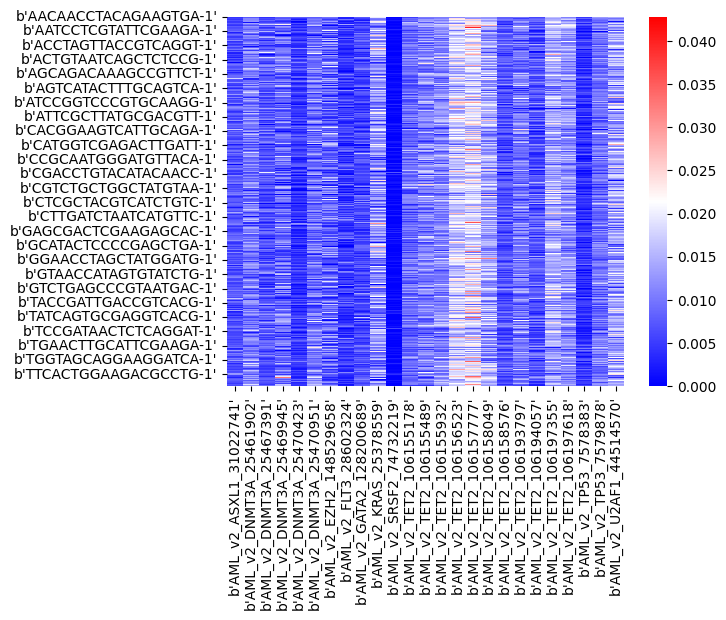

In [286]:
sns.heatmap(read_counts.apply(lambda x : x/read_counts.sum(axis=1), axis=0)[var_amplicon_cluster_relation.columns],cmap="bwr")

<Axes: >

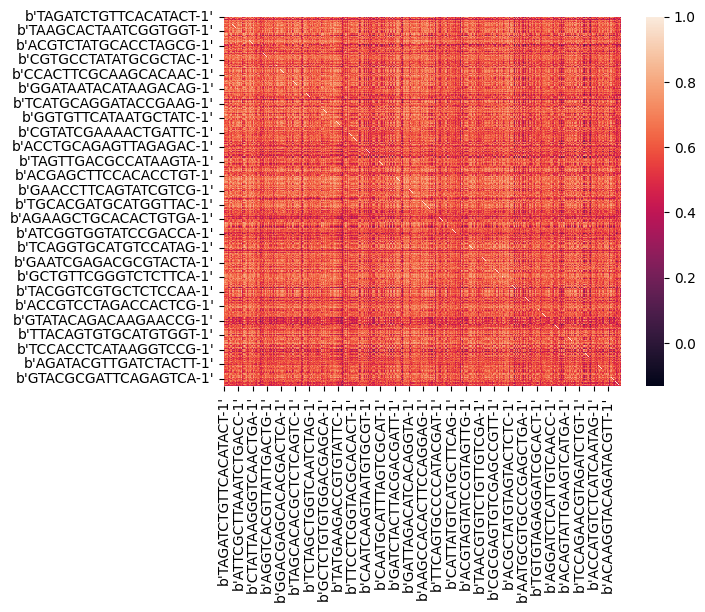

In [238]:
sns.heatmap(norm_read_count_var_cluster.T.corr())